In [1]:
import sklearn
import numpy
import math

print('The scikit-learn verison is {}.'.format(sklearn.__version__))
print('The numpy versions i {}.'.format(numpy.__version__))
# lt. Paper: Imbalanced-learn: A Python Toolbox to Tackle the Curse of Imbalanced Datasets in 
# Machine Learning ist nur RandomOverSampler für den Multi-class-Fall anwendbar
#from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN, KMeansSMOTE, SVMSMOTE

import numpy as np
from numpy import mean, std
import matplotlib.pyplot as plt

from sklearn.svm import SVC
from sklearn.svm import LinearSVC
#from sklearn.multiclass import OneVsRestClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
#from sklearn.model_selection import RepeatedStratifiedKFold
#from sklearn.model_selection import StratifiedKFold

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import classification_report, confusion_matrix

from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score, balanced_accuracy_score 

from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import auc
from sklearn.metrics import roc_curve, precision_recall_curve

from sklearn.preprocessing import LabelBinarizer

from sklearn.utils import shuffle
from sklearn.utils.multiclass import unique_labels

from skimage import exposure, feature, transform
import pickle as pkl
from sklearn.decomposition import PCA

from itertools import product
from itertools import cycle

import seaborn as sns

import time
import timeit
from timeit import default_timer as timer

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
%matplotlib inline

import csv
import pandas as pd
# zum Visualisieren der Daten mithilfe von PCA
from mpl_toolkits.mplot3d import Axes3D

# jupyter notebooks als Module importieren
!pip install import-ipynb
import import_ipynb
import save_load
from save_load import load_hog_features, load_vgg16_features, load_labels, save_trained_model_as_pkl, load_trained_model_from_pkl, save_as_csv, read_csv, make_subsets_training_data_A
import tools
from tools import roc_auc_score_multiclass, roc_auc_score_single_class, scale_train_test_data, scale_train_test_data_without_std, scale_train_test_data_without_mean





def load_hog_features(path_train):
    X_hog = np.load(path_train)
    return X_hog

def load_labels(path_train):
    y_label = np.load(path_train)
    return y_label

'''
speichert trainierte Modelle bzw. Ergebnisse wiederholter Grid Search Anwendungen als Pickle-Datei.
Diese gespeicherten Modelle können mit Funktion   load_trained_model_from_pkl(name)
'''

def save_trained_model_as_pkl(model, filename):
    with open(filename, 'wb') as file:
        pkl.dump(model, file)  
        
'''
lädt bereits trainiertes, als Pickle-Datei gespeichertes Modell bzw. Ergebnisse wiederholter
Grid Search Anwendungen
'''
def load_trained_model_from_pkl(filename):
    with open(filename, 'rb') as file:
        new_model=pkl.load(file)
    return new_model

'''
speichern und lesen von CSV-Dateien
'''
def save_as_csv(list,path,name):
    path = path+name    
    with open(path, "w") as file:
        csv_wr = csv.writer(file)
        csv_wr.writerows(list)
        
def read_csv(path):
    read_file = []
    with open(path, "r") as file:
        csv_r = csv.reader(file)
        for row in csv_r:
            if row:
                read_file.append(row)
    return read_file



# in Anlehnung an:   https://medium.com/@plog397/auc-roc-curve-scoring-function-for-multi-class-classification-9822871a6659
def roc_auc_score_multiclass(y_test, y_pred, average='macro'):    
    labelBin = LabelBinarizer()
    labelBin.fit(y_test)    
    y_test = labelBin.transform(y_test)
    y_pred = labelBin.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)


'''
Roc_Auc_score für die einzelnen Klassen berechnen
'''
def roc_auc_score_single_class(y_test, y_pred, average = "macro"):
    # Menge der einzelnen Klassen erstellen
    single_classes = set(y_test)
    roc_aucs = {}
    for cl in single_classes:
        #Liste der restlichen Klassen erstellen
        remain_classes = [x for x in single_classes if x != cl]

        # aktuelle Klasse mit 1 markieren und alle anderen Klassen mit 0
        y_test_roc = [0 if x in remain_classes else 1 for x in y_test]
        y_pred_roc = [0 if x in remain_classes else 1 for x in y_pred]

        # roc_auc_score berechnen
        roc_auc = roc_auc_score(y_test_roc, y_pred_roc, average = average)
        roc_aucs[cl] = roc_auc

    return roc_aucs



def convert_string_to_int(y_true, y_pred):
    y_true_int = []
    y_pred_int = []
    for i in range(0, len(y_true)):
        y_true_int.append(int(y_true[i]))
        y_pred_int.append(int(y_pred[i]))
    return y_true_int, y_pred_int 




def plot_confusion_matrix_norm(y_test, y_pred, title):        
    classes = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18',
              '19','20','21','22','23','24','25','26','27','28','29','30','31','32','33','34','35',
              '36','37','38','39','40','41','42']  
    y_test_int, y_pred_int = convert_string_to_int(y_test, y_pred)
    cm = confusion_matrix(y_test_int, y_pred_int)    
    np.set_printoptions(precision=3)    
    #plt.figure(figsize=(4.5*2, 2.5*2))
    #plt.figure(figsize=(9*2, 5*2))
    #plt.figure(figsize=(13.5*2, 7.5*2))
    
    fig = plt.figure(figsize=(18*2, 10*2))
    #fig.suptitle('Confusion matrix ', fontsize=20, fontweight='medium')
    normalize=True    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix  '+title, fontsize=28)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 1.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):            
    #for i, j in product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
    plt.ylabel('True label', fontsize=24)
    plt.xlabel('Predicted label', fontsize=24)
    plt.tight_layout()
    plt.show()
    return fig


# Classification report ausgeben
def classif_report(y_te, y_pred):
    y_test_int, y_pred_int = convert_string_to_int(y_te, y_pred)
    print(classification_report(y_test_int, y_pred_int))   



'''
erstellen unterschiedlicher Trainingsmengen aus 39.209 Trainingsdaten
Datensätze werden zufällig aber reproduzierbar durch random_state=0
unter Berücksichtigung der prozentualen Anteile der Daten in den
einzelnen Klassen, erstellt.
Tracks werden nicht berücksichtigt
'''
def make_training_subsets_A(X_tr, y_tr):
    # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
    X_tr, y_tr = shuffle(X_tr, y_tr, random_state=42)    
    # Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
        X_tr, y_tr, random_state = 0, train_size=20000/39209, stratify=y_tr)
    # Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
        X_tr_20000, y_tr_20000, random_state = 0, train_size=1/2, stratify=y_tr_20000)
    # Trainingsmenge mit 5.000 Bilder erzeugen   
    X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
        X_tr_10000, y_tr_10000, random_state = 0, train_size=1/2, stratify=y_tr_10000)
     #Trainingsmenge mit 2.000 Bilder erzeugen   
    X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
        X_tr_5000, y_tr_5000, random_state = 0, train_size=2/5, stratify=y_tr_5000)
     #Trainingsmenge mit 1.000 Bilder erzeugen   
    X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
        X_tr_2000, y_tr_2000, random_state = 0, train_size=1/2, stratify=y_tr_2000)
    # Trainingsmenge mit 500 Bilder erzeugen   
    X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
        X_tr_1000, y_tr_1000, random_state = 0, train_size=1/2, stratify=y_tr_1000)
    # Trainingsmenge mit 200 Bilder erzeugen   
    X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
        X_tr_500, y_tr_500, random_state = 0, train_size=2/5, stratify=y_tr_500)
    return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200


'''
erstellen unterschiedlicher Trainingsmengen aus 39.209 Trainingsdaten
Datensätze werden zufällig aber reproduzierbar durch random_state=0
unter Berücksichtigung der prozentualen Anteile der Daten in den
einzelnen Klassen, erstellt.
Tracks werden nicht berücksichtigt
'''
def make_training_subsets_B(X_tr, y_tr):
    # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
    X_tr, y_tr = shuffle(X_tr, y_tr, random_state=17)    
    # Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
        X_tr, y_tr, random_state = 7, train_size=20000/39209, stratify=y_tr)
    # Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
        X_tr_20000, y_tr_20000, random_state = 6, train_size=1/2, stratify=y_tr_20000)
    # Trainingsmenge mit 5.000 Bilder erzeugen   
    X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
        X_tr_10000, y_tr_10000, random_state = 5, train_size=1/2, stratify=y_tr_10000)
     #Trainingsmenge mit 2.000 Bilder erzeugen   
    X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
        X_tr_5000, y_tr_5000, random_state = 4, train_size=2/5, stratify=y_tr_5000)
     #Trainingsmenge mit 1.000 Bilder erzeugen   
    X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
        X_tr_2000, y_tr_2000, random_state = 3, train_size=1/2, stratify=y_tr_2000)
    # Trainingsmenge mit 500 Bilder erzeugen   
    X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
        X_tr_1000, y_tr_1000, random_state = 2, train_size=1/2, stratify=y_tr_1000)
    # Trainingsmenge mit 200 Bilder erzeugen   
    X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
        X_tr_500, y_tr_500, random_state = 1, train_size=2/5, stratify=y_tr_500)
    return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200



'''
erstellen unterschiedlicher Trainingsmengen aus 39.209 Trainingsdaten
Datensätze werden zufällig aber reproduzierbar durch random_state=0
unter Berücksichtigung der prozentualen Anteile der Daten in den
einzelnen Klassen, erstellt.
Tracks werden nicht berücksichtigt
'''
def make_training_subsets_C(X_tr, y_tr):
    # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
    X_tr, y_tr = shuffle(X_tr, y_tr, random_state=12)    
    # Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
        X_tr, y_tr, random_state = 13, train_size=20000/39209, stratify=y_tr)
    # Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
        X_tr_20000, y_tr_20000, random_state = 14, train_size=1/2, stratify=y_tr_20000)
    # Trainingsmenge mit 5.000 Bilder erzeugen   
    X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
        X_tr_10000, y_tr_10000, random_state = 19, train_size=1/2, stratify=y_tr_10000)
     #Trainingsmenge mit 2.000 Bilder erzeugen   
    X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
        X_tr_5000, y_tr_5000, random_state = 20, train_size=2/5, stratify=y_tr_5000)
     #Trainingsmenge mit 1.000 Bilder erzeugen   
    X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
        X_tr_2000, y_tr_2000, random_state = 30, train_size=1/2, stratify=y_tr_2000)
    # Trainingsmenge mit 500 Bilder erzeugen   
    X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
        X_tr_1000, y_tr_1000, random_state = 50, train_size=1/2, stratify=y_tr_1000)
    # Trainingsmenge mit 200 Bilder erzeugen   
    X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
        X_tr_500, y_tr_500, random_state = 770, train_size=2/5, stratify=y_tr_500)
    return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200




'''
Trainings- und Testdaten mit dem StandardScaler skalieren
'''
def scale_train_test_data(X_tr, X_te):
    scaler = StandardScaler()
    scaler.fit(X_tr)
    X_tr_trans = scaler.transform(X_tr)
    X_te_trans = scaler.transform(X_te)
    return X_tr_trans, X_te_trans
    
'''
Trainings- und Testdaten mit dem StandardScaler skalieren
ohne std
'''
def scale_train_test_data_without_std(X_tr, X_te):
    scaler = StandardScaler(with_std=False)
    scaler.fit(X_tr)
    X_tr_trans = scaler.transform(X_tr)
    X_te_trans = scaler.transform(X_te)
    return X_tr_trans, X_te_trans
    
'''
Trainings- und Testdaten mit dem StandardScaler skalieren
ohne std
'''
def scale_train_test_data_without_mean(X_tr, X_te):
    scaler = StandardScaler(with_mean=False)
    scaler.fit(X_tr)
    X_tr_trans = scaler.transform(X_tr)
    X_te_trans = scaler.transform(X_te)
    return X_tr_trans, X_te_trans
    
    
'''
Oversampling der Minderheitsklasse
'''
def make_smote_minority(X, y):
    smote = SMOTE('minority', k_neighbors=1, random_state=0)
    X_smote, y_smote = smote.fit_sample(X,y)
    return X_smote, y_smote 





'''
SVC mit RBG Kernel trainieren
seed = Saatpunkt für Numpy-Zufallsgenerator
number = Anzahl der Trainingsdaten
C = Wert des Parameters C
scale = Daten skalieren oder nicht, wenn scale=0 dann nicht skalieren
                                    wenn scale=1 dann skalieren ohne std
                                    wenn scale=2 dann skalieren mit std
                                    wenn scale=3 dann skalieren ohne mean
smote = 0, dann ohne SMOTE
smote = 1, dann mit SMOTE mit minority

class_weight:    class_weight='balanced', class_weight=None
'''
'''
SVC mit RBF-Kernel trainieren, mit StandardScaler
'''
def train_RBF_SVC(X_tr, X_te, y_tr, y_te, seed, number, C, gamma, scale, smote, decision_function, 
                  class_weight, front_path, end_path, feature):
    # Seed-Punkt setzen für Reproduzierbarkeit
    #seed = seed
    #np.random.seed(seed)
    # Pfad für speichern des Modells, Confusion matrix, Metriken
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random 0/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random B/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random C/1terDL/"
    path = front_path+"/"+number+"/"+end_path+"/"
    
    # Liste in welcher die berechneten Metriken gespeichert werden
    metrics = []
    # Liste für Trainingszeiten
    time_list = []
    #Liste für Testzeiten
    time_list_test = []
    
    if smote == 1:
        print("Smote minority")
        X_tr, y_tr = make_smote_minority(X_tr, y_tr)
    
     # Trainings- und Testdaten skalieren
    if scale == 1:
        print("Daten skalieren ohne std")
        X_tr, X_te = scale_train_test_data_without_std(X_tr, X_te)
    if scale == 2:
        print("Daten skalieren")
        X_tr, X_te = scale_train_test_data(X_tr, X_te)
    if scale == 3:
        print("Daten skalieren ohne mean")
        scale_train_test_data_without_mean(X_tr, X_te)
        
    #if smote == 1:
     #   print("Smote minority")
      #  X_tr, y_tr = make_smote_minority(X_tr, y_tr)
 
    # SVC mit den skalierten Daten trainieren und speichern
    start = time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    
    #rbfSVC = SVC(C=C, gamma='auto_deprecated')
    rbfSVC = SVC(C=C, gamma=gamma, class_weight=class_weight, decision_function_shape= decision_function, random_state=seed)
    rbfSVC.fit(X_tr, y_tr)
    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
                
    end_per_sample = end/int(number)
    end2_per_sample = end2/int(number)
    end3_per_sample = end3/int(number)
    # Trainingszeiten speichern
    time_list.append([end,end2,end3])    
    time_list.append([end_per_sample, end2_per_sample, end3_per_sample])
    save_as_csv(time_list, path, 'Trainingszeiten.csv')
    
    # trainiertes Modell speichern
    save_trained_model_as_pkl(rbfSVC, path+"RBF_SVC_"+number+"_"+feature)    
                              
    # Vorhersage machen und speichern
    y_pred = rbfSVC.predict(X_te)    
    np.save(path+"y_pred_label.npy", y_pred) 
    # zusätzlich Label der Testdaten speichern, auch wenn eigentlich überflüssig
    np.save(path+"y_test_label.npy", y_te)
                                  
    # Metriken berechnen und speichern                          
    acc = accuracy_score(y_te, y_pred)                  
    prec = precision_score(y_te, y_pred, average='macro')    
    rec = recall_score(y_te, y_pred, average='macro')   
    f1 = f1_score(y_te, y_pred, average='macro') 
    roc = roc_auc_score_multiclass(y_te, y_pred, average='macro')
    kappa = cohen_kappa_score(y_te, y_pred)
    metrics.append([acc,prec,rec,f1,roc,kappa])
    save_as_csv(metrics,path,'metrics.csv')  
    
    roc_single_class = roc_auc_score_single_class(y_te, y_pred, average='macro')
    np.save(path+"roc_auc_score_single_class.npy", roc_single_class)
    
    # Confusion Matrix erstellen und speichern
    title = '(SVC rbf '+number+' C='+str(C)+')'    
    cm = plot_confusion_matrix_norm(y_te, y_pred, title)       
    cm.savefig(path+"Confusion_matrix.png")    
    
    # Performanz mit Testdaten testen und Klassifikationszeit speichern
    start4 = time.time()
    start5 = time.process_time()
    start6 = time.perf_counter()
    test_acc = rbfSVC.score(X_te, y_te)
    end4 = time.time()-start4
    end5 = time.process_time()-start5
    end6 = time.perf_counter()-start6
    end4_per_sample = end4/int(number)
    end5_per_sample = end5/int(number)
    end6_per_sample = end6/int(number)
    # Klassifikationszeiten speichern
    time_list_test.append([end4,end5,end6])    
    time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
    save_as_csv(time_list_test, path, 'Testzeiten.csv')
    print("Test accuracy: ",test_acc,'\n')
    
    # Klassifikationsreport erstellen und speichern
    classif_report(y_te, y_pred)
    
    # precision, recall und f-Score pro Klasse speichern
    save_as_csv(precision_recall_fscore_support(y_te, y_pred), path, "precision_recall_fscore.csv")





'''
LinearSVC trainieren
seed = Saatpunkt für Numpy-Zufallsgenerator
number = Anzahl der Trainingsdaten
C = Wert des Parameters C
scale = Daten skalieren oder nicht, wenn scale=0 dann nicht skalieren
                                    wenn scale=1 dann skalieren ohne std
                                    wenn scale=2 dann skalieren mit std
smote = 0, dann ohne SMOTE
smote = 1, dann mit SMOTE

class_weight:    class_weight='balanced', class_weight=None
'''
def train_LinearSVC(X_tr, X_te, y_tr, y_te, seed, number, C, scale, smote, class_weight, front_path, end_path,feature):
    # Seed-Punkt setzen für Reproduzierbarkeit
    #seed = seed
    #np.random.seed(seed)
    # Pfad für speichern des Modells, Confusion matrix, Metriken
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random 0/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random B/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random C/1terDL/"
    path = front_path+"/"+number+"/"+end_path+"/"
    # Liste in welcher die berechneten Metriken gespeichert werden
    metrics = []
    # Liste für Trainingszeiten
    time_list = []
    #Liste für Testzeiten
    time_list_test = []
    
    if smote == 1:
        print("Smote minority")
        X_tr, y_tr = make_smote_minority(X_tr, y_tr)
       
    if scale == 1:
        print("Daten skalieren ohne std")
        X_tr, X_te = scale_train_test_data_without_std(X_tr, X_te)
    if scale == 2:
        print("Daten skalieren")
        X_tr, X_te = scale_train_test_data(X_tr, X_te)
        
    # LinearSVC mit den Daten trainieren und speichern
    start = time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    
    linSVC = LinearSVC(C=C, loss='hinge', class_weight=class_weight, random_state=seed)
    linSVC.fit(X_tr, y_tr)
    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
            
    end_per_sample = end/int(number)
    end2_per_sample = end2/int(number)
    end3_per_sample = end3/int(number)
    # Trainingszeiten speichern
    time_list.append([end,end2,end3])    
    time_list.append([end_per_sample, end2_per_sample, end3_per_sample])
    save_as_csv(time_list, path, 'Trainingszeiten.csv')
    
    # trainiertes Modell speichern
    save_trained_model_as_pkl(linSVC, path+"LinearSVC_"+number+"_"+feature)      
                              
    # Vorhersage machen und speichern
    y_pred = linSVC.predict(X_te)    
    np.save(path+"y_pred_label.npy", y_pred) 
    # zusätzlich Label der Testdaten speichern, auch wenn eigentlich überflüssig
    np.save(path+"y_test_label.npy", y_te)
                                  
    # Metriken berechnen und speichern                          
    acc = accuracy_score(y_te, y_pred)                  
    prec = precision_score(y_te, y_pred, average='macro')    
    rec = recall_score(y_te, y_pred, average='macro')   
    f1 = f1_score(y_te, y_pred, average='macro')
    roc = roc_auc_score_multiclass(y_te, y_pred, average='macro')
    kappa = cohen_kappa_score(y_te, y_pred)
    metrics.append([acc,prec,rec,f1,roc,kappa])
    save_as_csv(metrics,path,'metrics.csv')  
    
    roc_single_class = roc_auc_score_single_class(y_te, y_pred, average='macro')
    np.save(path+"roc_auc_score_single_class.npy", roc_single_class)
    
    # Confusion Matrix erstellen und speichern
    title = '(LinearSVC '+number+' C='+str(C)+')'
    cm = plot_confusion_matrix_norm(y_te, y_pred, title)     
    cm.savefig(path+"Confusion_matrix.png")    
    
    # Performanz mit Testdaten testen und Klassifikationszeit speichern
    start4 = time.time()
    start5 = time.process_time()
    start6 = time.perf_counter()
    test_acc = linSVC.score(X_te, y_te)
    end4 = time.time()-start4
    end5 = time.process_time()-start5
    end6 = time.perf_counter()-start6
    end4_per_sample = end4/int(number)
    end5_per_sample = end5/int(number)
    end6_per_sample = end6/int(number)
    # Klassifikationszeiten speichern
    time_list_test.append([end4,end5,end6])    
    time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
    save_as_csv(time_list_test, path, 'Testzeiten.csv')
    print("Test accuracy: ",test_acc,'\n')
    
    # Klassifikationsreport erstellen und speichern
    classif_report(y_te, y_pred)
        
    # precision, recall und f-Score pro Klasse speichern
    save_as_csv(precision_recall_fscore_support(y_te, y_pred), path, 'precision_recall_fscore.csv')    




'''
LinearSVC trainieren
seed = Saatpunkt für Numpy-Zufallsgenerator
number = Anzahl der Trainingsdaten
C = Wert des Parameters C
scale = Daten skalieren oder nicht, wenn scale=0 dann nicht skalieren
                                    wenn scale=1 dann skalieren ohne std
                                    wenn scale=2 dann skalieren mit std
smote = 0, dann ohne SMOTE
smote = 1, dann mit SMOTE

class_weight:    class_weight='balanced', class_weight=None
'''
def train_LinearSVC_sq(X_tr, X_te, y_tr, y_te, seed, number, C, scale, smote, class_weight, front_path, end_path,feature):
    # Seed-Punkt setzen für Reproduzierbarkeit
    #seed = seed
    #np.random.seed(seed)
    # Pfad für speichern des Modells, Confusion matrix, Metriken
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random 0/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random B/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random C/1terDL/"
    path = front_path+"/"+number+"/"+end_path+"/"
    # Liste in welcher die berechneten Metriken gespeichert werden
    metrics = []
    # Liste für Trainingszeiten
    time_list = []
    #Liste für Testzeiten
    time_list_test = []
    
    if smote == 1:
        print("Smote minority")
        X_tr, y_tr = make_smote_minority(X_tr, y_tr)
       
    if scale == 1:
        print("Daten skalieren ohne std")
        X_tr, X_te = scale_train_test_data_without_std(X_tr, X_te)
    if scale == 2:
        print("Daten skalieren")
        X_tr, X_te = scale_train_test_data(X_tr, X_te)
        
    # LinearSVC mit den Daten trainieren und speichern
    start = time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    
    linSVC = LinearSVC(C=C, penalty='l2', loss='squared_hinge', class_weight=class_weight, random_state=seed)
    linSVC.fit(X_tr, y_tr)
    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
            
    end_per_sample = end/int(number)
    end2_per_sample = end2/int(number)
    end3_per_sample = end3/int(number)
    # Trainingszeiten speichern
    time_list.append([end,end2,end3])    
    time_list.append([end_per_sample, end2_per_sample, end3_per_sample])
    save_as_csv(time_list, path, 'Trainingszeiten.csv')
    
    # trainiertes Modell speichern
    save_trained_model_as_pkl(linSVC, path+"LinearSVC_"+number+"_"+feature)      
                              
    # Vorhersage machen und speichern
    y_pred = linSVC.predict(X_te)    
    np.save(path+"y_pred_label.npy", y_pred) 
    # zusätzlich Label der Testdaten speichern, auch wenn eigentlich überflüssig
    np.save(path+"y_test_label.npy", y_te)
                                  
    # Metriken berechnen und speichern                          
    acc = accuracy_score(y_te, y_pred)                  
    prec = precision_score(y_te, y_pred, average='macro')    
    rec = recall_score(y_te, y_pred, average='macro')   
    f1 = f1_score(y_te, y_pred, average='macro')
    roc = roc_auc_score_multiclass(y_te, y_pred, average='macro')
    kappa = cohen_kappa_score(y_te, y_pred)
    metrics.append([acc,prec,rec,f1,roc,kappa])
    save_as_csv(metrics,path,'metrics.csv')  
    
    roc_single_class = roc_auc_score_single_class(y_te, y_pred, average='macro')
    np.save(path+"roc_auc_score_single_class.npy", roc_single_class)
    
    # Confusion Matrix erstellen und speichern
    title = '(LinearSVC '+number+' C='+str(C)+')'
    cm = plot_confusion_matrix_norm(y_te, y_pred, title)     
    cm.savefig(path+"Confusion_matrix.png")    
    
    # Performanz mit Testdaten testen und Klassifikationszeit speichern
    start4 = time.time()
    start5 = time.process_time()
    start6 = time.perf_counter()
    test_acc = linSVC.score(X_te, y_te)
    end4 = time.time()-start4
    end5 = time.process_time()-start5
    end6 = time.perf_counter()-start6
    end4_per_sample = end4/int(number)
    end5_per_sample = end5/int(number)
    end6_per_sample = end6/int(number)
    # Klassifikationszeiten speichern
    time_list_test.append([end4,end5,end6])    
    time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
    save_as_csv(time_list_test, path, 'Testzeiten.csv')
    print("Test accuracy: ",test_acc,'\n')
    
    # Klassifikationsreport erstellen und speichern
    classif_report(y_te, y_pred)
        
    # precision, recall und f-Score pro Klasse speichern
    save_as_csv(precision_recall_fscore_support(y_te, y_pred), path, 'precision_recall_fscore.csv')  





'''
Tuning der Hyperparameter mit GridSearchCV 

Mit refit=True (Standardeinstellung) wird der beste Estimator, welcher über 
die Kreuzvalidierung gefunden wurde, zusätzlich mit dem gesamten
Trainingsdatensatz trainiert 
'''
def tuning_hyper_params(X, y, X_test, y_test, kernel='LinearSVC', cv=3,
                        scaler=0, pca=0,
                        c_range=np.logspace(-16,10,14, base=2), 
                        gamma_range=np.logspace(-16,4,11, base=2),  
                        penalty='l2', loss='squared_hinge',
                        seed=1):
    # extra nochmal seed für np.random setzen, z.B. auch StratifiedKFold ein
    # random_state verwendet wird
    seed = seed
    np.random.seed(seed)    
    start=time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    time_list = [] # Zeit für GridSearch
    
    scoring = {'Precision': make_scorer(precision_score, average='macro'),
               'Recall': make_scorer(recall_score, average='macro'),
               'F1': make_scorer(f1_score, average='macro'),
               'acc': make_scorer(accuracy_score),
               'roc': make_scorer(roc_auc_score_multiclass, average='macro')} 
                  
    if kernel == 'LinearSVC':
        if scaler == 0:
            pipeline = Pipeline([
                ("svm", LinearSVC(penalty=penalty, loss=loss, class_weight='balanced', random_state=seed))])
        if scaler == 1:
            pipeline = Pipeline([
                ("scaler", StandardScaler(with_std=False)),
                ("svm", LinearSVC(penalty=penalty, loss=loss, class_weight='balanced', random_state=seed))
            ])
        if scaler == 2:
            pipeline = Pipeline([
                ("scaler", StandardScaler()),
                ("svm", LinearSVC(penalty=penalty, loss=loss, class_weight='balanced', random_state=seed))
            ])          
                        
        param_grid=[{'svm__C': c_range}]
                        
        clf = GridSearchCV(pipeline, param_grid=param_grid, cv=cv, scoring=scoring, refit='F1', n_jobs=-1)
        clf.fit(X,y)                
                               
        print('\n C_range:', c_range)
        print('\n Bester Score: ',clf.best_score_)
        print('\n Besten Parameter: ', clf.best_params_)            
                        
    elif kernel == 'rbf':
        if scaler == 2:
            pipeline = Pipeline([
                ("scaler", StandardScaler()),
                ("svm", SVC(decision_function_shape='ovo', class_weight="balanced", random_state=seed))])
                              
        param_grid=[{'svm__C': c_range, 'svm__gamma': gamma_range}]
        clf = GridSearchCV(pipeline, param_grid=param_grid, cv=cv, scoring=scoring, refit='F1', n_jobs=-1)
        clf.fit(X,y)        
        print('\n C_range: ', c_range)
        print('\n gamma_range:', gamma_range)
        print('\n Beste Score: ',clf.best_score_)
        print('\n Besten Parameter: ', clf.best_params_)   

    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
    time_list.append([end,end2,end3])
    
    #Nur korrekt, wenn kein StandardScaler verwendet wurde
    if scaler == 0:
        print("Bester Estimator score: ",clf.best_estimator_.score(X_test, y_test))            
       
    for mean, stdev, param in zip(clf.cv_results_['mean_test_Precision'],
                              clf.cv_results_['std_test_Precision'],
                              clf.cv_results_['params']):
        print("Precision-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_Recall'], 
                              clf.cv_results_['std_test_Recall'],clf.cv_results_['params']):
        print("Recall-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_F1'], 
                              clf.cv_results_['std_test_F1'],clf.cv_results_['params']):
        print("F1-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_acc'], clf.cv_results_['std_test_acc'],
                              clf.cv_results_['params']):
        print("Accuracy-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))  
                
    for mean, stdev, param in zip(clf.cv_results_['mean_test_roc'],clf.cv_results_['std_test_roc'],
                              clf.cv_results_['params']):
        print("Roc-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))    
    return clf, time_list


'''
Verfeinerten Suchbereich für gefundenen Parameter bestimmen
Schrittweite 1/4 im Exponenten, d.h. wenn z.B. 8 der gefundene Parameter ist,
np.log2(8) = 3    ---> np.logspace(1,5,17,base=2)
'''
def get_finer_range(number):
    exp = np.log2(number) #Exponent bestimmen, Basis 2
    range = np.logspace(exp-2, exp+2, 17, base=2)
    return range


The scikit-learn verison is 0.21.3.
The numpy versions i 1.15.4.
importing Jupyter notebook from save_load.ipynb
Hallo angekommen
importing Jupyter notebook from tools.ipynb


In [2]:
# Trainingsdaten, Bounding Box laden
X_train_9_4_2_hue = load_hog_features("GTSRB_Data/GTSRB_HUE_256_norm_HOG_942_L2_Hys_Training_data_skimage.npy")
X_test_9_4_2_hue = load_hog_features("GTSRB_Data/GTSRB_HUE_256_norm_HOG_942_L2_Hys_Test_data_skimage.npy")
# Label laden
y_train = load_labels("GTSRB_Data/GTSRB_training_label.npy")
y_test = load_labels("GTSRB_Data/GTSRB_test_label.npy")


In [ ]:
#########################################################################
##########   1. Aufteilung der Trainingsdaten 
##########   gemäss   make_training_subset_A

In [4]:
X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200 = make_training_subsets_A(X_train_9_4_2_hue, y_train)

In [5]:
X_tr[0].shape

(3172,)

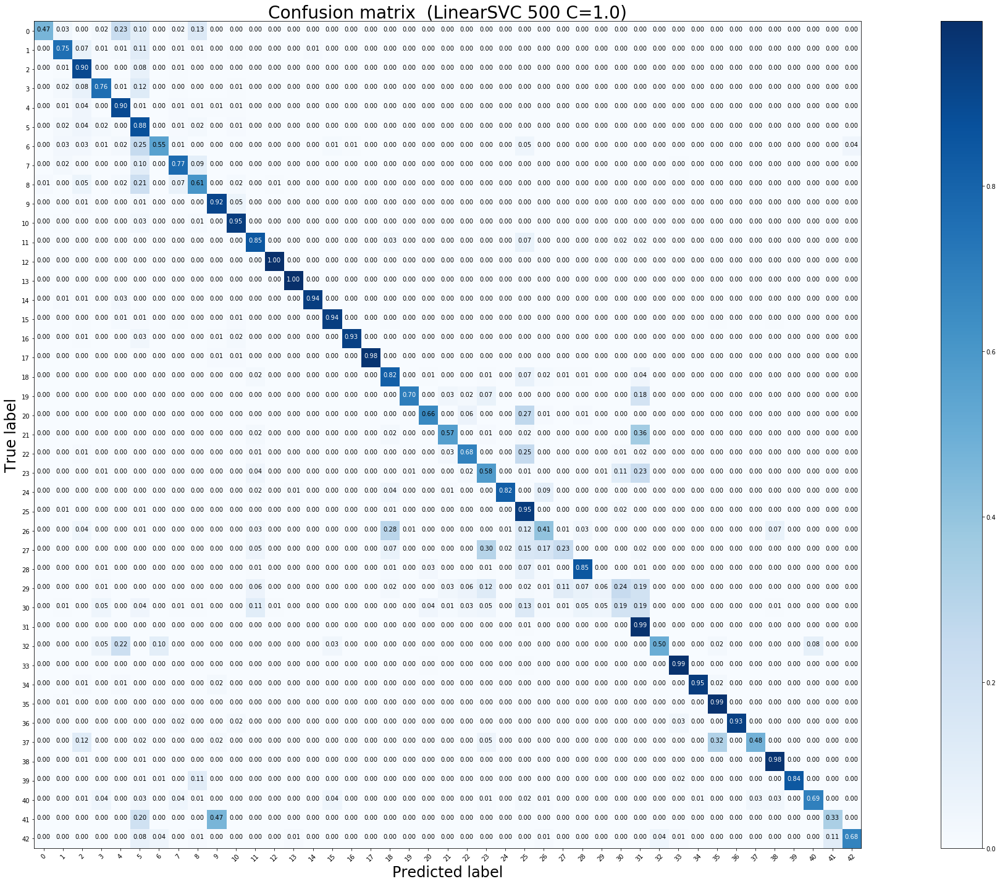

Test accuracy:  0.8445764053840064 

              precision    recall  f1-score   support

           0       0.85      0.47      0.60        60
           1       0.90      0.75      0.82       720
           2       0.77      0.90      0.83       750
           3       0.90      0.76      0.82       450
           4       0.90      0.90      0.90       660
           5       0.55      0.88      0.67       630
           6       0.88      0.55      0.68       150
           7       0.83      0.77      0.80       450
           8       0.74      0.61      0.67       450
           9       0.91      0.92      0.91       480
          10       0.91      0.95      0.93       660
          11       0.88      0.85      0.86       420
          12       0.99      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       0.98      0.94      0.96       270
          15       0.95      0.94      0.95       210
          16       0.99      0.93      0.96 

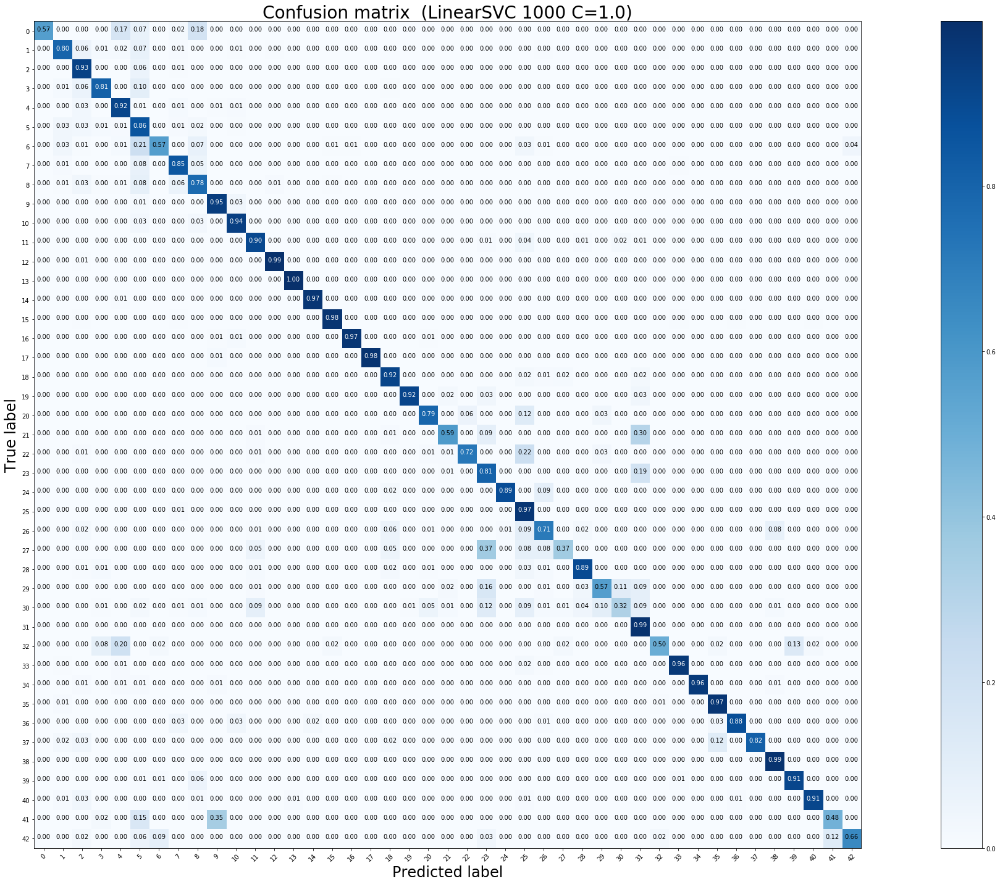

Test accuracy:  0.8877276326207443 

              precision    recall  f1-score   support

           0       0.97      0.57      0.72        60
           1       0.92      0.80      0.85       720
           2       0.82      0.93      0.87       750
           3       0.91      0.81      0.86       450
           4       0.92      0.92      0.92       660
           5       0.64      0.86      0.74       630
           6       0.88      0.57      0.69       150
           7       0.84      0.85      0.85       450
           8       0.79      0.78      0.78       450
           9       0.93      0.95      0.94       480
          10       0.94      0.94      0.94       660
          11       0.94      0.90      0.92       420
          12       0.98      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.98      0.97      0.98       270
          15       0.97      0.98      0.97       210
          16       0.97      0.97      0.97 

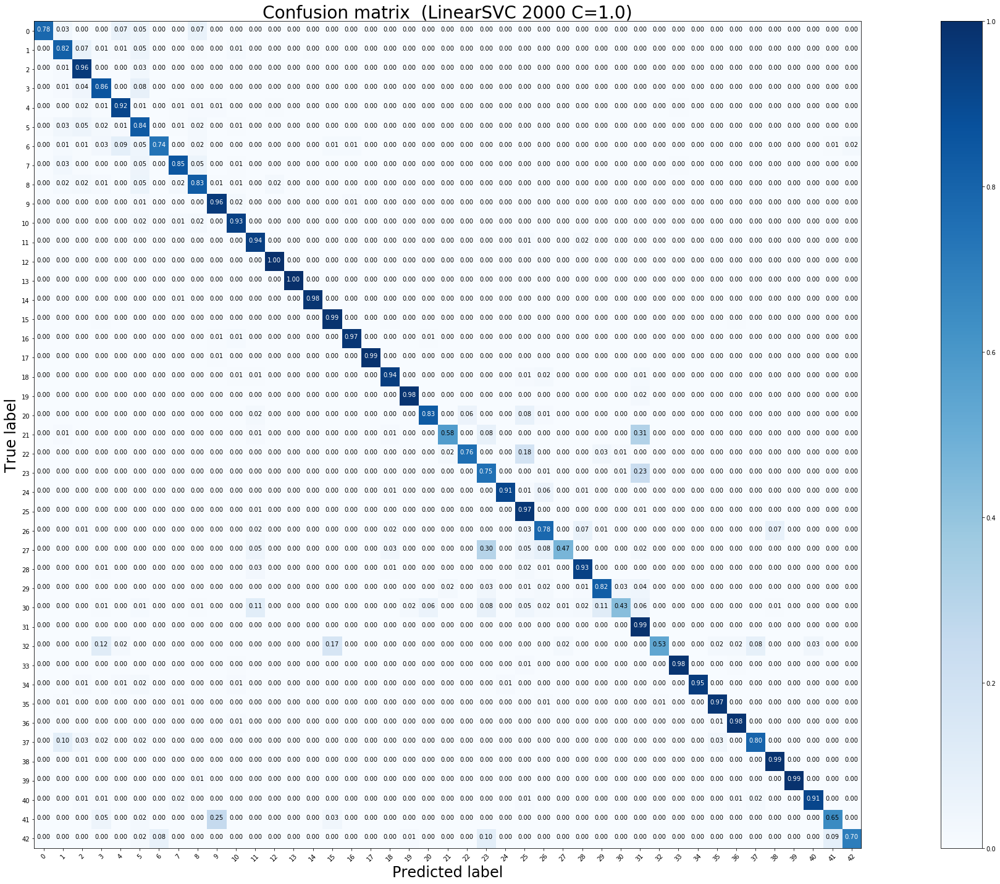

Test accuracy:  0.9076009501187648 

              precision    recall  f1-score   support

           0       0.90      0.78      0.84        60
           1       0.89      0.82      0.85       720
           2       0.84      0.96      0.90       750
           3       0.88      0.86      0.87       450
           4       0.94      0.92      0.93       660
           5       0.74      0.84      0.79       630
           6       0.93      0.74      0.82       150
           7       0.91      0.85      0.88       450
           8       0.85      0.83      0.84       450
           9       0.93      0.96      0.94       480
          10       0.93      0.93      0.93       660
          11       0.92      0.94      0.93       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.98      0.98       270
          15       0.92      0.99      0.95       210
          16       0.94      0.97      0.95 

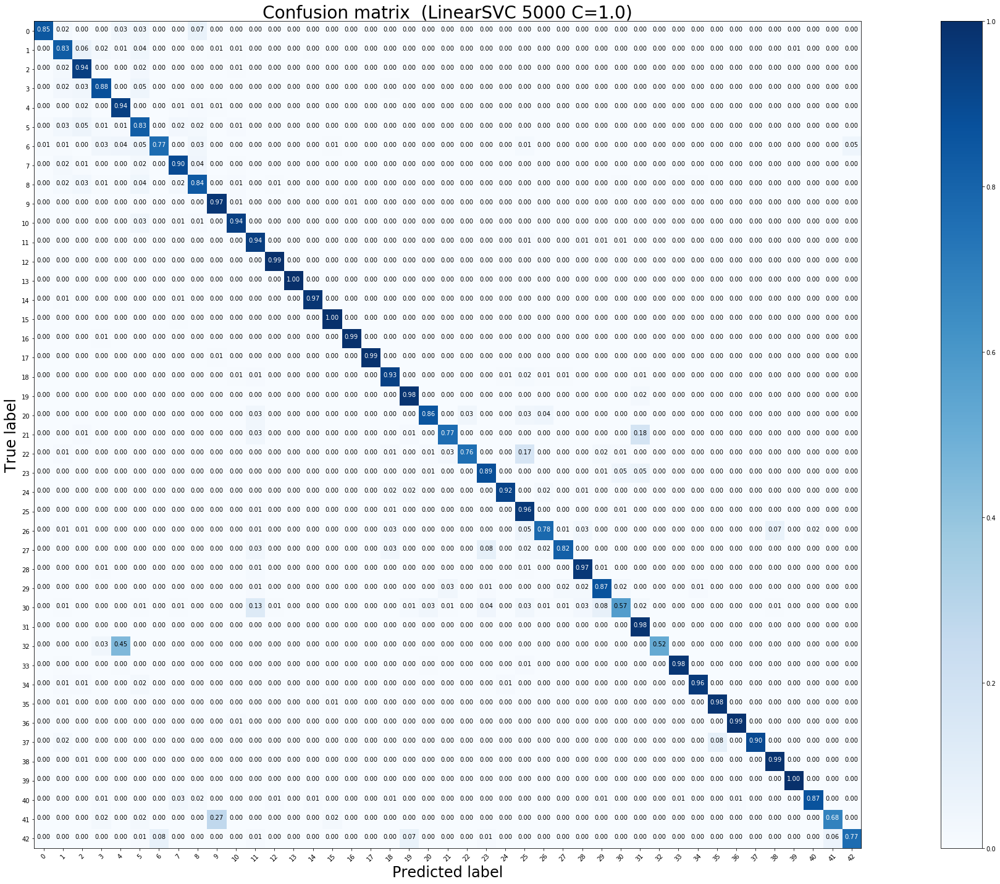

Test accuracy:  0.9199524940617577 

              precision    recall  f1-score   support

           0       0.89      0.85      0.87        60
           1       0.88      0.83      0.86       720
           2       0.84      0.94      0.89       750
           3       0.91      0.88      0.89       450
           4       0.92      0.94      0.93       660
           5       0.79      0.83      0.81       630
           6       0.93      0.77      0.84       150
           7       0.90      0.90      0.90       450
           8       0.87      0.84      0.86       450
           9       0.93      0.97      0.95       480
          10       0.95      0.94      0.94       660
          11       0.89      0.94      0.92       420
          12       0.99      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.97      0.98       270
          15       0.96      1.00      0.98       210
          16       0.96      0.99      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


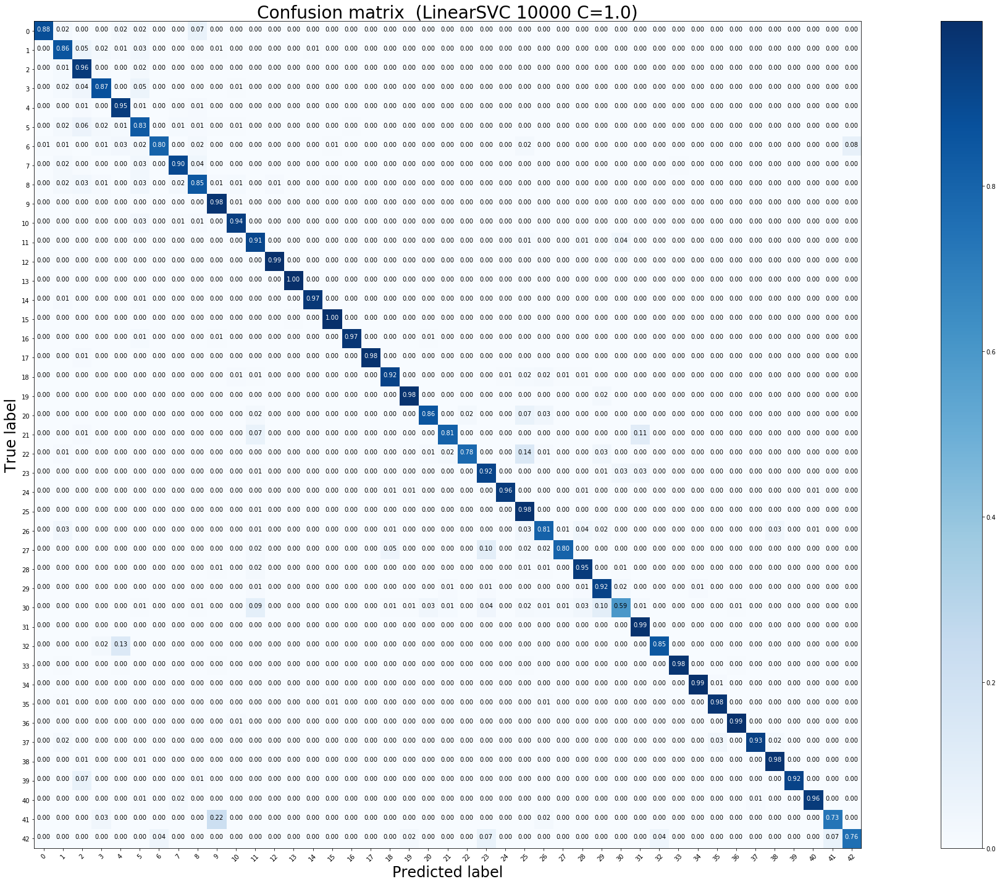

Test accuracy:  0.9270783847980998 

              precision    recall  f1-score   support

           0       0.91      0.88      0.90        60
           1       0.90      0.86      0.88       720
           2       0.84      0.96      0.89       750
           3       0.90      0.87      0.88       450
           4       0.95      0.95      0.95       660
           5       0.81      0.83      0.82       630
           6       0.96      0.80      0.87       150
           7       0.93      0.90      0.91       450
           8       0.89      0.85      0.87       450
           9       0.93      0.98      0.96       480
          10       0.96      0.94      0.95       660
          11       0.91      0.91      0.91       420
          12       0.99      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.97      0.97       270
          15       0.96      1.00      0.98       210
          16       0.98      0.97      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


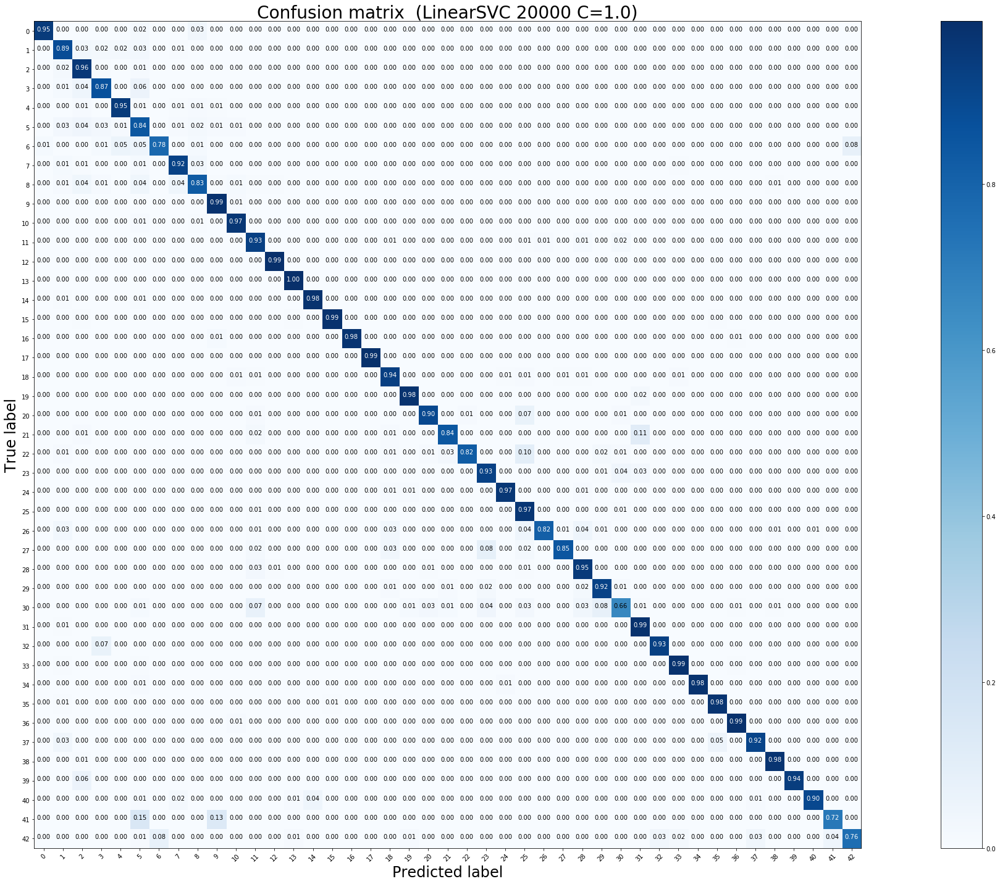

Test accuracy:  0.9348376880443389 

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        60
           1       0.91      0.89      0.90       720
           2       0.86      0.96      0.91       750
           3       0.89      0.87      0.88       450
           4       0.95      0.95      0.95       660
           5       0.82      0.84      0.83       630
           6       0.94      0.78      0.85       150
           7       0.91      0.92      0.92       450
           8       0.91      0.83      0.87       450
           9       0.95      0.99      0.97       480
          10       0.97      0.97      0.97       660
          11       0.93      0.93      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.96      0.98      0.97       270
          15       0.98      0.99      0.98       210
          16       0.99      0.98      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


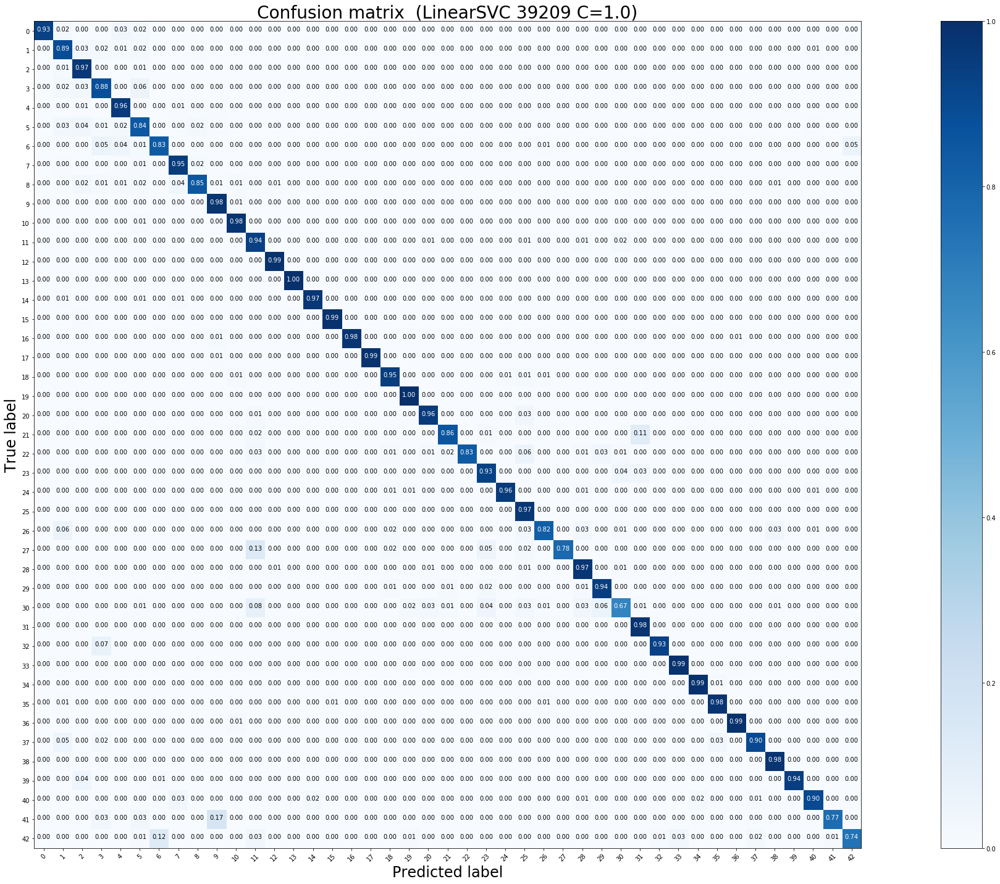

Test accuracy:  0.9398258115597783 

              precision    recall  f1-score   support

           0       0.97      0.93      0.95        60
           1       0.90      0.89      0.90       720
           2       0.90      0.97      0.93       750
           3       0.89      0.88      0.89       450
           4       0.94      0.96      0.95       660
           5       0.87      0.84      0.86       630
           6       0.91      0.83      0.87       150
           7       0.92      0.95      0.94       450
           8       0.93      0.85      0.89       450
           9       0.95      0.98      0.97       480
          10       0.97      0.98      0.97       660
          11       0.92      0.94      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.96      0.97      0.97       270
          15       0.97      0.99      0.98       210
          16       0.99      0.98      0.98 

In [4]:
##############################################################################
##############################################################################
##############################################################################
###########   LinearSVC, HOG, hinge, seed=1, random_A, without_scaler ########
###########   Defaultwerte   #################################################
##############################################################################

train_LinearSVC(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")

In [5]:
#########################################################################
#### GridSearch, LinearSVC, hinge  ######################################
#### 1. Durchlauf  ######################################################
#########################################################################
print('********************************************************************************')
print(' GridSearch 500 1. DL: ')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2), 'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 1. DL: ')
clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 2000 1. DL: ')
clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 5000 1. DL: ')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 10000 1. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2_hue, y_test, 'LinearSVC', 5, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 1. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 1. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2_hue, y_train, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 500 1. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 Bester Score:  0.784938574159119

 Besten Parameter:  {'svm__C': 0.25}
Bester Estimator score:  0.8444180522565321
Precision-Score: 0.179319 (0.066756) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.372365 (0.130101) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.535574 (0.073493) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.667903 (0.092449) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.717727 (0.065412) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.766707 (0.065853) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.782998 (0.104505) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.783312 (0.121532) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.782502 (0.120956) mit Parameter:

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 Bester Score:  0.8970408067752464

 Besten Parameter:  {'svm__C': 0.0625}
Bester Estimator score:  0.8934283452098178
Precision-Score: 0.133828 (0.014286) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.444711 (0.070069) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.690029 (0.045922) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.780442 (0.047696) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.822216 (0.058364) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.869839 (0.053944) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.897739 (0.044508) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.895079 (0.044829) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.891569 (0.041255) mit Paramet


 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 Bester Score:  0.9617868840049254

 Besten Parameter:  {'svm__C': 0.25}
Bester Estimator score:  0.9245447347585115
Precision-Score: 0.674915 (0.040277) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.859802 (0.021129) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.894164 (0.015211) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.901789 (0.013570) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.923585 (0.013148) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.942908 (0.014466) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.959476 (0.014416) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.966941 (0.011019) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.965831 (0.009377) mit Parameter


 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01]

 Bester Score:  0.9748258901573962

 Besten Parameter:  {'svm__C': 0.25}
Bester Estimator score:  0.9389548693586698
Precision-Score: 0.888462 (0.004806) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.900146 (0.005204) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.907620 (0.004174) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.916890 (0.001330) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.939266 (0.001956) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.958084 (0.000605) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.969072 (0.002077) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.975147 (0.000650) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.975064 (0.000750) mit Parameter: {'svm__C': 1.0}
Precision-Sco

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\joblib\externals\loky\process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


MemoryError: 

In [6]:
# Fortsetzung, da Abbruch wegen MemoryError
print('********************************************************************************')
print(' GridSearch 39209 1. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2_hue, y_train, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 39209 1. DL: 


 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01]

 Bester Score:  0.9413444240167372

 Besten Parameter:  {'svm__C': 0.0625}
Bester Estimator score:  0.9469517022961204
Precision-Score: 0.866493 (0.005026) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.873836 (0.001085) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.882693 (0.004711) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.899787 (0.006540) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.924714 (0.006482) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.938364 (0.003223) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.942554 (0.003412) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.942383 (0.004668) mit

In [7]:
#########################################################################
#### GridSearch, LinearSVC, hinge  ######################################
#### 2. Durchlauf  ######################################################
#########################################################################
print('********************************************************************************')
print(' GridSearch 500 2. DL: ')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.25), np.logspace(-16,4,11, base=2), 'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 2. DL: ')
clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.0625), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 2000 2. DL: ')
clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.0625), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 5000 2. DL: ')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.25), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 10000 2. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2_hue, y_test, 'LinearSVC', 5, 0, 0, 
                                                get_finer_range(0.25), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 2. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(0.25), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 2. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2_hue, y_train, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(0.0625), np.logspace(-16,4,11, base=2),'l2', 'hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 500 2. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [0.0625     0.07432544 0.08838835 0.10511205 0.125      0.14865089
 0.1767767  0.2102241  0.25       0.29730178 0.35355339 0.42044821
 0.5        0.59460356 0.70710678 0.84089642 1.        ]

 Bester Score:  0.784938574159119

 Besten Parameter:  {'svm__C': 0.21022410381342863}
Bester Estimator score:  0.8441805225653206
Precision-Score: 0.782998 (0.104505) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.774844 (0.105949) mit Parameter: {'svm__C': 0.07432544468767006}
Precision-Score: 0.771934 (0.115245) mit Parameter: {'svm__C': 0.08838834764831845}
Precision-Score: 0.769772 (0.119243) mit Parameter: {'svm__C': 0.10511205190671431}
Precision-Score: 0.775544 (0.120847) mit Parameter: {'svm__C': 0.125}
Precision-Score: 0.775970 (0.118595) mit Parameter: {'svm__C': 0.14865088937534013}
Precision-Score: 0.779828 (0.120373) mit Parameter: {'svm__C': 0.1767766952966369}
Precision-Score: 0.783312 (0.121532) mit Parameter: {'svm__C': 0.21022410381342863}
Precision-Score: 0.783

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [0.015625   0.01858136 0.02209709 0.02627801 0.03125    0.03716272
 0.04419417 0.05255603 0.0625     0.07432544 0.08838835 0.10511205
 0.125      0.14865089 0.1767767  0.2102241  0.25      ]

 Bester Score:  0.8970408067752464

 Besten Parameter:  {'svm__C': 0.0625}
Bester Estimator score:  0.8934283452098178
Precision-Score: 0.869839 (0.053944) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.877735 (0.046401) mit Parameter: {'svm__C': 0.018581361171917516}
Precision-Score: 0.887413 (0.046696) mit Parameter: {'svm__C': 0.02209708691207961}
Precision-Score: 0.889610 (0.050277) mit Parameter: {'svm__C': 0.026278012976678578}
Precision-Score: 0.891090 (0.051799) mit Parameter: {'svm__C': 0.03125}
Precision-Score: 0.895116 (0.046633) mit Parameter: {'svm__C': 0.03716272234383503}
Precision-Score: 0.896745 (0.045802) mit Parameter: {'svm__C': 0.04419417382415922}
Precision-Score: 0.896505 (0.043873) mit Parameter: {'svm__C': 0.052556025953357156}
Precision-Score: 0.897739 


 C_range: [0.0625     0.07432544 0.08838835 0.10511205 0.125      0.14865089
 0.1767767  0.2102241  0.25       0.29730178 0.35355339 0.42044821
 0.5        0.59460356 0.70710678 0.84089642 1.        ]

 Bester Score:  0.9623356905577304

 Besten Parameter:  {'svm__C': 0.29730177875068026}
Bester Estimator score:  0.9237529691211401
Precision-Score: 0.959476 (0.014416) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.962346 (0.014404) mit Parameter: {'svm__C': 0.07432544468767006}
Precision-Score: 0.964221 (0.013740) mit Parameter: {'svm__C': 0.08838834764831845}
Precision-Score: 0.963917 (0.013378) mit Parameter: {'svm__C': 0.10511205190671431}
Precision-Score: 0.964801 (0.013154) mit Parameter: {'svm__C': 0.125}
Precision-Score: 0.965952 (0.010621) mit Parameter: {'svm__C': 0.14865088937534013}
Precision-Score: 0.966693 (0.011063) mit Parameter: {'svm__C': 0.1767766952966369}
Precision-Score: 0.965891 (0.010730) mit Parameter: {'svm__C': 0.21022410381342863}
Precision-Score: 0.96

********************************************************************************
 GridSearch 20000 2. DL: 


 C_range: [0.0625     0.07432544 0.08838835 0.10511205 0.125      0.14865089
 0.1767767  0.2102241  0.25       0.29730178 0.35355339 0.42044821
 0.5        0.59460356 0.70710678 0.84089642 1.        ]

 Bester Score:  0.9748258901573962

 Besten Parameter:  {'svm__C': 0.25}
Bester Estimator score:  0.9389548693586698
Precision-Score: 0.969072 (0.002077) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.969818 (0.001835) mit Parameter: {'svm__C': 0.07432544468767006}
Precision-Score: 0.970159 (0.000945) mit Parameter: {'svm__C': 0.08838834764831845}
Precision-Score: 0.971247 (0.000472) mit Parameter: {'svm__C': 0.10511205190671431}
Precision-Score: 0.972279 (0.000138) mit Parameter: {'svm__C': 0.125}
Precision-Score: 0.972856 (0.000576) mit Parameter: {'svm__C': 0.14865088937534013}
Precision-Score: 0.972829 (0.000567) mit Parameter: {'svm__C': 0.1767766952966369}
Precision-Sc

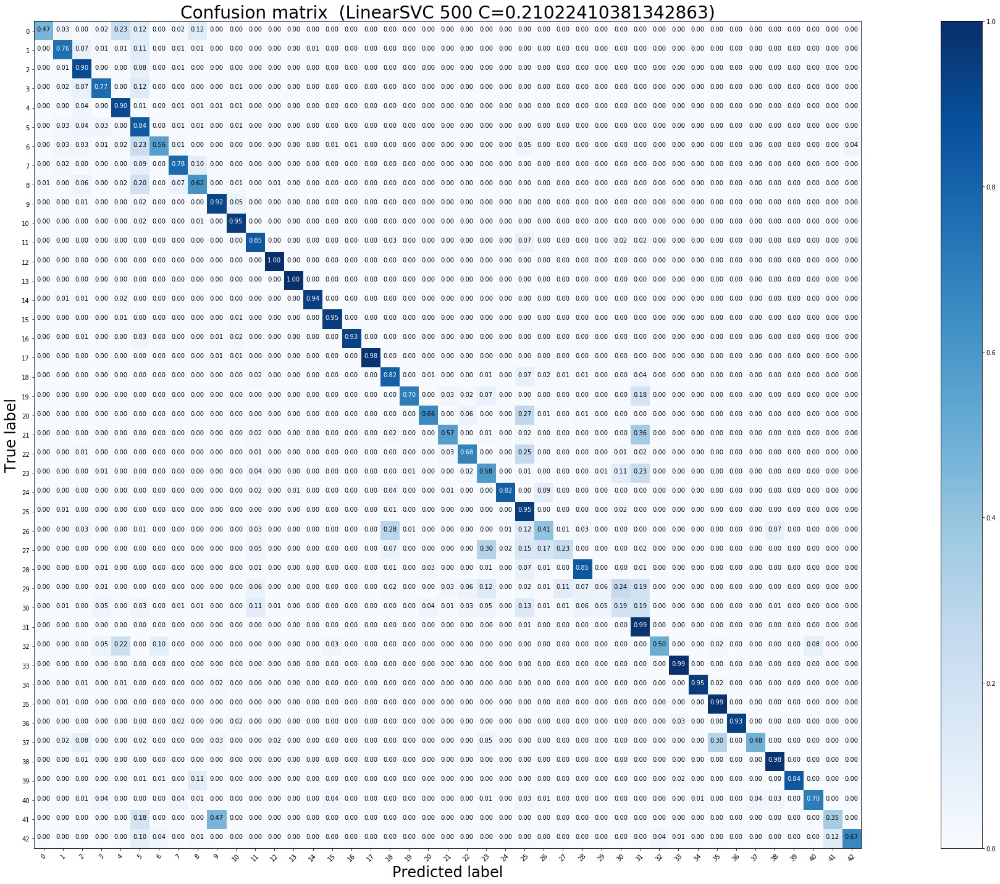

Test accuracy:  0.8441805225653206 

              precision    recall  f1-score   support

           0       0.85      0.47      0.60        60
           1       0.89      0.76      0.82       720
           2       0.77      0.90      0.83       750
           3       0.87      0.77      0.82       450
           4       0.90      0.90      0.90       660
           5       0.55      0.84      0.66       630
           6       0.88      0.56      0.69       150
           7       0.83      0.78      0.80       450
           8       0.75      0.62      0.68       450
           9       0.90      0.92      0.91       480
          10       0.91      0.95      0.93       660
          11       0.87      0.85      0.86       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.94      0.96       270
          15       0.95      0.95      0.95       210
          16       0.99      0.93      0.96 

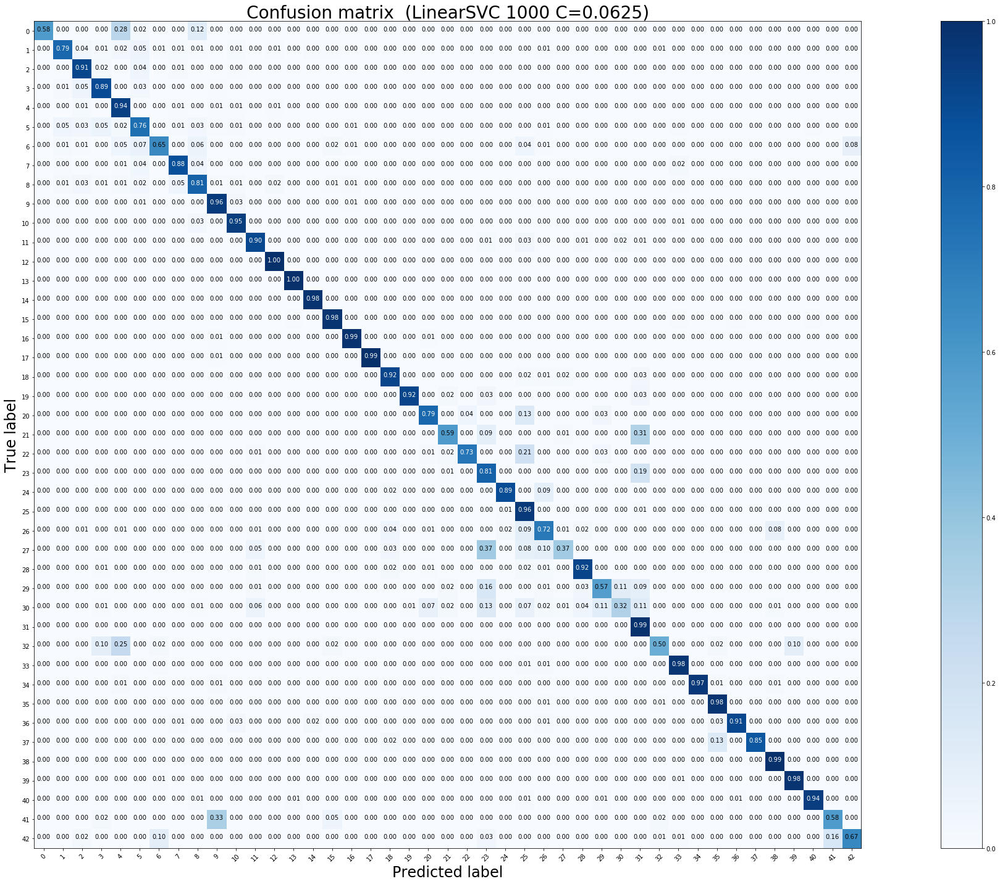

Test accuracy:  0.8934283452098178 

              precision    recall  f1-score   support

           0       0.95      0.58      0.72        60
           1       0.92      0.79      0.85       720
           2       0.87      0.91      0.89       750
           3       0.85      0.89      0.87       450
           4       0.89      0.94      0.91       660
           5       0.79      0.76      0.77       630
           6       0.84      0.65      0.74       150
           7       0.88      0.88      0.88       450
           8       0.81      0.81      0.81       450
           9       0.92      0.96      0.94       480
          10       0.93      0.95      0.94       660
          11       0.95      0.90      0.93       420
          12       0.97      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       0.97      0.98      0.98       270
          15       0.93      0.98      0.96       210
          16       0.91      0.99      0.95 

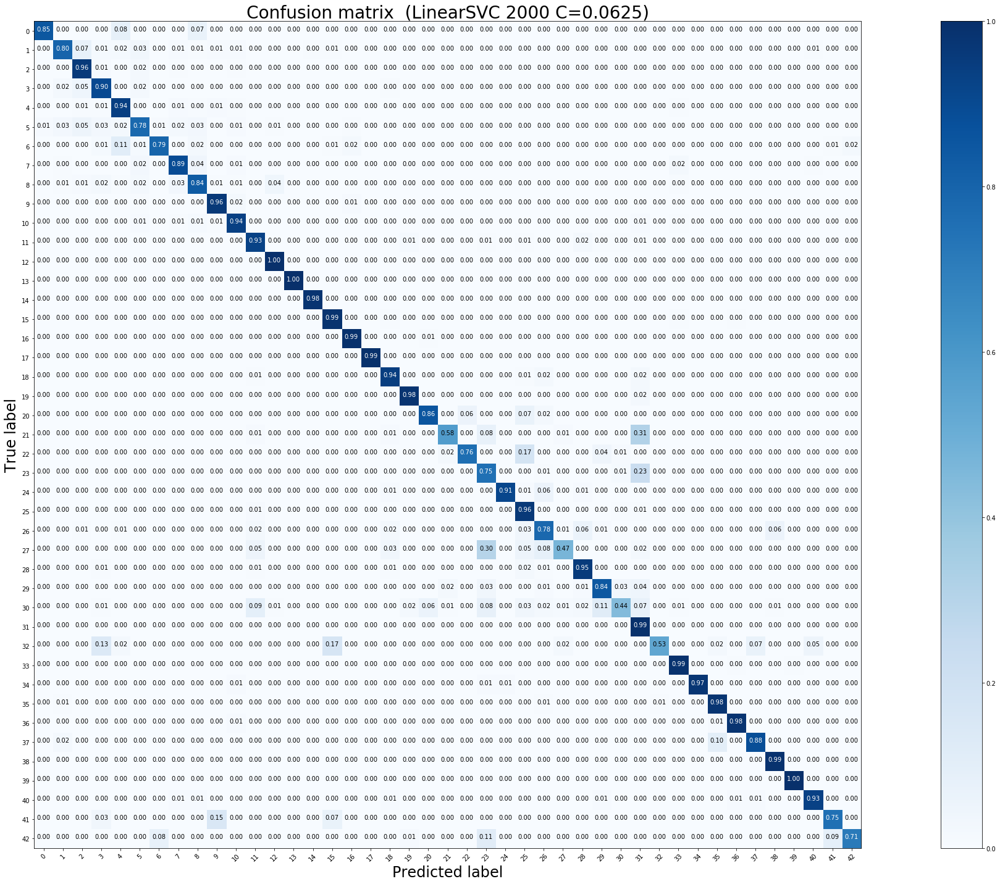

Test accuracy:  0.91187648456057 

              precision    recall  f1-score   support

           0       0.85      0.85      0.85        60
           1       0.94      0.80      0.86       720
           2       0.86      0.96      0.91       750
           3       0.87      0.90      0.89       450
           4       0.93      0.94      0.93       660
           5       0.86      0.78      0.82       630
           6       0.90      0.79      0.84       150
           7       0.89      0.89      0.89       450
           8       0.87      0.84      0.85       450
           9       0.93      0.96      0.95       480
          10       0.94      0.94      0.94       660
          11       0.92      0.93      0.93       420
          12       0.95      1.00      0.98       690
          13       1.00      1.00      1.00       720
          14       0.97      0.98      0.98       270
          15       0.90      0.99      0.94       210
          16       0.91      0.99      0.95   

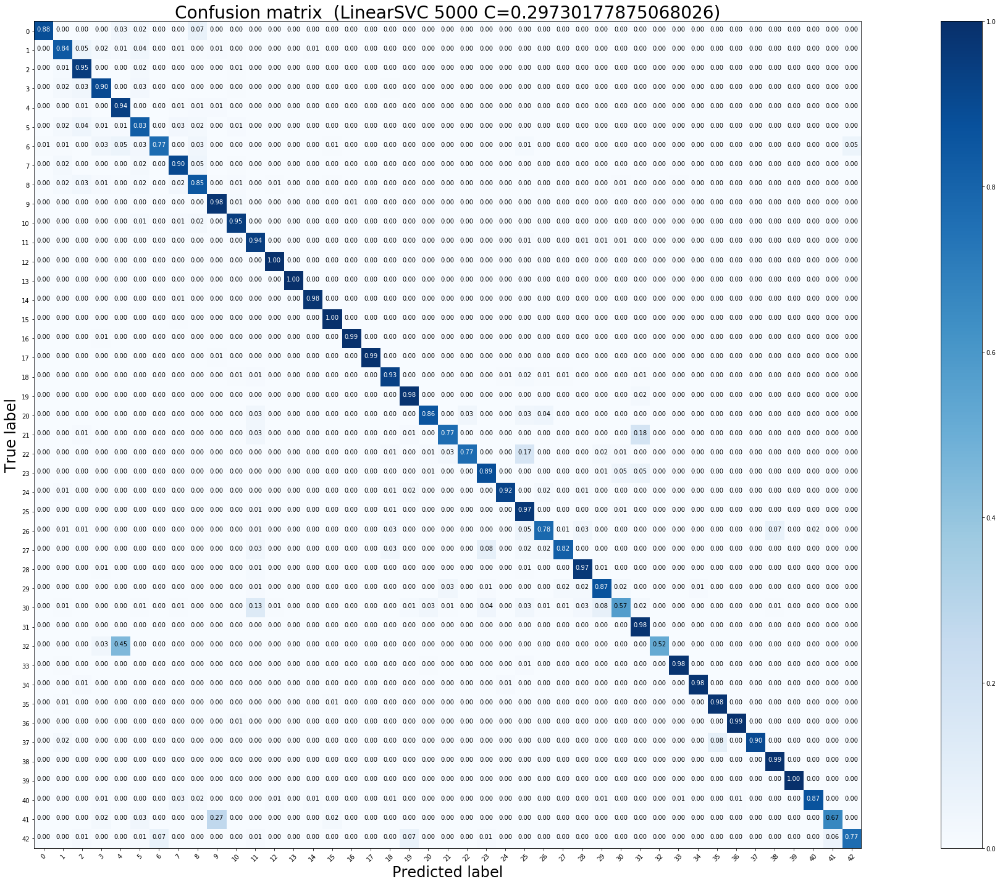

Test accuracy:  0.9237529691211401 

              precision    recall  f1-score   support

           0       0.91      0.88      0.90        60
           1       0.90      0.84      0.87       720
           2       0.86      0.95      0.90       750
           3       0.91      0.90      0.90       450
           4       0.92      0.94      0.93       660
           5       0.85      0.83      0.84       630
           6       0.93      0.77      0.84       150
           7       0.89      0.90      0.90       450
           8       0.85      0.85      0.85       450
           9       0.92      0.98      0.95       480
          10       0.95      0.95      0.95       660
          11       0.89      0.94      0.92       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      0.98      0.98       270
          15       0.96      1.00      0.98       210
          16       0.96      0.99      0.98 

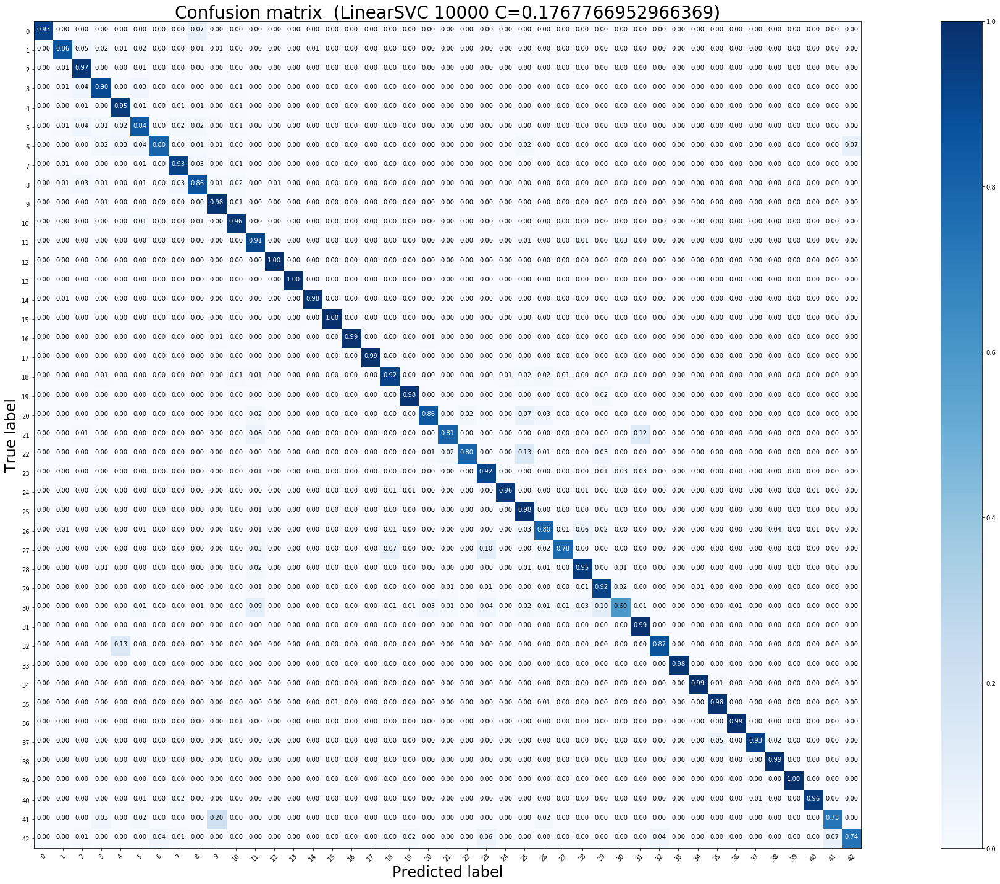

Test accuracy:  0.9345209817893904 

              precision    recall  f1-score   support

           0       0.97      0.93      0.95        60
           1       0.94      0.86      0.90       720
           2       0.88      0.97      0.92       750
           3       0.91      0.90      0.90       450
           4       0.94      0.95      0.95       660
           5       0.88      0.84      0.86       630
           6       0.95      0.80      0.87       150
           7       0.91      0.93      0.92       450
           8       0.89      0.86      0.87       450
           9       0.93      0.98      0.95       480
          10       0.95      0.96      0.95       660
          11       0.91      0.91      0.91       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.96      0.98      0.97       270
          15       0.97      1.00      0.98       210
          16       0.97      0.99      0.98 

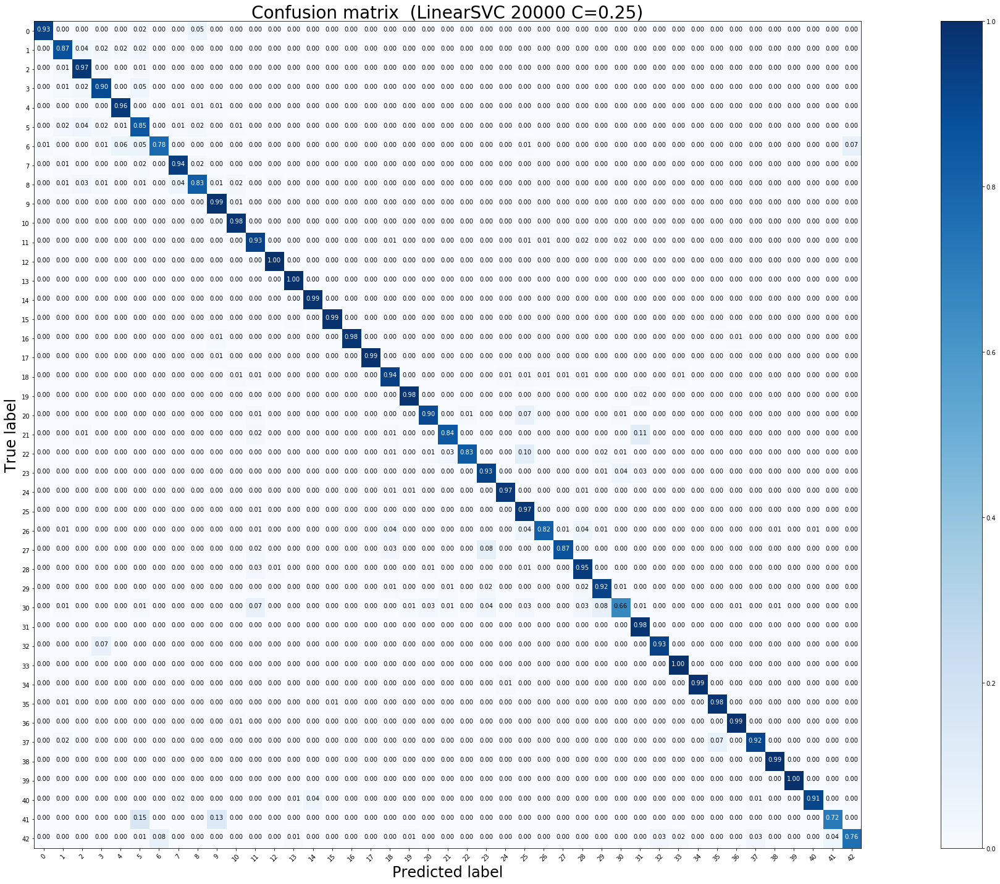

Test accuracy:  0.9389548693586698 

              precision    recall  f1-score   support

           0       0.92      0.93      0.93        60
           1       0.93      0.87      0.90       720
           2       0.89      0.97      0.93       750
           3       0.90      0.90      0.90       450
           4       0.95      0.96      0.95       660
           5       0.86      0.85      0.86       630
           6       0.94      0.78      0.85       150
           7       0.91      0.94      0.93       450
           8       0.92      0.83      0.87       450
           9       0.95      0.99      0.97       480
          10       0.96      0.98      0.97       660
          11       0.94      0.93      0.93       420
          12       0.99      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       0.96      0.99      0.97       270
          15       0.97      0.99      0.98       210
          16       0.99      0.98      0.99 

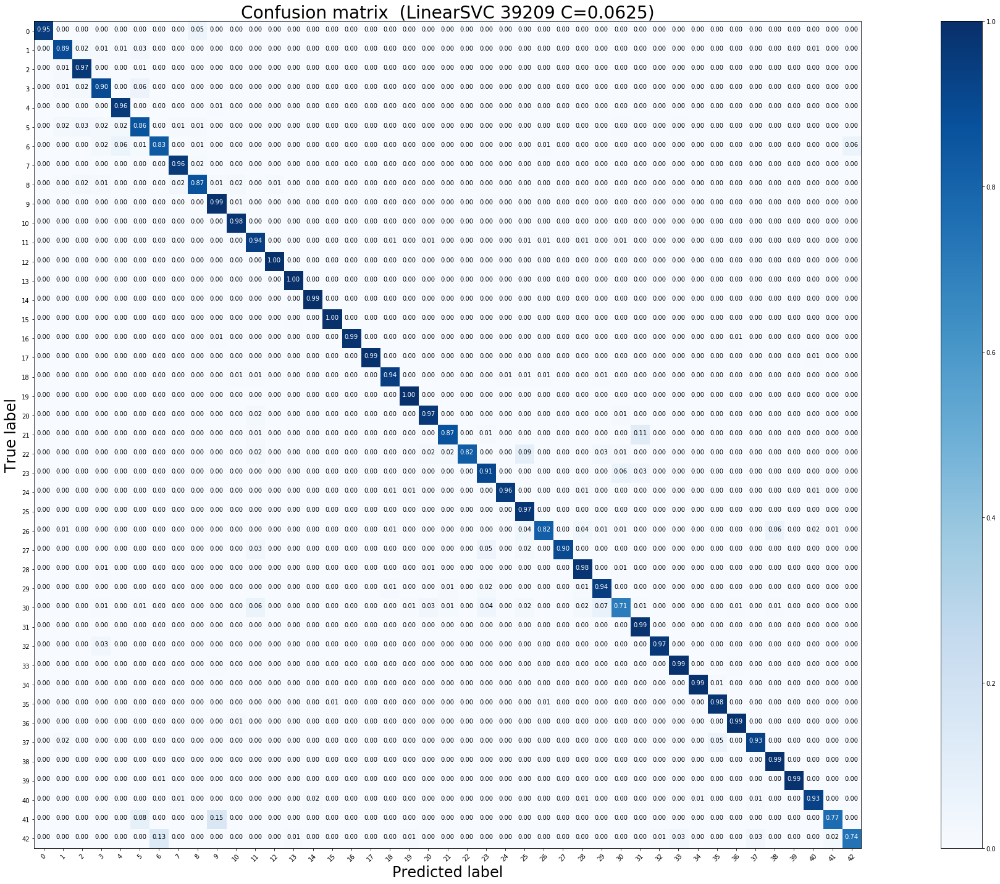

Test accuracy:  0.9469517022961204 

              precision    recall  f1-score   support

           0       0.95      0.95      0.95        60
           1       0.96      0.89      0.92       720
           2       0.93      0.97      0.95       750
           3       0.91      0.90      0.90       450
           4       0.95      0.96      0.96       660
           5       0.89      0.86      0.88       630
           6       0.89      0.83      0.86       150
           7       0.94      0.96      0.95       450
           8       0.94      0.87      0.90       450
           9       0.94      0.99      0.97       480
          10       0.97      0.98      0.97       660
          11       0.95      0.94      0.94       420
          12       0.98      1.00      0.99       690
          13       0.99      1.00      0.99       720
          14       0.95      0.99      0.97       270
          15       0.97      1.00      0.98       210
          16       0.99      0.99      0.99 

In [8]:
##############################################################################
###########   LinearSVC, HOG, hinge 
###########   opt. Hyperparameter   #################################################
##############################################################################

train_LinearSVC(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',0.21022410381342863, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',0.0625, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',0.0625, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',0.29730177875068026, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',0.1767766952966369, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',0.25, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209',0.0625, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")

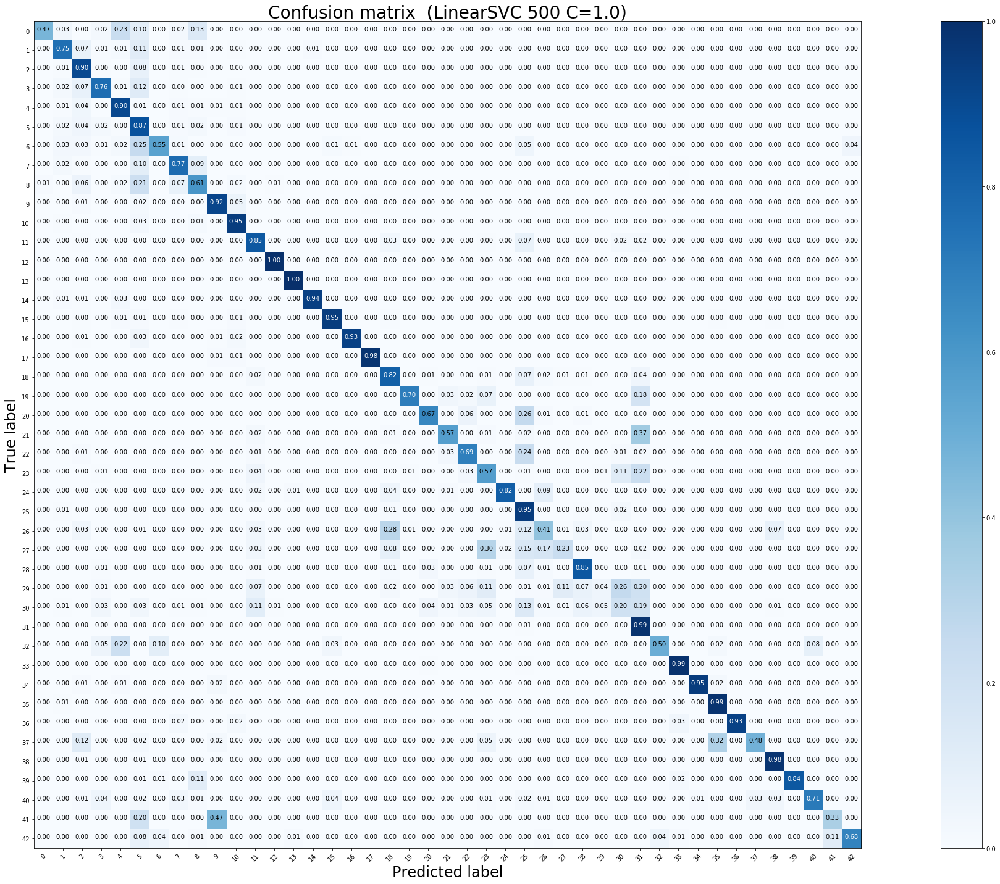

Test accuracy:  0.8456848772763262 

              precision    recall  f1-score   support

           0       0.85      0.47      0.60        60
           1       0.90      0.75      0.82       720
           2       0.78      0.90      0.83       750
           3       0.91      0.76      0.83       450
           4       0.90      0.90      0.90       660
           5       0.55      0.87      0.68       630
           6       0.88      0.55      0.68       150
           7       0.83      0.77      0.80       450
           8       0.74      0.61      0.67       450
           9       0.91      0.92      0.91       480
          10       0.91      0.95      0.93       660
          11       0.87      0.85      0.86       420
          12       0.99      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       0.98      0.94      0.96       270
          15       0.95      0.95      0.95       210
          16       0.99      0.93      0.96 

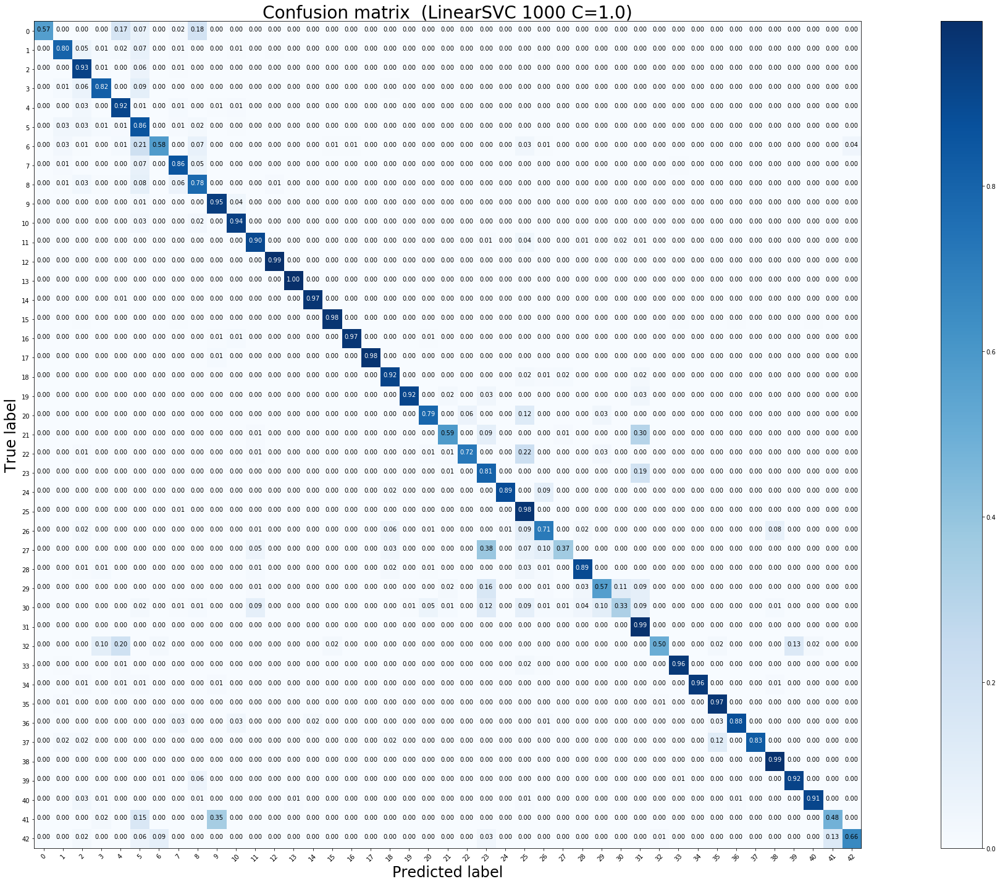

Test accuracy:  0.8893111638954869 

              precision    recall  f1-score   support

           0       0.97      0.57      0.72        60
           1       0.92      0.80      0.86       720
           2       0.83      0.93      0.87       750
           3       0.91      0.82      0.86       450
           4       0.92      0.92      0.92       660
           5       0.65      0.86      0.74       630
           6       0.88      0.58      0.70       150
           7       0.85      0.86      0.85       450
           8       0.80      0.78      0.79       450
           9       0.93      0.95      0.94       480
          10       0.94      0.94      0.94       660
          11       0.94      0.90      0.92       420
          12       0.98      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.98      0.97      0.98       270
          15       0.98      0.98      0.98       210
          16       0.97      0.97      0.97 

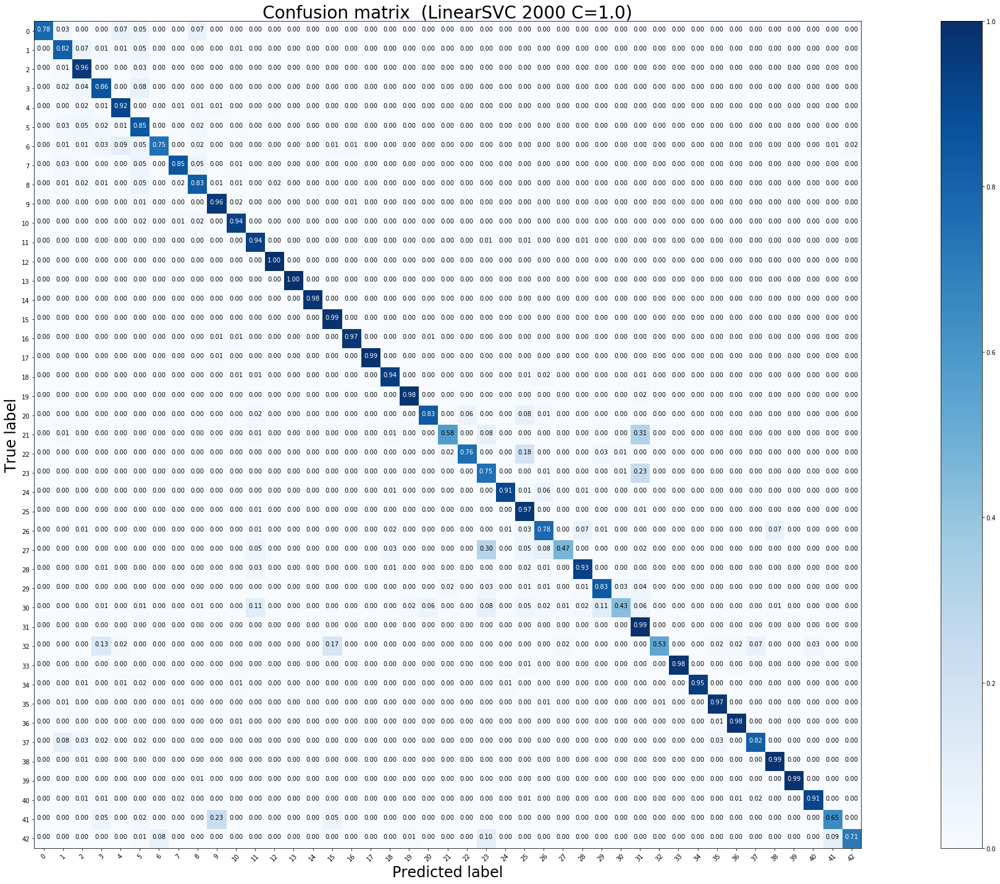

Test accuracy:  0.9091053048297704 

              precision    recall  f1-score   support

           0       0.92      0.78      0.85        60
           1       0.90      0.82      0.86       720
           2       0.84      0.96      0.90       750
           3       0.88      0.86      0.87       450
           4       0.95      0.92      0.93       660
           5       0.75      0.85      0.80       630
           6       0.93      0.75      0.83       150
           7       0.92      0.85      0.88       450
           8       0.85      0.83      0.84       450
           9       0.93      0.96      0.95       480
          10       0.94      0.94      0.94       660
          11       0.92      0.94      0.93       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.98      0.98       270
          15       0.91      0.99      0.95       210
          16       0.94      0.97      0.95 

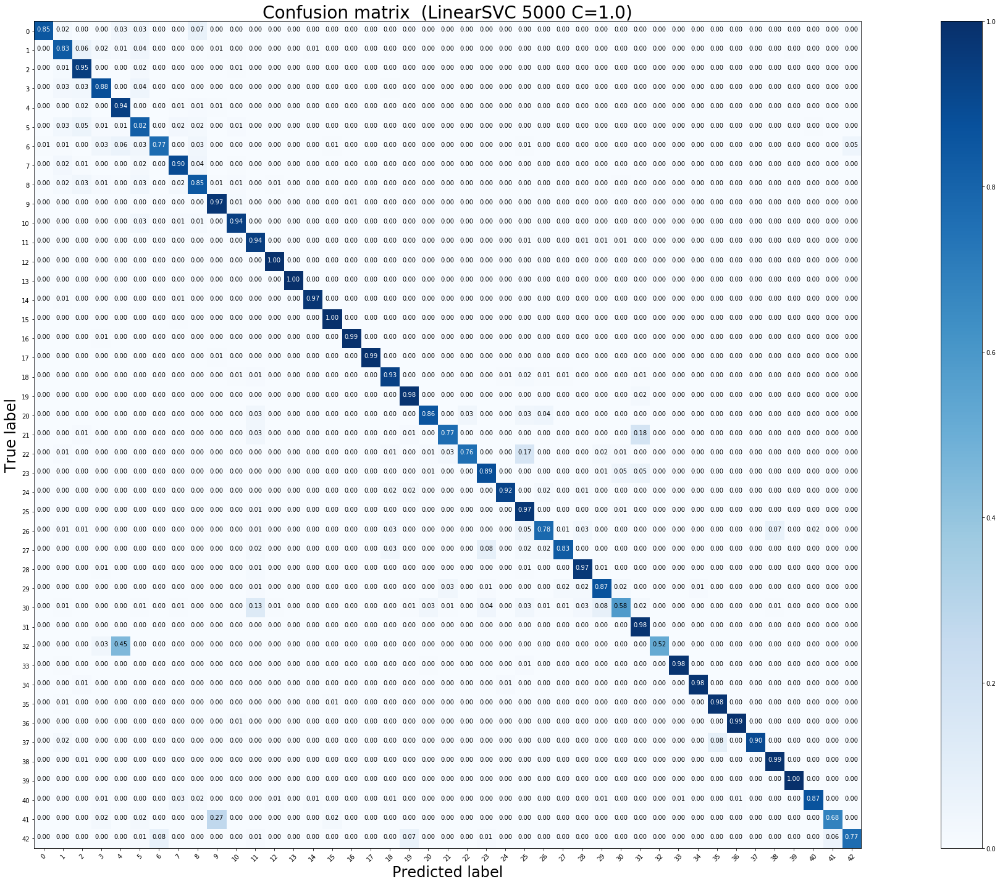

Test accuracy:  0.9215360253365004 

              precision    recall  f1-score   support

           0       0.91      0.85      0.88        60
           1       0.89      0.83      0.86       720
           2       0.84      0.95      0.89       750
           3       0.91      0.88      0.89       450
           4       0.92      0.94      0.93       660
           5       0.81      0.82      0.82       630
           6       0.93      0.77      0.84       150
           7       0.90      0.90      0.90       450
           8       0.87      0.85      0.86       450
           9       0.93      0.97      0.95       480
          10       0.95      0.94      0.94       660
          11       0.89      0.94      0.92       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      0.97      0.97       270
          15       0.96      1.00      0.98       210
          16       0.96      0.99      0.98 

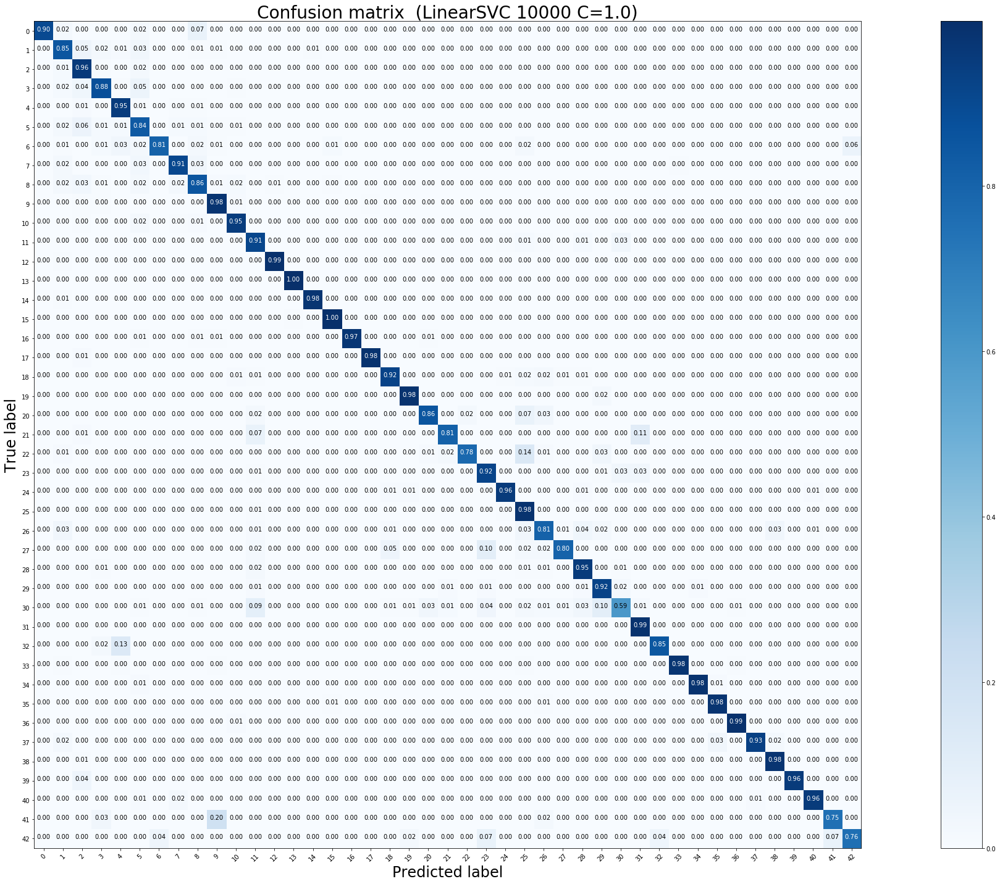

Test accuracy:  0.9292953285827396 

              precision    recall  f1-score   support

           0       0.92      0.90      0.91        60
           1       0.90      0.85      0.88       720
           2       0.85      0.96      0.90       750
           3       0.90      0.88      0.89       450
           4       0.94      0.95      0.95       660
           5       0.82      0.84      0.83       630
           6       0.97      0.81      0.88       150
           7       0.93      0.91      0.92       450
           8       0.89      0.86      0.87       450
           9       0.93      0.98      0.95       480
          10       0.96      0.95      0.95       660
          11       0.91      0.91      0.91       420
          12       0.99      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.98      0.98       270
          15       0.96      1.00      0.98       210
          16       0.99      0.97      0.98 

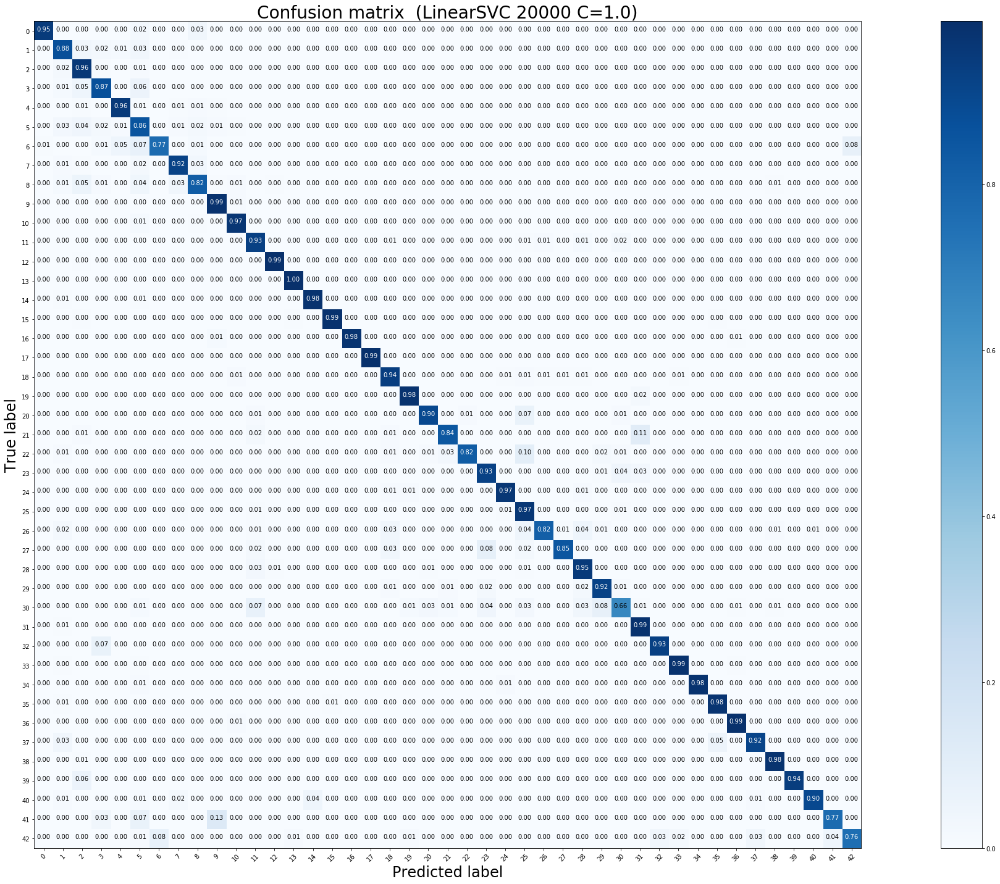

Test accuracy:  0.9352335708630245 

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        60
           1       0.91      0.88      0.89       720
           2       0.86      0.96      0.91       750
           3       0.89      0.87      0.88       450
           4       0.96      0.96      0.96       660
           5       0.82      0.86      0.84       630
           6       0.94      0.77      0.85       150
           7       0.92      0.92      0.92       450
           8       0.90      0.82      0.86       450
           9       0.95      0.99      0.97       480
          10       0.97      0.97      0.97       660
          11       0.94      0.93      0.93       420
          12       0.99      0.99      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      0.98      0.98       270
          15       0.97      0.99      0.98       210
          16       0.99      0.98      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


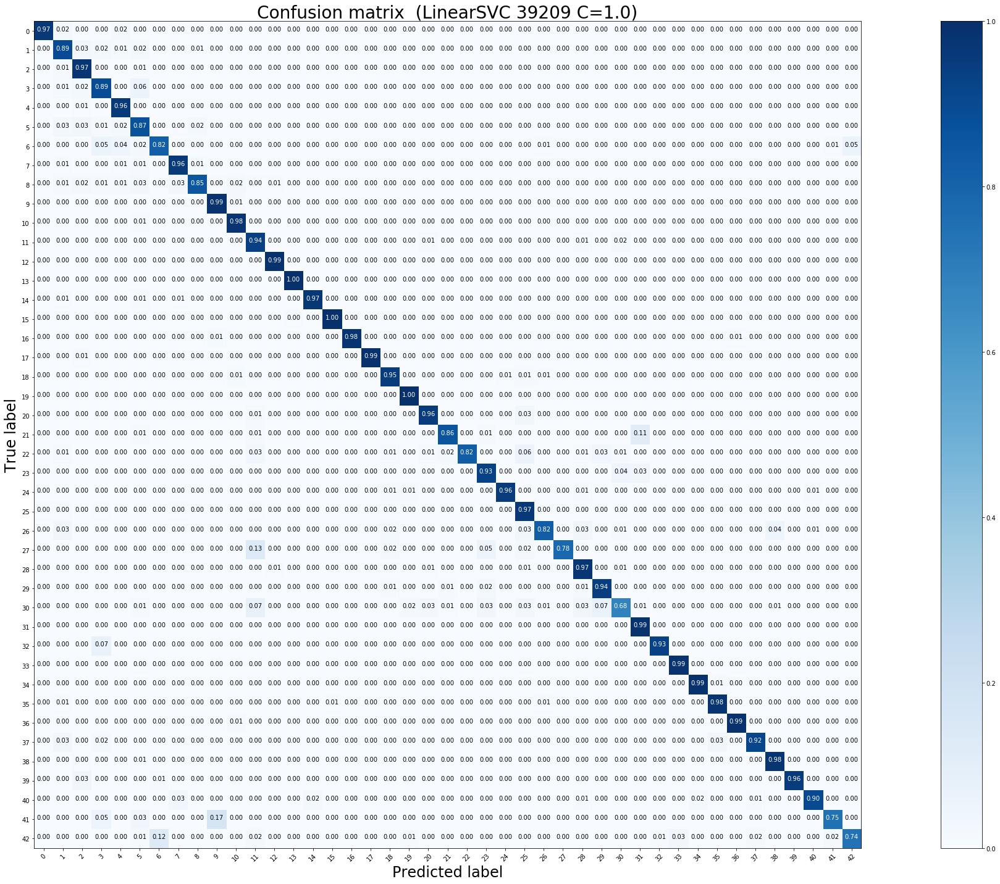

Test accuracy:  0.9426761678543151 

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        60
           1       0.91      0.89      0.90       720
           2       0.90      0.97      0.94       750
           3       0.90      0.89      0.89       450
           4       0.95      0.96      0.95       660
           5       0.86      0.87      0.86       630
           6       0.91      0.82      0.86       150
           7       0.93      0.96      0.95       450
           8       0.93      0.85      0.89       450
           9       0.95      0.99      0.97       480
          10       0.97      0.98      0.97       660
          11       0.93      0.94      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.96      0.97      0.97       270
          15       0.98      1.00      0.99       210
          16       0.99      0.98      0.98 

In [5]:
###############################################################################
###############################################################################
########################################################################################
###########   LinearSVC, squared_hinge, HOG, seed=1, random_A, without_scaler ##########
###########   Defaultwerte   ###########################################################
########################################################################################

train_LinearSVC_sq(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")

In [9]:
#########################################################################
#### GridSearch, LinearSVC, squared-hinge  ##############################
#### 1. Durchlauf  ######################################################
#########################################################################
print('********************************************************************************')
print(' GridSearch 500 1. DL: ')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2), 'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 1. DL: ')
clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 2000 1. DL: ')
clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')
print('********************************************************************************')
print(' GridSearch 5000 1. DL: ')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 10000 1. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2_hue, y_test, 'LinearSVC', 5, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 1. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 1. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2_hue, y_train, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,6,12, base=2), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_1DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 500 1. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.7932823587915793

 Besten Parameter:  {'svm__C': 0.015625}
Bester Estimator score:  0.8423594615993666
Precision-Score: 0.299802 (0.117349) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.505952 (0.102402) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.670317 (0.065054) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.727839 (0.078876) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.784671 (0.075515) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.794521 (0.096846) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.791981 (0.115262) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.787757 (0.122069) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.783873 (0.119482) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.782502 (0.120956) mit Parameter

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.9007979624640882

 Besten Parameter:  {'svm__C': 0.0625}
Bester Estimator score:  0.8950910530482977
Precision-Score: 0.341304 (0.069611) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.656178 (0.031950) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.796575 (0.048639) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.854650 (0.047603) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.886955 (0.035318) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.901117 (0.036408) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.899555 (0.043850) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.898715 (0.043165) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.894398 (0.045475) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.894398 (0.045475) mit Parameter: 


 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 Bester Score:  0.9656026878628656

 Besten Parameter:  {'svm__C': 0.015625}
Bester Estimator score:  0.9292953285827396
Precision-Score: 0.830948 (0.041535) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.888532 (0.017154) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.909325 (0.010109) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.940158 (0.015435) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.958399 (0.011122) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.968923 (0.007759) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.968093 (0.009492) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.967768 (0.009825) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.966907 (0.009384) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.966342 (0.009325) mit Parameter


 C_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01]

 Bester Score:  0.9769005819739126

 Besten Parameter:  {'svm__C': 0.0625}
Bester Estimator score:  0.9429136975455266
Precision-Score: 0.897393 (0.003593) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.904962 (0.001666) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.931483 (0.000910) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.953816 (0.002926) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.967772 (0.001005) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.974507 (0.001603) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.977139 (0.001228) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.977906 (0.000422) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.976218 (0.000480) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.974580 (0.001182) mit Parameter: {'svm__C': 4.0}
Prec

In [10]:
#########################################################################
#### GridSearch, LinearSVC, squared-hinge  ##############################
#### 2. Durchlauf  ######################################################
#########################################################################
print('********************************************************************************')
print(' GridSearch 500 2. DL: ')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.015625), np.logspace(-16,4,11, base=2), 'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 2. DL: ')
clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.0625), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 2000 2. DL: ')
clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.015625), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 5000 2. DL: ')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2_hue, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(0.015625), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge', 1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 10000 2. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2_hue, y_test, 'LinearSVC', 5, 0, 0, 
                                                get_finer_range(0.0625), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 2. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(0.0625), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 2. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2_hue, y_train, X_test_9_4_2_hue, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(0.015625), np.logspace(-16,4,11, base=2),'l2', 'squared_hinge',1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler_l2_sq_hinge/GridSearch_2DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler_l2_sq_hinge/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 500 2. DL: 


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [0.004 0.005 0.006 0.007 0.008 0.009 0.011 0.013 0.016 0.019 0.022 0.026
 0.031 0.037 0.044 0.053 0.062]

 Bester Score:  0.797918174592845

 Besten Parameter:  {'svm__C': 0.03716272234383503}
Bester Estimator score:  0.8488519398258115
Precision-Score: 0.784671 (0.075515) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.794408 (0.083513) mit Parameter: {'svm__C': 0.004645340292979379}
Precision-Score: 0.792288 (0.084443) mit Parameter: {'svm__C': 0.005524271728019903}
Precision-Score: 0.793493 (0.086594) mit Parameter: {'svm__C': 0.0065695032441696445}
Precision-Score: 0.795077 (0.098683) mit Parameter: {'svm__C': 0.0078125}
Precision-Score: 0.787873 (0.099168) mit Parameter: {'svm__C': 0.009290680585958758}
Precision-Score: 0.789253 (0.094815) mit Parameter: {'svm__C': 0.011048543456039806}
Precision-Score: 0.789328 (0.096160) mit Parameter: {'svm__C': 0.013139006488339289}
Precision-Score: 0.794521 (0.096846) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [0.016 0.019 0.022 0.026 0.031 0.037 0.044 0.053 0.062 0.074 0.088 0.105
 0.125 0.149 0.177 0.21  0.25 ]

 Bester Score:  0.9025770102661804

 Besten Parameter:  {'svm__C': 0.07432544468767006}
Bester Estimator score:  0.8948535233570863
Precision-Score: 0.901117 (0.036408) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.899340 (0.040848) mit Parameter: {'svm__C': 0.018581361171917516}
Precision-Score: 0.900939 (0.040645) mit Parameter: {'svm__C': 0.02209708691207961}
Precision-Score: 0.899561 (0.043594) mit Parameter: {'svm__C': 0.026278012976678578}
Precision-Score: 0.900450 (0.043691) mit Parameter: {'svm__C': 0.03125}
Precision-Score: 0.900168 (0.044547) mit Parameter: {'svm__C': 0.03716272234383503}
Precision-Score: 0.898037 (0.044449) mit Parameter: {'svm__C': 0.04419417382415922}
Precision-Score: 0.898441 (0.043856) mit Parameter: {'svm__C': 0.052556025953357156}
Precision-Score: 0.899555 (0.043850) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.901458 (0


 C_range: [0.004 0.005 0.006 0.007 0.008 0.009 0.011 0.013 0.016 0.019 0.022 0.026
 0.031 0.037 0.044 0.053 0.062]

 Bester Score:  0.9656026878628656

 Besten Parameter:  {'svm__C': 0.015625}
Bester Estimator score:  0.9292953285827396
Precision-Score: 0.958399 (0.011122) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.960874 (0.010231) mit Parameter: {'svm__C': 0.004645340292979379}
Precision-Score: 0.962647 (0.009830) mit Parameter: {'svm__C': 0.005524271728019903}
Precision-Score: 0.962401 (0.009432) mit Parameter: {'svm__C': 0.0065695032441696445}
Precision-Score: 0.963549 (0.009632) mit Parameter: {'svm__C': 0.0078125}
Precision-Score: 0.965198 (0.010035) mit Parameter: {'svm__C': 0.009290680585958758}
Precision-Score: 0.965288 (0.010071) mit Parameter: {'svm__C': 0.011048543456039806}
Precision-Score: 0.967512 (0.009035) mit Parameter: {'svm__C': 0.013139006488339289}
Precision-Score: 0.968923 (0.007759) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.969069 (0.


 C_range: [0.016 0.019 0.022 0.026 0.031 0.037 0.044 0.053 0.062 0.074 0.088 0.105
 0.125 0.149 0.177 0.21  0.25 ]

 Bester Score:  0.9772112541941781

 Besten Parameter:  {'svm__C': 0.07432544468767006}
Bester Estimator score:  0.9423594615993666
Precision-Score: 0.974507 (0.001603) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.975778 (0.001165) mit Parameter: {'svm__C': 0.018581361171917516}
Precision-Score: 0.976060 (0.001241) mit Parameter: {'svm__C': 0.02209708691207961}
Precision-Score: 0.976503 (0.001237) mit Parameter: {'svm__C': 0.026278012976678578}
Precision-Score: 0.976582 (0.001445) mit Parameter: {'svm__C': 0.03125}
Precision-Score: 0.976390 (0.001517) mit Parameter: {'svm__C': 0.03716272234383503}
Precision-Score: 0.976537 (0.001473) mit Parameter: {'svm__C': 0.04419417382415922}
Precision-Score: 0.977210 (0.001721) mit Parameter: {'svm__C': 0.052556025953357156}
Precision-Score: 0.977139 (0.001228) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.977693 (0

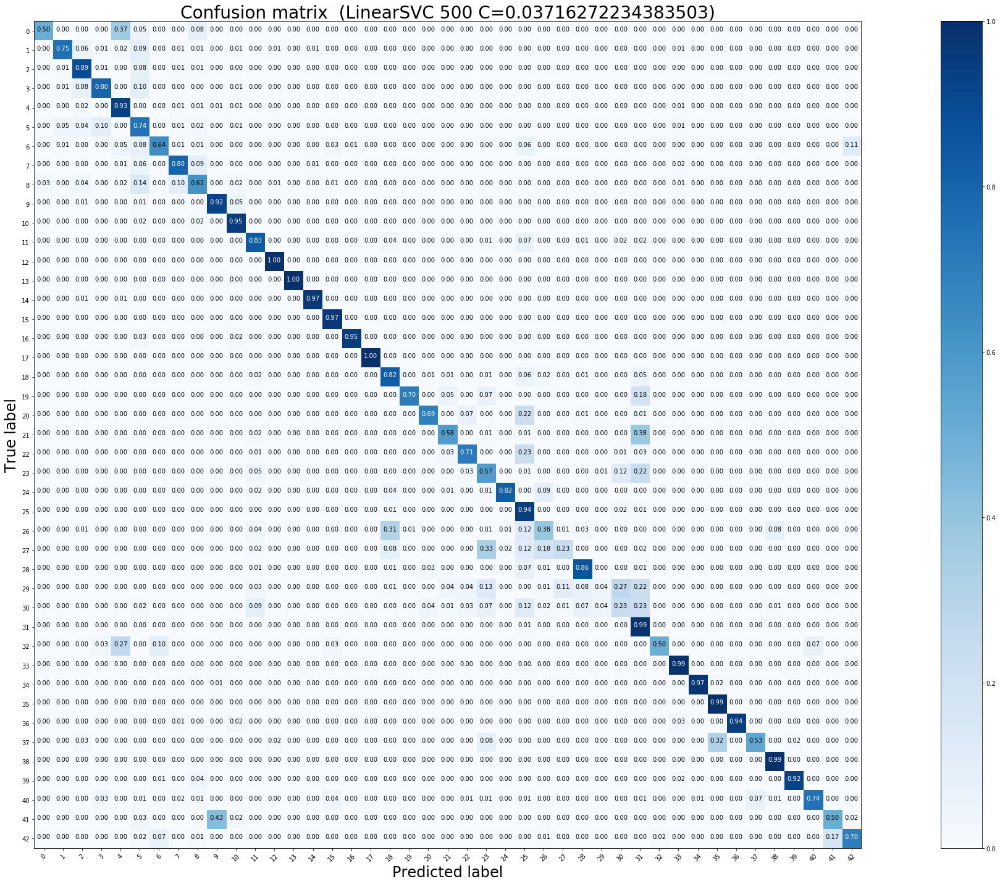

Test accuracy:  0.8488519398258115 

              precision    recall  f1-score   support

           0       0.64      0.50      0.56        60
           1       0.92      0.75      0.83       720
           2       0.82      0.89      0.86       750
           3       0.83      0.80      0.81       450
           4       0.89      0.93      0.91       660
           5       0.60      0.74      0.67       630
           6       0.86      0.64      0.73       150
           7       0.82      0.80      0.81       450
           8       0.74      0.62      0.67       450
           9       0.93      0.92      0.93       480
          10       0.91      0.95      0.93       660
          11       0.89      0.83      0.86       420
          12       0.97      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.96      0.97      0.96       270
          15       0.94      0.97      0.95       210
          16       0.98      0.95      0.97 

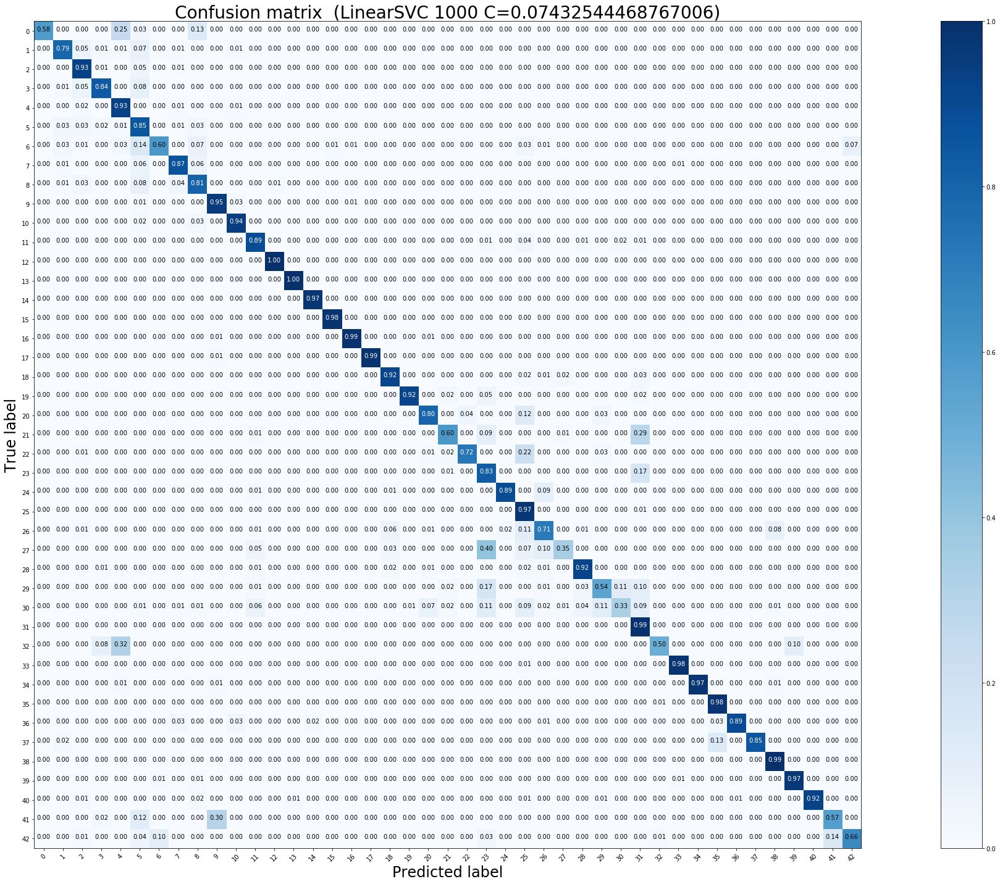

Test accuracy:  0.8948535233570863 

              precision    recall  f1-score   support

           0       0.97      0.58      0.73        60
           1       0.93      0.79      0.86       720
           2       0.85      0.93      0.89       750
           3       0.91      0.84      0.87       450
           4       0.91      0.93      0.92       660
           5       0.69      0.85      0.76       630
           6       0.85      0.60      0.70       150
           7       0.88      0.87      0.87       450
           8       0.81      0.81      0.81       450
           9       0.94      0.95      0.95       480
          10       0.94      0.94      0.94       660
          11       0.95      0.89      0.92       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.97      0.98       270
          15       0.98      0.98      0.98       210
          16       0.95      0.99      0.97 

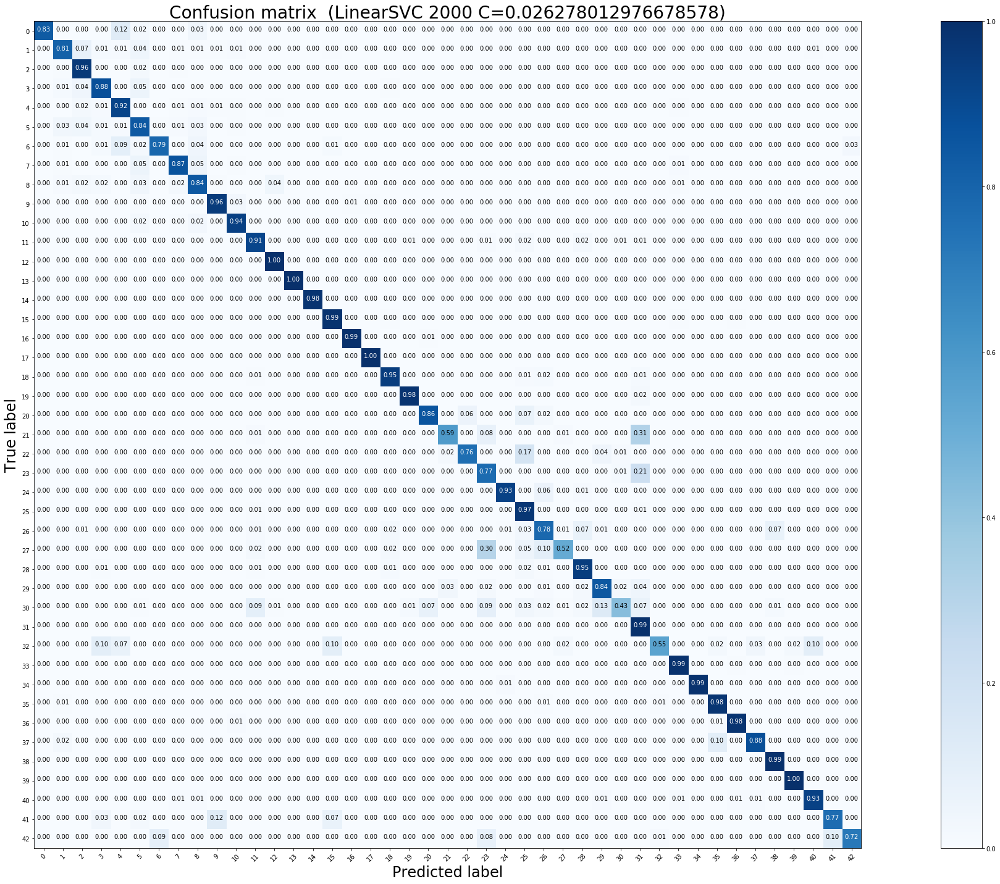

Test accuracy:  0.9147268408551069 

              precision    recall  f1-score   support

           0       0.93      0.83      0.88        60
           1       0.93      0.81      0.87       720
           2       0.86      0.96      0.91       750
           3       0.90      0.88      0.89       450
           4       0.94      0.92      0.93       660
           5       0.80      0.84      0.82       630
           6       0.91      0.79      0.84       150
           7       0.92      0.87      0.89       450
           8       0.84      0.84      0.84       450
           9       0.95      0.96      0.95       480
          10       0.95      0.94      0.94       660
          11       0.93      0.91      0.92       420
          12       0.97      1.00      0.98       690
          13       1.00      1.00      1.00       720
          14       0.98      0.98      0.98       270
          15       0.92      0.99      0.95       210
          16       0.97      0.99      0.98 

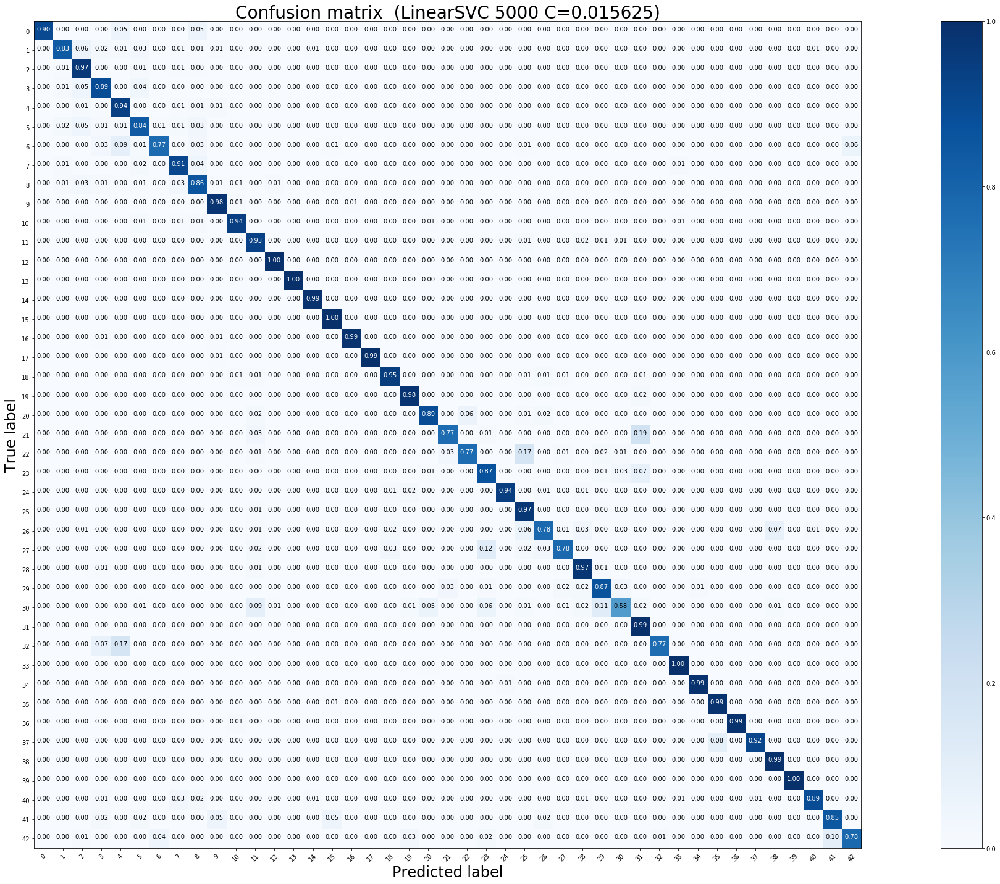

Test accuracy:  0.9292953285827396 

              precision    recall  f1-score   support

           0       0.89      0.90      0.89        60
           1       0.95      0.83      0.89       720
           2       0.86      0.97      0.91       750
           3       0.90      0.89      0.90       450
           4       0.93      0.94      0.94       660
           5       0.88      0.84      0.86       630
           6       0.94      0.77      0.85       150
           7       0.90      0.91      0.90       450
           8       0.85      0.86      0.85       450
           9       0.94      0.98      0.96       480
          10       0.97      0.94      0.95       660
          11       0.92      0.93      0.93       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.97      0.99      0.98       270
          15       0.95      1.00      0.97       210
          16       0.95      0.99      0.97 

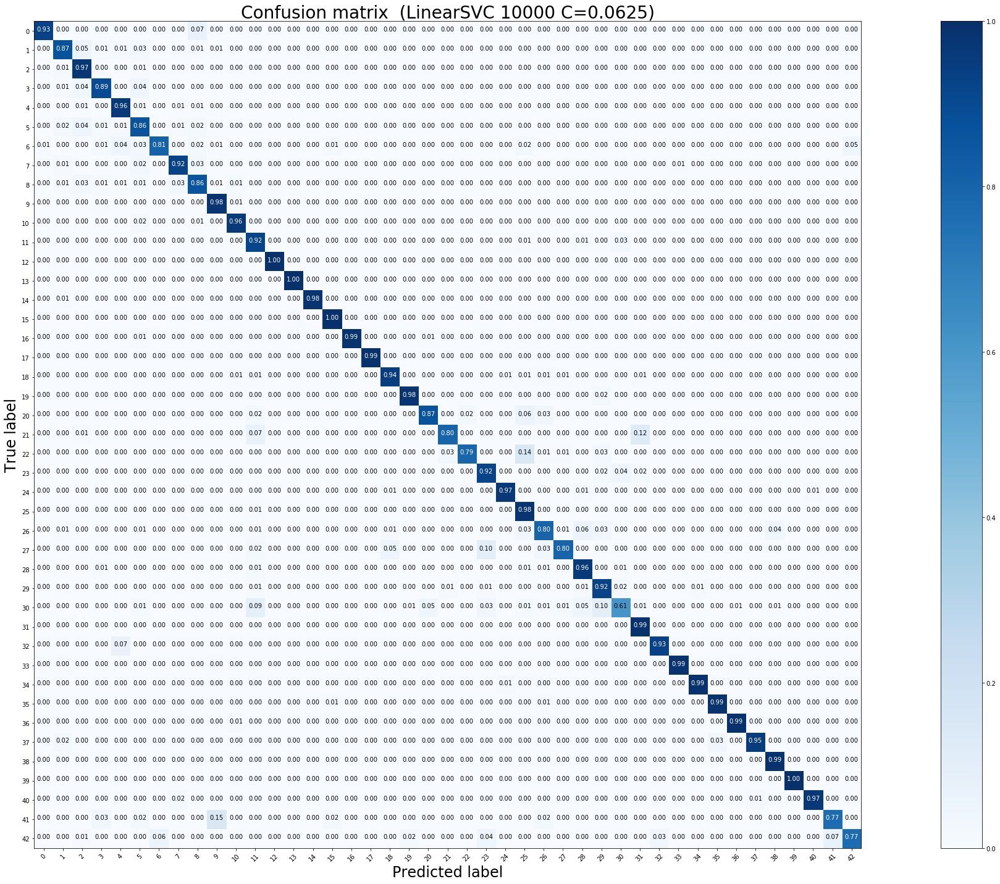

Test accuracy:  0.9380839271575614 

              precision    recall  f1-score   support

           0       0.93      0.93      0.93        60
           1       0.94      0.87      0.90       720
           2       0.88      0.97      0.92       750
           3       0.92      0.89      0.91       450
           4       0.96      0.96      0.96       660
           5       0.86      0.86      0.86       630
           6       0.95      0.81      0.87       150
           7       0.92      0.92      0.92       450
           8       0.90      0.86      0.88       450
           9       0.94      0.98      0.96       480
          10       0.96      0.96      0.96       660
          11       0.91      0.92      0.92       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.98      0.98       270
          15       0.96      1.00      0.98       210
          16       0.98      0.99      0.98 

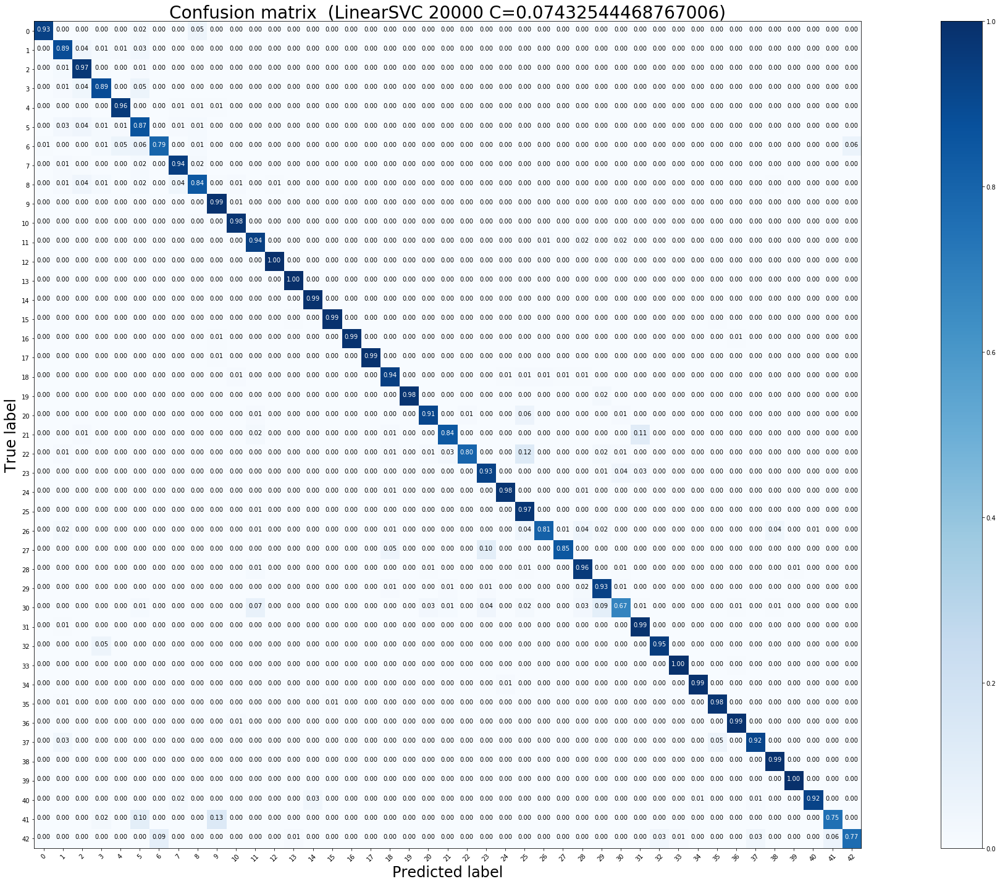

Test accuracy:  0.9423594615993666 

              precision    recall  f1-score   support

           0       0.98      0.93      0.96        60
           1       0.92      0.89      0.91       720
           2       0.88      0.97      0.92       750
           3       0.92      0.89      0.90       450
           4       0.96      0.96      0.96       660
           5       0.85      0.87      0.86       630
           6       0.94      0.79      0.86       150
           7       0.93      0.94      0.93       450
           8       0.92      0.84      0.88       450
           9       0.95      0.99      0.97       480
          10       0.97      0.98      0.98       660
          11       0.94      0.94      0.94       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.97      0.99      0.98       270
          15       0.98      0.99      0.98       210
          16       0.99      0.99      0.99 

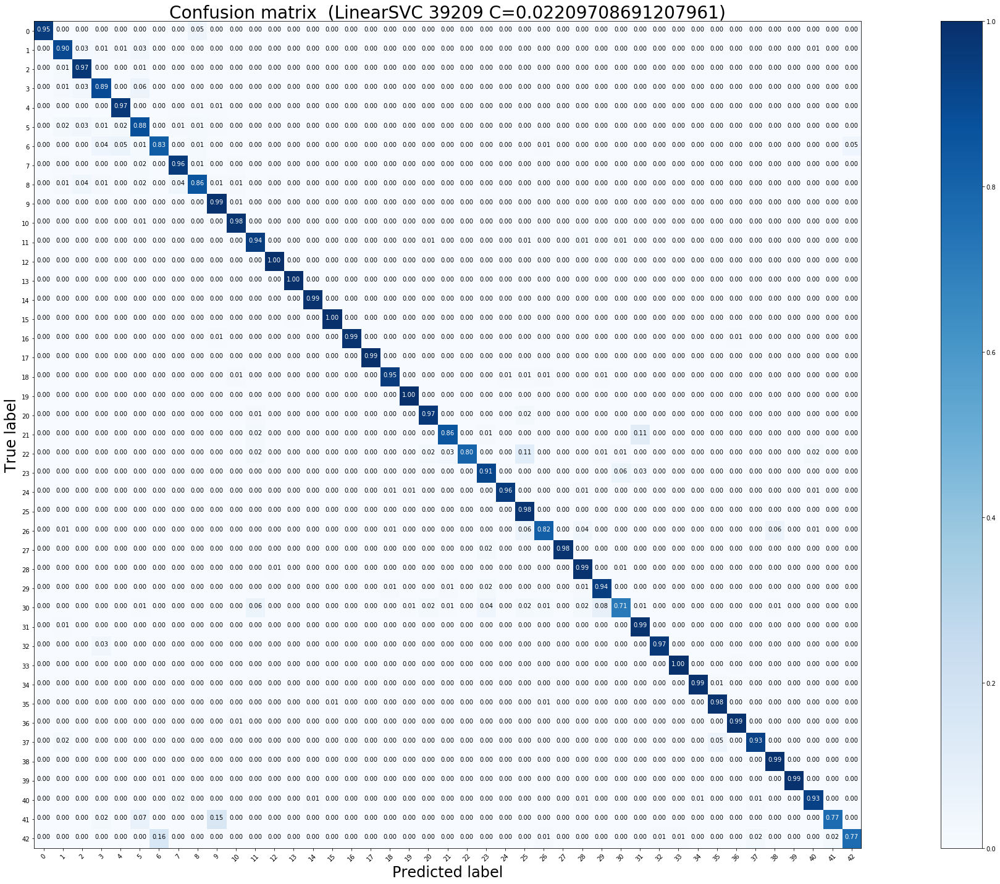

Test accuracy:  0.949089469517023 

              precision    recall  f1-score   support

           0       0.98      0.95      0.97        60
           1       0.94      0.90      0.92       720
           2       0.91      0.97      0.94       750
           3       0.93      0.89      0.91       450
           4       0.96      0.97      0.96       660
           5       0.87      0.88      0.87       630
           6       0.89      0.83      0.86       150
           7       0.93      0.96      0.94       450
           8       0.94      0.86      0.89       450
           9       0.95      0.99      0.97       480
          10       0.97      0.98      0.98       660
          11       0.95      0.94      0.95       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.98      0.99      0.98       270
          15       0.98      1.00      0.99       210
          16       1.00      0.99      0.99  

In [11]:
###############################################################################
###############################################################################
########################################################################################
###########   LinearSVC, squared_hinge, HOG ###################################
###########   opt. Parameter   ###########################################################
########################################################################################

train_LinearSVC_sq(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',0.03716272234383503, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',0.07432544468767006, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',0.026278012976678578, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',0.015625, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',0.0625, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',0.07432544468767006, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209', 0.02209708691207961 , 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")

Daten skalieren


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


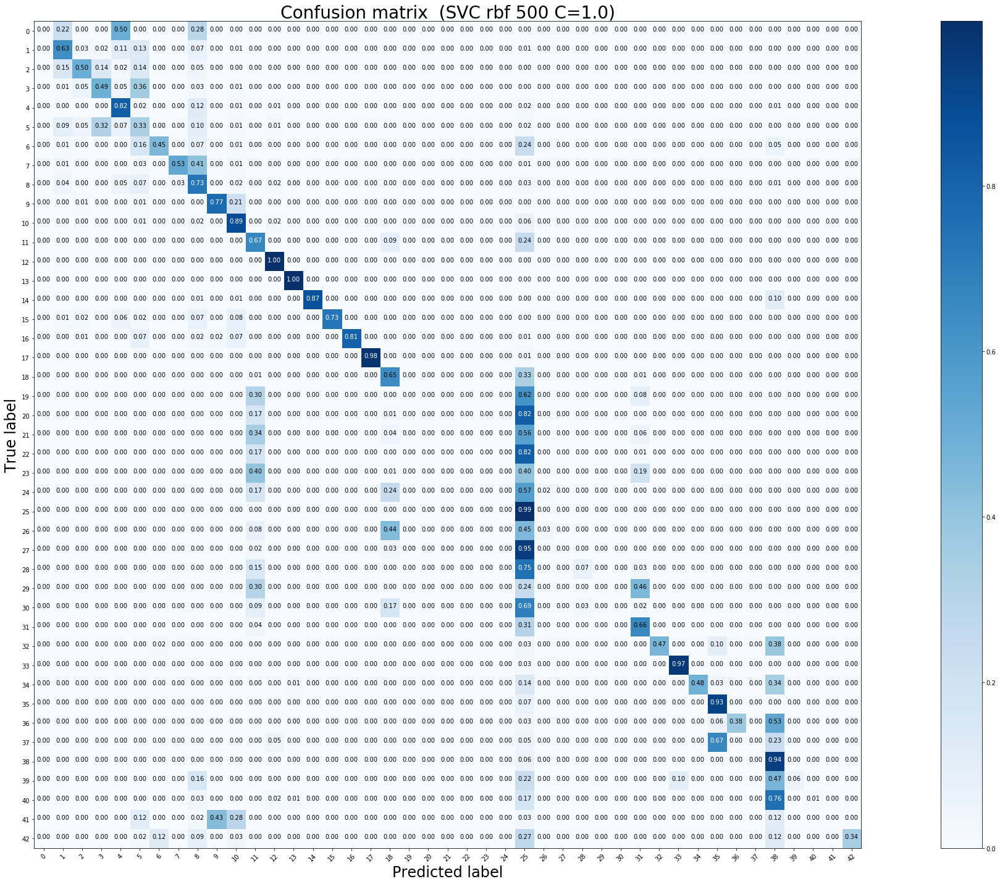

Test accuracy:  0.6531274742676167 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        60
           1       0.68      0.63      0.66       720
           2       0.82      0.50      0.62       750
           3       0.41      0.49      0.45       450
           4       0.71      0.82      0.76       660
           5       0.31      0.33      0.32       630
           6       0.85      0.45      0.59       150
           7       0.94      0.53      0.68       450
           8       0.39      0.73      0.51       450
           9       0.92      0.77      0.84       480
          10       0.76      0.89      0.82       660
          11       0.52      0.67      0.59       420
          12       0.94      1.00      0.97       690
          13       0.99      1.00      1.00       720
          14       1.00      0.87      0.93       270
          15       1.00      0.73      0.85       210
          16       1.00      0.81      0.89 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

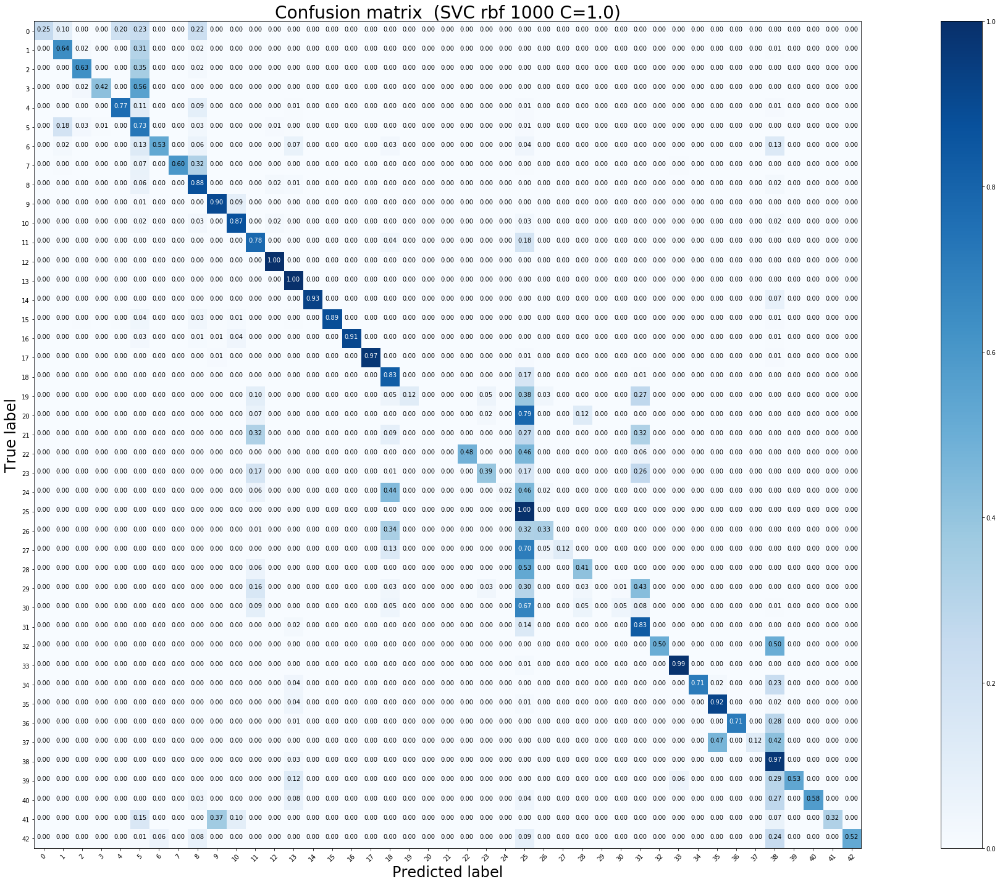

Test accuracy:  0.7450514647664291 

              precision    recall  f1-score   support

           0       1.00      0.25      0.40        60
           1       0.78      0.64      0.70       720
           2       0.92      0.63      0.75       750
           3       0.98      0.42      0.59       450
           4       0.97      0.77      0.86       660
           5       0.33      0.73      0.45       630
           6       0.94      0.53      0.68       150
           7       1.00      0.60      0.75       450
           8       0.56      0.88      0.68       450
           9       0.94      0.90      0.92       480
          10       0.90      0.87      0.89       660
          11       0.75      0.78      0.76       420
          12       0.96      1.00      0.98       690
          13       0.88      1.00      0.94       720
          14       1.00      0.93      0.96       270
          15       1.00      0.89      0.94       210
          16       1.00      0.91      0.95 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

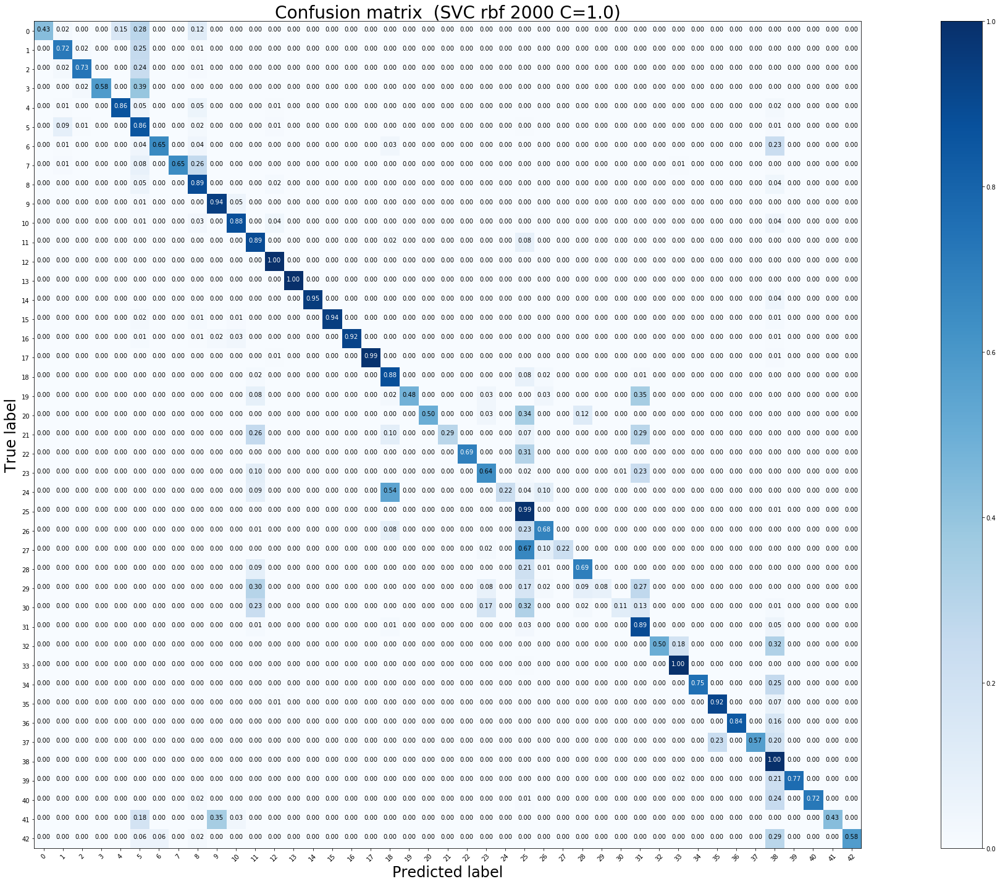

Test accuracy:  0.8205067300079176 

              precision    recall  f1-score   support

           0       1.00      0.43      0.60        60
           1       0.86      0.72      0.78       720
           2       0.95      0.73      0.83       750
           3       1.00      0.58      0.74       450
           4       0.98      0.86      0.92       660
           5       0.44      0.86      0.58       630
           6       0.95      0.65      0.77       150
           7       1.00      0.65      0.79       450
           8       0.65      0.89      0.75       450
           9       0.95      0.94      0.95       480
          10       0.94      0.88      0.91       660
          11       0.73      0.89      0.80       420
          12       0.93      1.00      0.96       690
          13       1.00      1.00      1.00       720
          14       1.00      0.95      0.98       270
          15       1.00      0.94      0.97       210
          16       1.00      0.92      0.96 

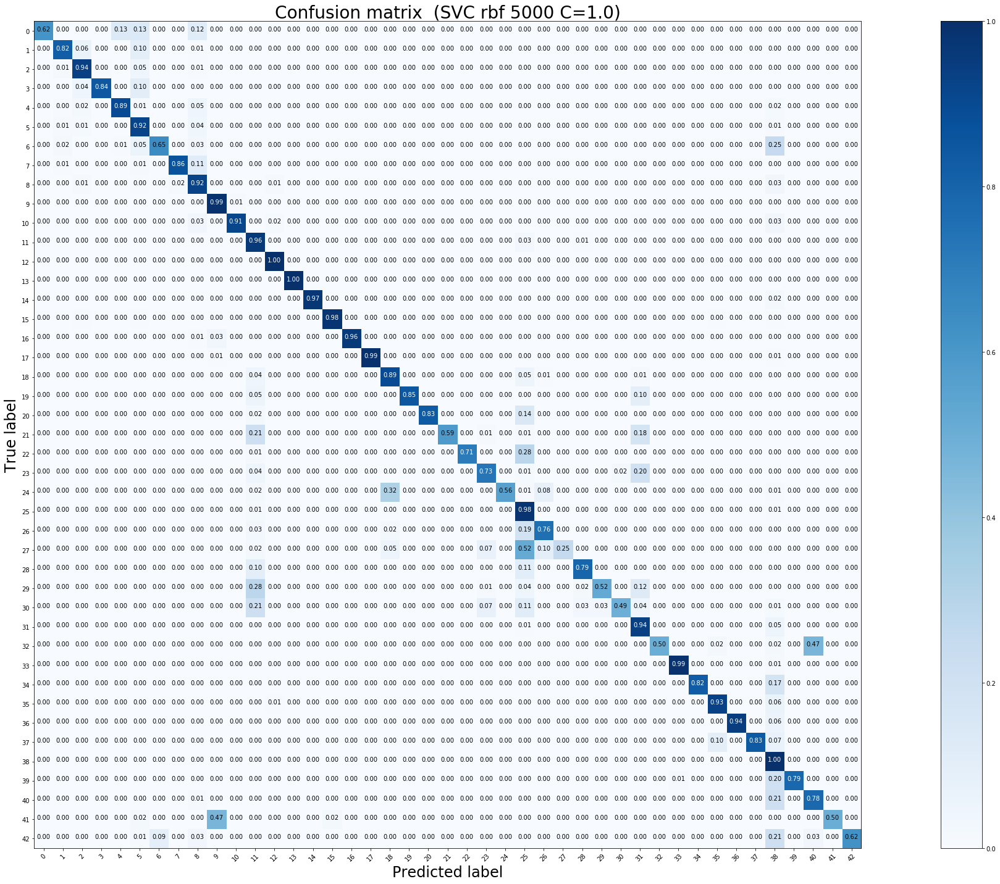

Test accuracy:  0.8944576405384006 

              precision    recall  f1-score   support

           0       1.00      0.62      0.76        60
           1       0.96      0.82      0.89       720
           2       0.88      0.94      0.91       750
           3       0.99      0.84      0.91       450
           4       0.98      0.89      0.94       660
           5       0.75      0.92      0.83       630
           6       0.92      0.65      0.76       150
           7       0.98      0.86      0.92       450
           8       0.73      0.92      0.82       450
           9       0.93      0.99      0.96       480
          10       0.98      0.91      0.95       660
          11       0.75      0.96      0.84       420
          12       0.97      1.00      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      0.97      0.98       270
          15       1.00      0.98      0.99       210
          16       1.00      0.96      0.98 

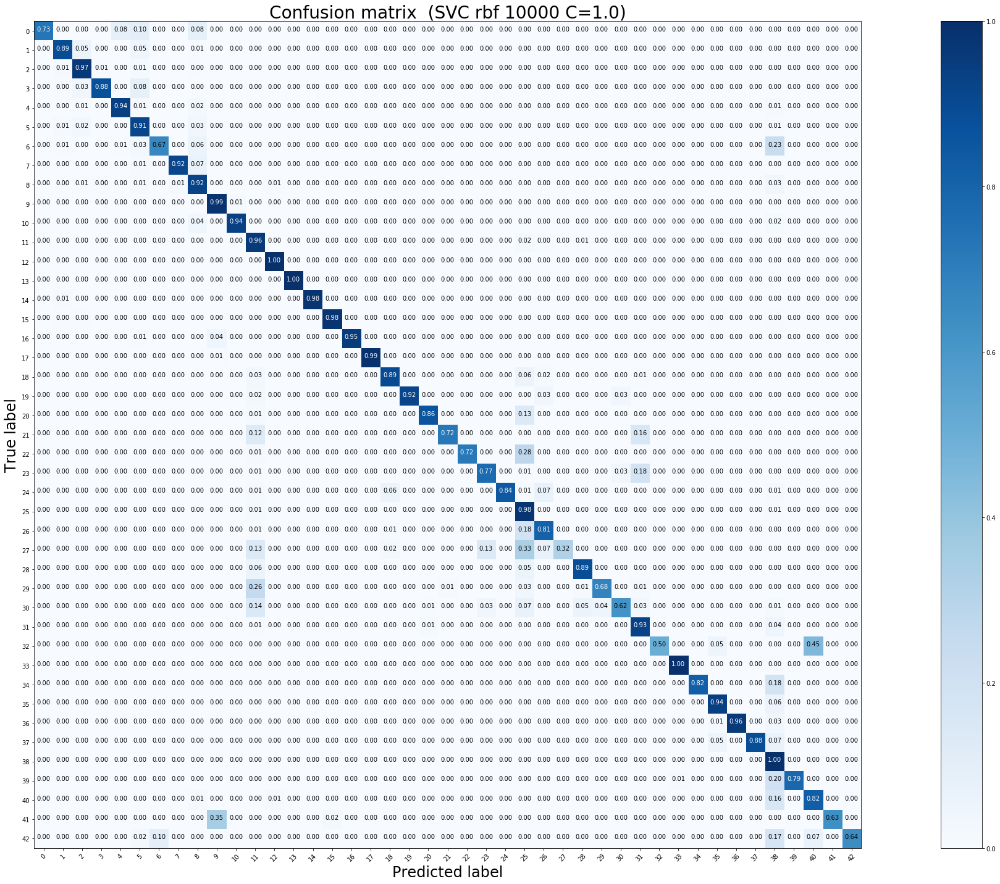

Test accuracy:  0.9180522565320665 

              precision    recall  f1-score   support

           0       1.00      0.73      0.85        60
           1       0.97      0.89      0.93       720
           2       0.90      0.97      0.93       750
           3       0.98      0.88      0.93       450
           4       0.99      0.94      0.96       660
           5       0.84      0.91      0.87       630
           6       0.92      0.67      0.77       150
           7       0.98      0.92      0.94       450
           8       0.78      0.92      0.85       450
           9       0.94      0.99      0.96       480
          10       0.99      0.94      0.96       660
          11       0.81      0.96      0.88       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.99       270
          15       1.00      0.98      0.99       210
          16       1.00      0.95      0.98 

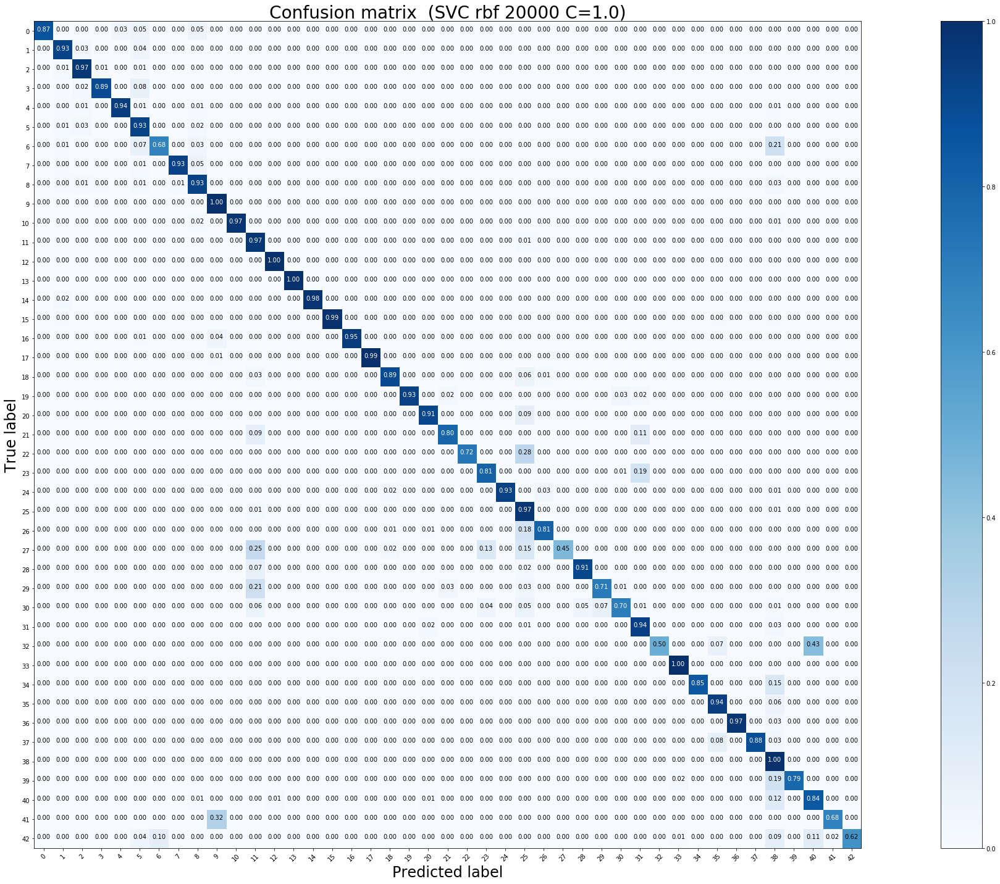

Test accuracy:  0.9312747426761678 

              precision    recall  f1-score   support

           0       1.00      0.87      0.93        60
           1       0.95      0.93      0.94       720
           2       0.92      0.97      0.95       750
           3       0.98      0.89      0.93       450
           4       1.00      0.94      0.97       660
           5       0.85      0.93      0.88       630
           6       0.92      0.68      0.78       150
           7       0.98      0.93      0.96       450
           8       0.87      0.93      0.90       450
           9       0.94      1.00      0.97       480
          10       0.99      0.97      0.98       660
          11       0.83      0.97      0.90       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.99       270
          15       1.00      0.99      0.99       210
          16       1.00      0.95      0.98 

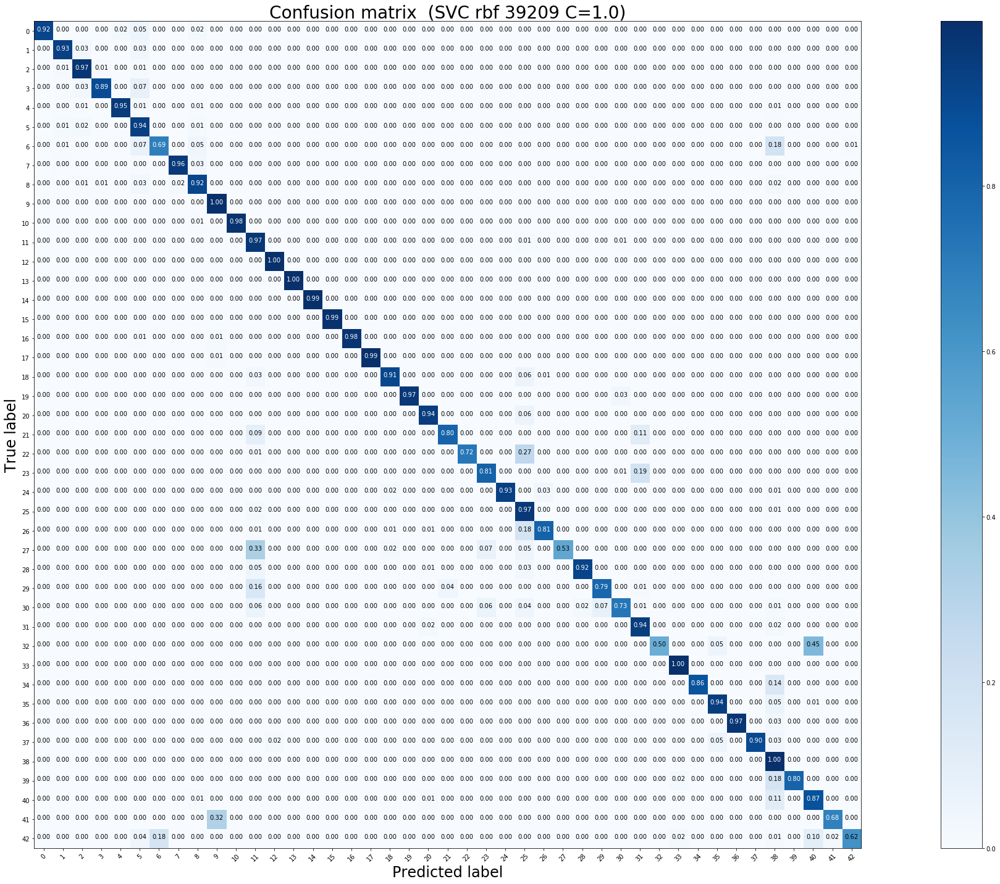

Test accuracy:  0.9374505146476643 

              precision    recall  f1-score   support

           0       1.00      0.92      0.96        60
           1       0.96      0.93      0.95       720
           2       0.93      0.97      0.95       750
           3       0.97      0.89      0.93       450
           4       1.00      0.95      0.97       660
           5       0.85      0.94      0.89       630
           6       0.87      0.69      0.77       150
           7       0.98      0.96      0.97       450
           8       0.91      0.92      0.91       450
           9       0.95      1.00      0.97       480
          10       0.99      0.98      0.99       660
          11       0.83      0.97      0.89       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       1.00      0.99      1.00       210
          16       1.00      0.98      0.99 

In [7]:
##############################################################################
##############################################################################
##############################################################################
###########   SVC RBF, HOG, seed=1, random_A, with_scaler ####################
###########   Training mit Defaultwerten
##############################################################################

train_RBF_SVC(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")


In [12]:
##################################################################################################
################ GridSearch, RBF-Kernel, mit StandardScaler ###############################################
################ 1. Durchlauf      #########################################################
###################################################################################

print("Trainingsmenge 500")
clf_500_RBF, time_500_RBF = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2_hue, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_500_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_500_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')
print("*********************************************")
print("Trainingsmenge 1000")
clf_1000_RBF, time_1000_RBF = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2_hue, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

Trainingsmenge 500


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 gamma_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01]

 Beste Score:  0.7018732994411334

 Besten Parameter:  {'svm__C': 64.0, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.033219 (0.031083) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.030341 (0.028481) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.028119 (0.033559) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.025457 (0.026428) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision-Score: 0.020815 (0.028003) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.00390625}
Precision-Score: 0.011841 (0.013886) mit Parameter: {

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 gamma_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01]

 Beste Score:  0.8482484606611774

 Besten Parameter:  {'svm__C': 256.0, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.018523 (0.013364) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.013442 (0.011630) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.011559 (0.006992) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.009766 (0.008676) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision-Score: 0.004304 (0.007558) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.00390625}
Precision-Score: 0.003537 (0.007105) mit Parameter: 

In [13]:
##################################################################################################
################ GridSearch, RBF-Kernel, mit StandardScaler ###############################################
################ 2. Durchlauf      #########################################################
###################################################################################

print("Trainingsmenge 500")
clf_500_RBF, time_500_RBF = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2_hue, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(64.0), get_finer_range(1.52587890625e-05),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_500_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_500_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')
print("*********************************************")
print("Trainingsmenge 1000")
clf_1000_RBF, time_1000_RBF = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2_hue, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(256.0), get_finer_range(1.52587890625e-05),'l2', 'hinge', 1)
save_trained_model_as_pkl(clf_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

Trainingsmenge 500


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [ 16.     19.027  22.627  26.909  32.     38.055  45.255  53.817  64.
  76.109  90.51  107.635 128.    152.219 181.019 215.269 256.   ]

 gamma_range: [3.815e-06 4.536e-06 5.395e-06 6.416e-06 7.629e-06 9.073e-06 1.079e-05
 1.283e-05 1.526e-05 1.815e-05 2.158e-05 2.566e-05 3.052e-05 3.629e-05
 4.316e-05 5.132e-05 6.104e-05]

 Beste Score:  0.7101734039793319

 Besten Parameter:  {'svm__C': 181.01933598375618, 'svm__gamma': 5.3947966093944364e-06}
Precision-Score: 0.429505 (0.080164) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.489631 (0.093273) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.542410 (0.104762) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 5.3947966093944364e-06}
Precision-Score: 0.565975 (0.098889) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 6.4155305118844185e-06}
Precision-Score: 0.613425 (0.133711) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 7.62939453125e-06}
Precision-Sco

Roc-Score: 0.855075 (0.051984) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 4.536465129862675e-06}
Roc-Score: 0.854846 (0.050456) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 5.3947966093944364e-06}
Roc-Score: 0.856181 (0.052091) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 6.4155305118844185e-06}
Roc-Score: 0.857548 (0.054539) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 7.62939453125e-06}
Roc-Score: 0.860846 (0.053859) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 9.07293025972535e-06}
Roc-Score: 0.861456 (0.053902) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 1.0789593218788873e-05}
Roc-Score: 0.860174 (0.052079) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 1.2831061023768837e-05}
Roc-Score: 0.863007 (0.056072) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 1.52587890625e-05}
Roc-Score: 0.862382 (0.055235) mit Parameter: {'svm__C': 45.254833995939045, 'svm__gamma': 1.

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [  64.      76.109   90.51   107.635  128.     152.219  181.019  215.269
  256.     304.437  362.039  430.539  512.     608.874  724.077  861.078
 1024.   ]

 gamma_range: [3.815e-06 4.536e-06 5.395e-06 6.416e-06 7.629e-06 9.073e-06 1.079e-05
 1.283e-05 1.526e-05 1.815e-05 2.158e-05 2.566e-05 3.052e-05 3.629e-05
 4.316e-05 5.132e-05 6.104e-05]

 Beste Score:  0.8490129985780409

 Besten Parameter:  {'svm__C': 152.2185107203483, 'svm__gamma': 7.62939453125e-06}
Precision-Score: 0.835910 (0.056074) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.838410 (0.054702) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.840040 (0.055049) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 5.3947966093944364e-06}
Precision-Score: 0.838736 (0.049278) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 6.4155305118844185e-06}
Precision-Score: 0.841134 (0.049599) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 7.62939453125e-06

Roc-Score: 0.928044 (0.023565) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 2.1579186437577746e-05}
Roc-Score: 0.927776 (0.023591) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 2.5662122047537674e-05}
Roc-Score: 0.926503 (0.023790) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 3.0517578125e-05}
Roc-Score: 0.925875 (0.024414) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 3.62917210389014e-05}
Roc-Score: 0.925437 (0.024477) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 4.315837287515549e-05}
Roc-Score: 0.923738 (0.025488) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 5.132424409507535e-05}
Roc-Score: 0.923417 (0.025956) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 6.103515625e-05}
Roc-Score: 0.930815 (0.022139) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 3.814697265625e-06}
Roc-Score: 0.930815 (0.022139) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 4.536465129862675e-06}
Roc-Score: 0.930815 (0.022139) mit Parameter: {'svm__C': 304.4370214406966, 'svm

Daten skalieren


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


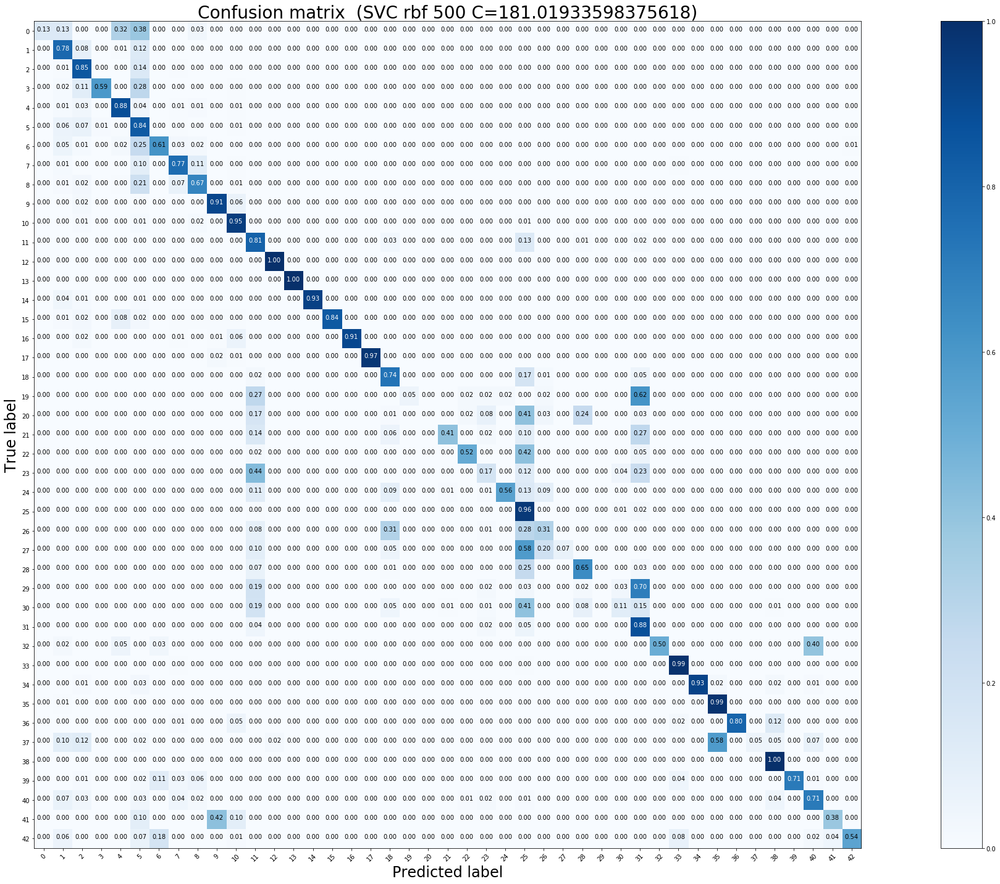

Test accuracy:  0.801187648456057 

              precision    recall  f1-score   support

           0       1.00      0.13      0.24        60
           1       0.83      0.78      0.80       720
           2       0.73      0.85      0.79       750
           3       0.98      0.59      0.74       450
           4       0.92      0.88      0.90       660
           5       0.48      0.84      0.61       630
           6       0.77      0.61      0.68       150
           7       0.85      0.77      0.81       450
           8       0.78      0.67      0.72       450
           9       0.93      0.91      0.92       480
          10       0.90      0.95      0.92       660
          11       0.61      0.81      0.69       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      0.93      0.97       270
          15       1.00      0.84      0.91       210
          16       1.00      0.91      0.95  

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

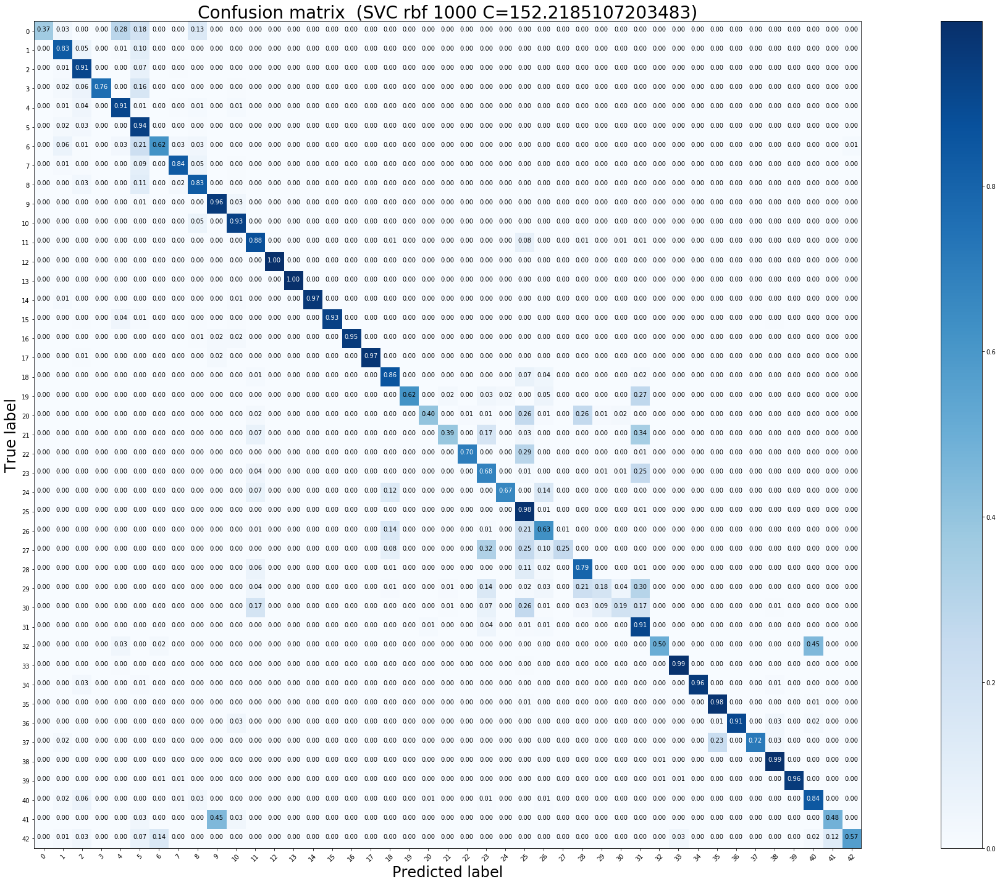

Test accuracy:  0.8707046714172605 

              precision    recall  f1-score   support

           0       1.00      0.37      0.54        60
           1       0.91      0.83      0.87       720
           2       0.83      0.91      0.87       750
           3       0.99      0.76      0.86       450
           4       0.94      0.91      0.92       660
           5       0.62      0.94      0.75       630
           6       0.86      0.62      0.72       150
           7       0.94      0.84      0.88       450
           8       0.80      0.83      0.82       450
           9       0.93      0.96      0.94       480
          10       0.93      0.93      0.93       660
          11       0.84      0.88      0.86       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      0.97      0.98       270
          15       1.00      0.93      0.96       210
          16       0.99      0.95      0.97 

In [14]:
train_RBF_SVC(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',181.01933598375618, 5.3947966093944364e-06, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',152.2185107203483, 7.62939453125e-06, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt_ski_l2_hys_hue_256/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")


In [ ]:
#########################################################################
##########   2. Aufteilung der Trainingsdaten 
##########   gemäss   make_training_subset_B
#########################################################################

X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200 = make_training_subsets_B(X_train_9_4_2_hue, y_train)


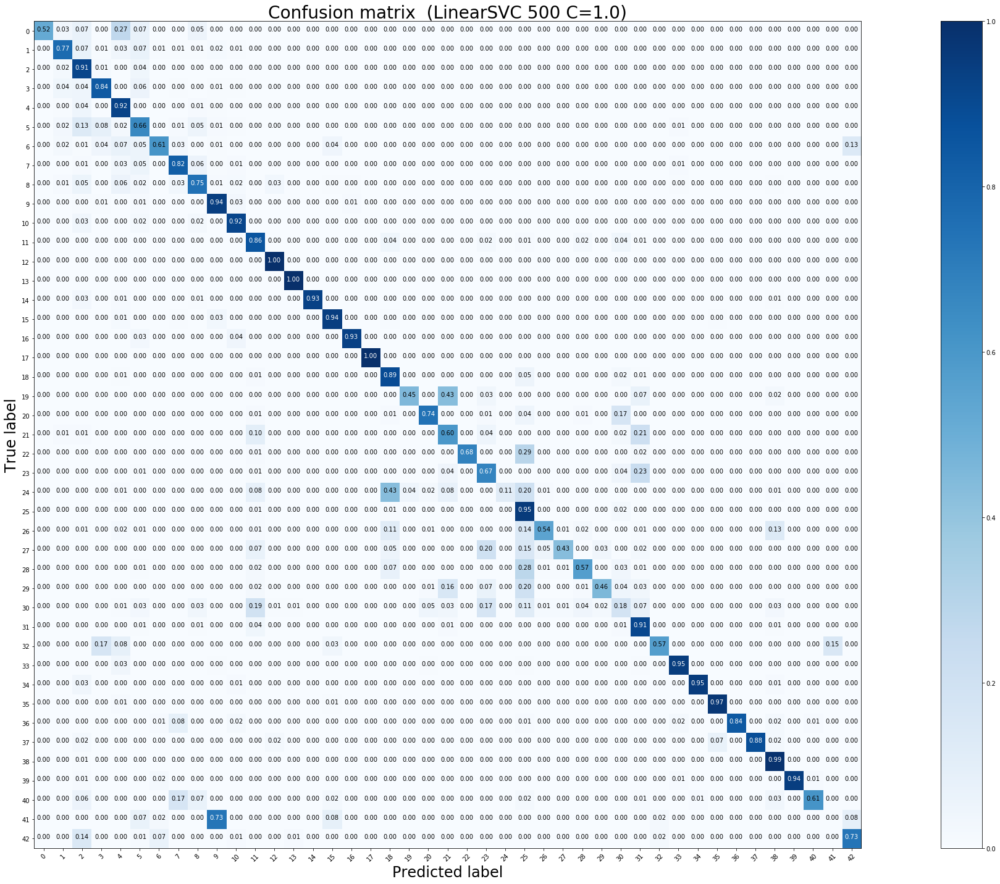

Test accuracy:  0.8460015835312747 

              precision    recall  f1-score   support

           0       1.00      0.52      0.68        60
           1       0.89      0.77      0.83       720
           2       0.71      0.91      0.80       750
           3       0.81      0.84      0.82       450
           4       0.82      0.92      0.87       660
           5       0.69      0.66      0.67       630
           6       0.87      0.61      0.71       150
           7       0.86      0.82      0.84       450
           8       0.78      0.75      0.76       450
           9       0.84      0.94      0.89       480
          10       0.93      0.92      0.92       660
          11       0.82      0.86      0.84       420
          12       0.97      1.00      0.98       690
          13       0.99      1.00      1.00       720
          14       1.00      0.93      0.96       270
          15       0.90      0.94      0.92       210
          16       0.95      0.93      0.94 

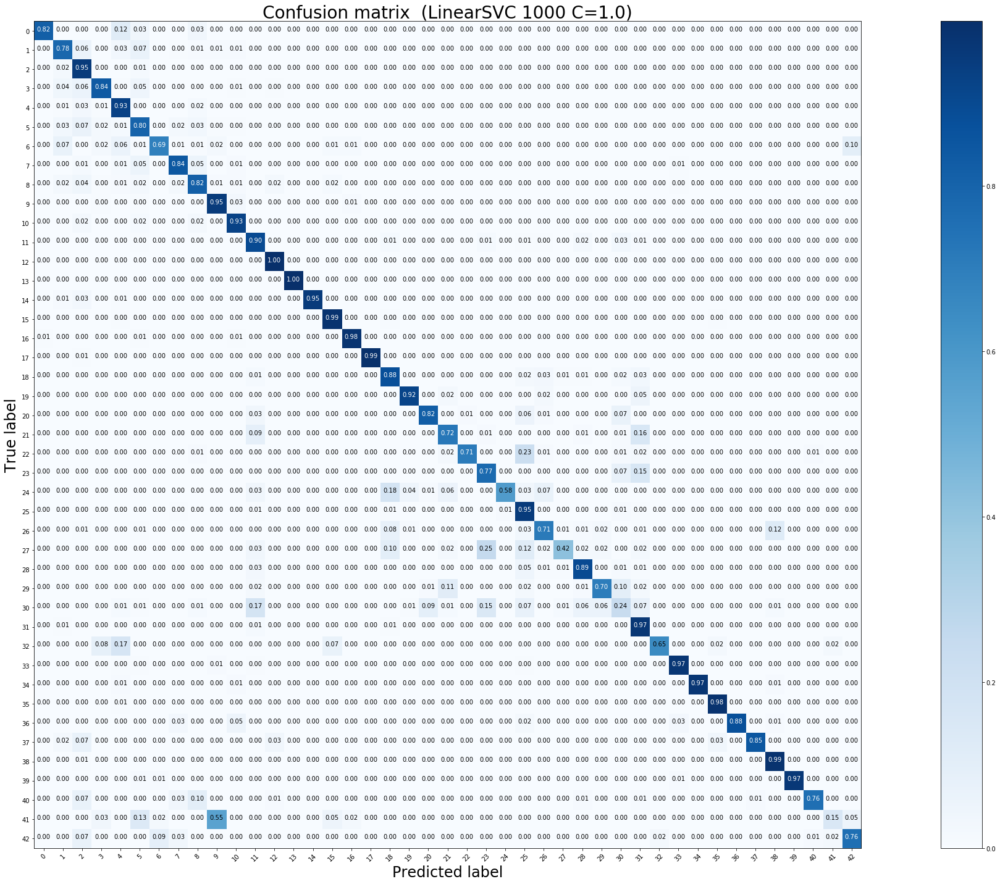

Test accuracy:  0.8871733966745843 

              precision    recall  f1-score   support

           0       0.98      0.82      0.89        60
           1       0.87      0.78      0.83       720
           2       0.78      0.95      0.86       750
           3       0.92      0.84      0.88       450
           4       0.88      0.93      0.90       660
           5       0.78      0.80      0.79       630
           6       0.91      0.69      0.78       150
           7       0.91      0.84      0.87       450
           8       0.81      0.82      0.81       450
           9       0.89      0.95      0.92       480
          10       0.93      0.93      0.93       660
          11       0.86      0.90      0.88       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.95      0.97       270
          15       0.91      0.99      0.95       210
          16       0.92      0.98      0.95 

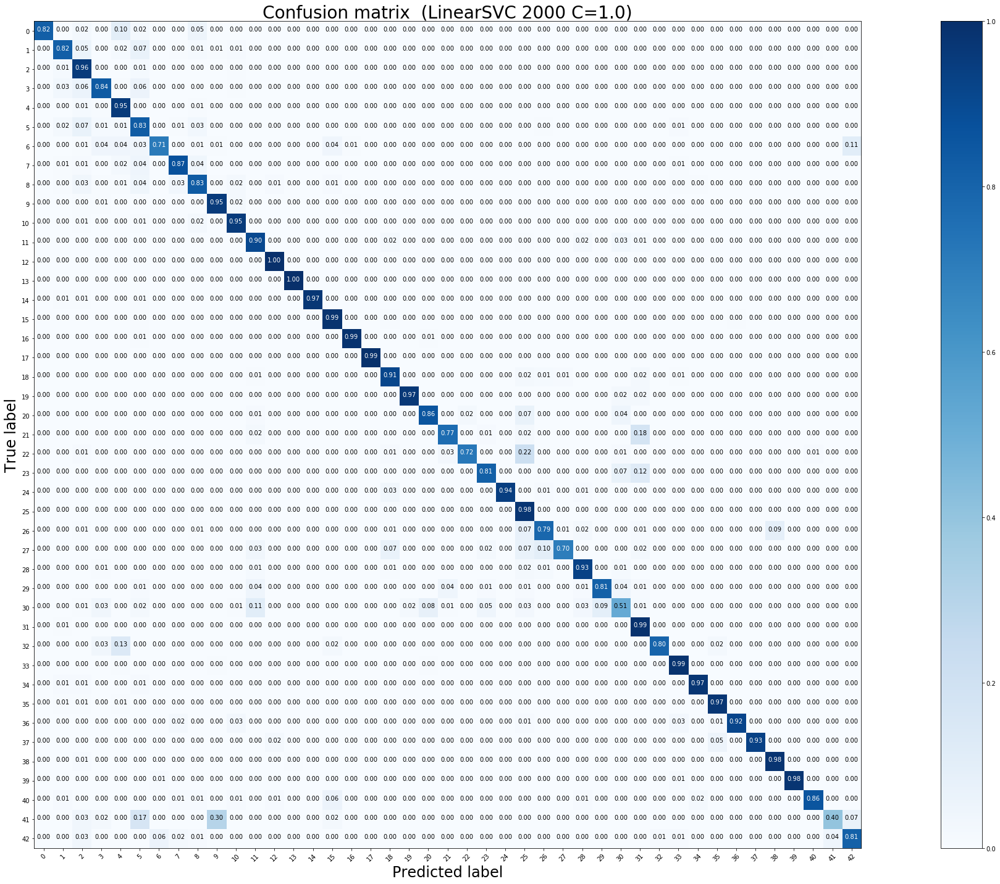

Test accuracy:  0.9128266033254157 

              precision    recall  f1-score   support

           0       0.96      0.82      0.88        60
           1       0.91      0.82      0.86       720
           2       0.81      0.96      0.88       750
           3       0.91      0.84      0.87       450
           4       0.92      0.95      0.94       660
           5       0.77      0.83      0.80       630
           6       0.95      0.71      0.81       150
           7       0.93      0.87      0.90       450
           8       0.84      0.83      0.84       450
           9       0.94      0.95      0.95       480
          10       0.94      0.95      0.95       660
          11       0.92      0.90      0.91       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.97      0.98       270
          15       0.89      0.99      0.94       210
          16       0.97      0.99      0.98 

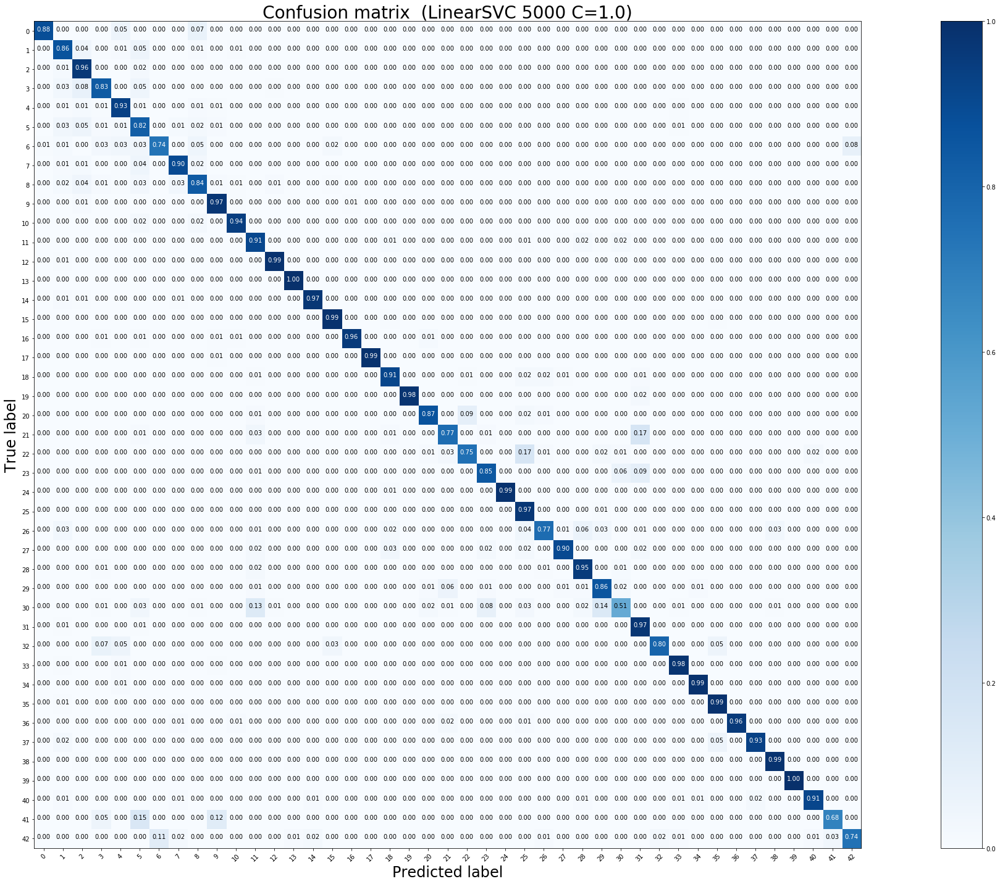

Test accuracy:  0.9196357878068092 

              precision    recall  f1-score   support

           0       0.93      0.88      0.91        60
           1       0.88      0.86      0.87       720
           2       0.84      0.96      0.90       750
           3       0.91      0.83      0.87       450
           4       0.94      0.93      0.94       660
           5       0.77      0.82      0.80       630
           6       0.92      0.74      0.82       150
           7       0.93      0.90      0.91       450
           8       0.86      0.84      0.85       450
           9       0.94      0.97      0.96       480
          10       0.97      0.94      0.96       660
          11       0.91      0.91      0.91       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      0.99       720
          14       0.98      0.97      0.98       270
          15       0.95      0.99      0.97       210
          16       0.97      0.96      0.96 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


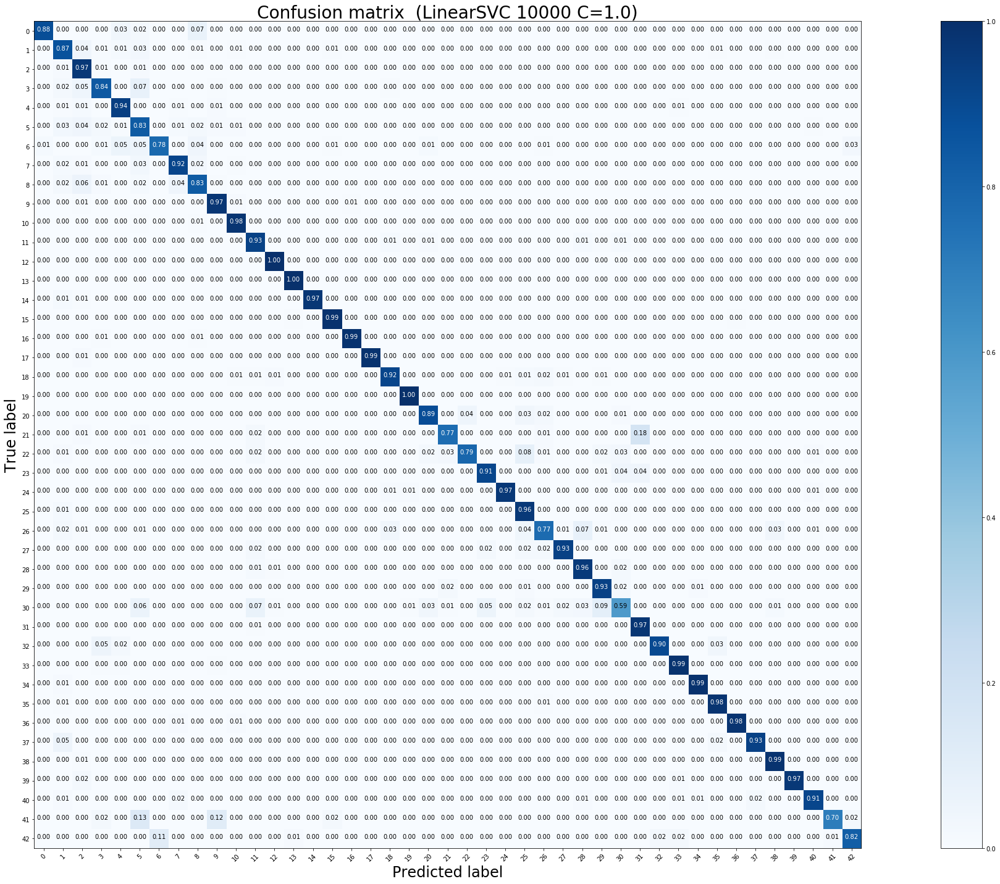

Test accuracy:  0.9293745051464767 

              precision    recall  f1-score   support

           0       0.93      0.88      0.91        60
           1       0.89      0.87      0.88       720
           2       0.84      0.97      0.90       750
           3       0.91      0.84      0.88       450
           4       0.95      0.94      0.95       660
           5       0.82      0.83      0.83       630
           6       0.91      0.78      0.84       150
           7       0.91      0.92      0.91       450
           8       0.89      0.83      0.86       450
           9       0.94      0.97      0.96       480
          10       0.96      0.98      0.97       660
          11       0.94      0.93      0.93       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.97      0.98       270
          15       0.95      0.99      0.97       210
          16       0.98      0.99      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


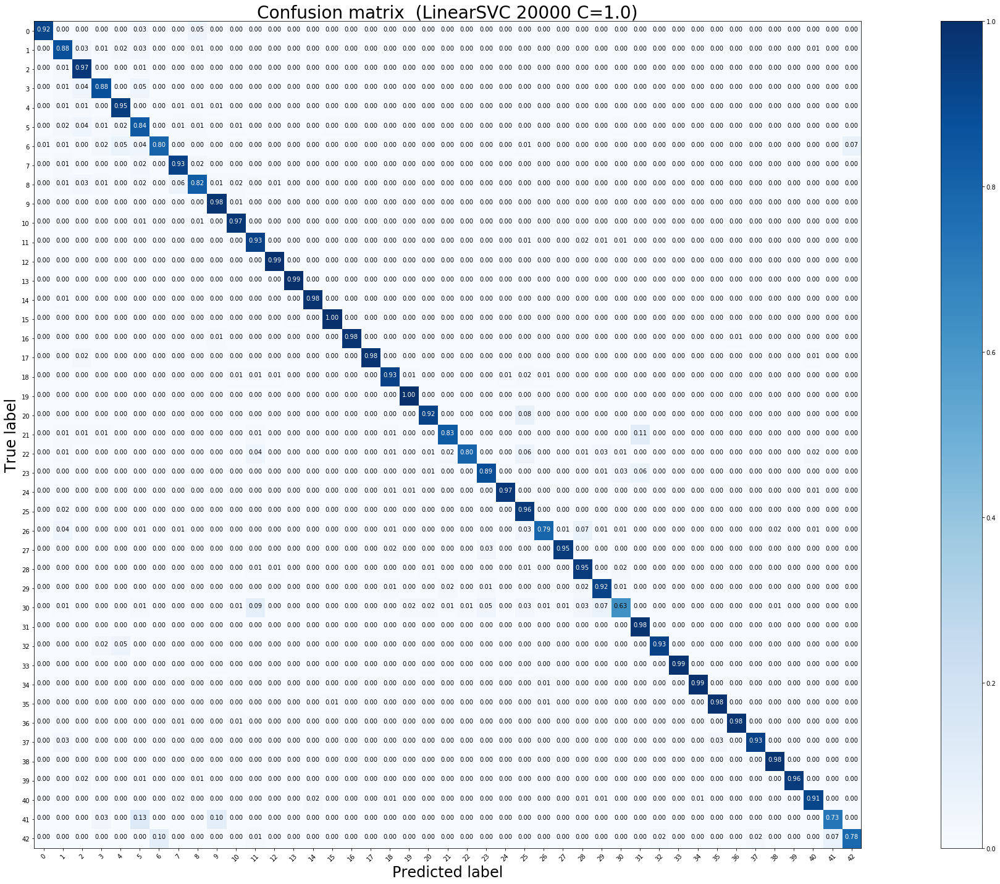

Test accuracy:  0.9333333333333333 

              precision    recall  f1-score   support

           0       0.90      0.92      0.91        60
           1       0.88      0.88      0.88       720
           2       0.87      0.97      0.92       750
           3       0.93      0.88      0.91       450
           4       0.94      0.95      0.94       660
           5       0.84      0.84      0.84       630
           6       0.92      0.80      0.86       150
           7       0.90      0.93      0.92       450
           8       0.91      0.82      0.86       450
           9       0.95      0.98      0.97       480
          10       0.96      0.97      0.97       660
          11       0.93      0.93      0.93       420
          12       0.98      0.99      0.99       690
          13       1.00      0.99      1.00       720
          14       0.97      0.98      0.97       270
          15       0.96      1.00      0.98       210
          16       0.97      0.98      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


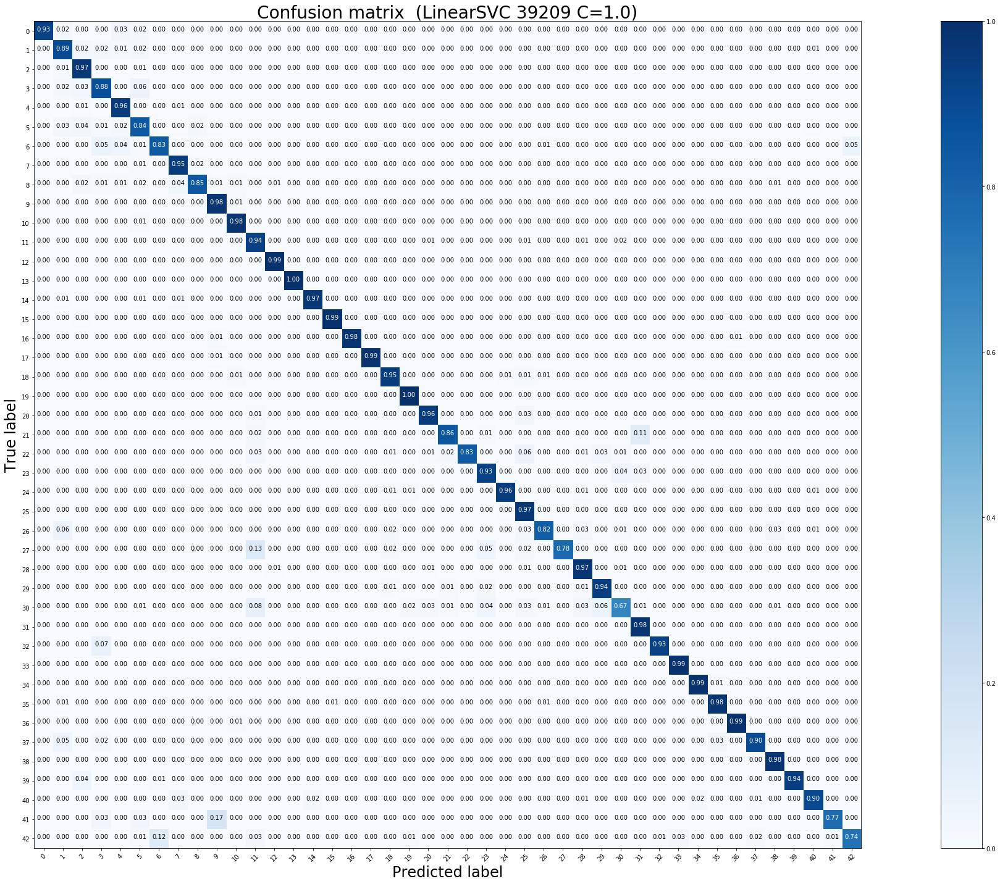

Test accuracy:  0.9401425178147268 

              precision    recall  f1-score   support

           0       0.97      0.93      0.95        60
           1       0.91      0.89      0.90       720
           2       0.90      0.97      0.93       750
           3       0.89      0.88      0.89       450
           4       0.94      0.96      0.95       660
           5       0.87      0.84      0.86       630
           6       0.91      0.83      0.87       150
           7       0.92      0.95      0.94       450
           8       0.93      0.85      0.89       450
           9       0.95      0.98      0.97       480
          10       0.97      0.98      0.97       660
          11       0.92      0.94      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.96      0.97      0.97       270
          15       0.97      0.99      0.98       210
          16       0.99      0.98      0.98 

In [4]:
##############################################################################
##############################################################################
##############################################################################
###########   LinearSVC, HOG, hinge, seed=1, random_B, without_scaler ########
###########   Defaultwerte   #################################################
##############################################################################

train_LinearSVC(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler", "HOG_942_balanced.pkl")

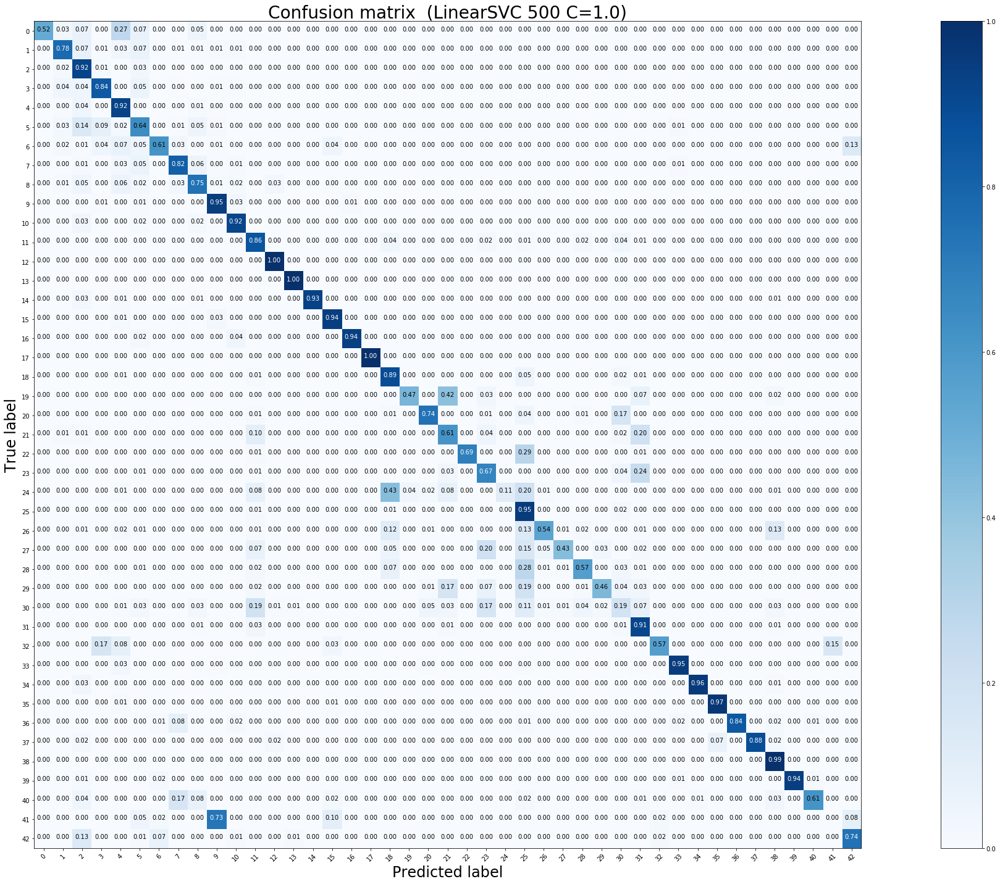

Test accuracy:  0.8466349960411718 

              precision    recall  f1-score   support

           0       1.00      0.52      0.68        60
           1       0.88      0.78      0.83       720
           2       0.71      0.92      0.80       750
           3       0.81      0.84      0.82       450
           4       0.82      0.92      0.87       660
           5       0.69      0.64      0.67       630
           6       0.88      0.61      0.72       150
           7       0.86      0.82      0.84       450
           8       0.77      0.75      0.76       450
           9       0.84      0.95      0.89       480
          10       0.93      0.92      0.92       660
          11       0.82      0.86      0.84       420
          12       0.97      1.00      0.98       690
          13       0.99      1.00      1.00       720
          14       1.00      0.93      0.96       270
          15       0.89      0.94      0.92       210
          16       0.95      0.94      0.95 

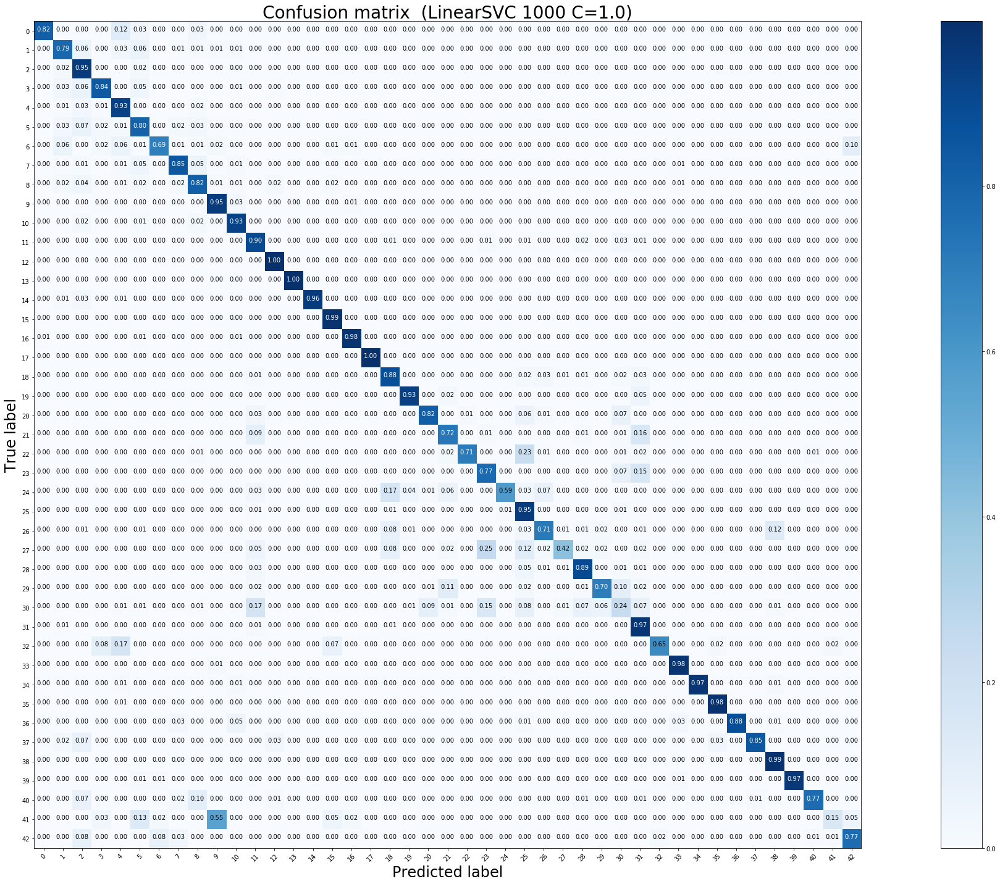

Test accuracy:  0.8885193982581155 

              precision    recall  f1-score   support

           0       0.98      0.82      0.89        60
           1       0.87      0.79      0.83       720
           2       0.78      0.95      0.86       750
           3       0.92      0.84      0.88       450
           4       0.88      0.93      0.91       660
           5       0.79      0.80      0.80       630
           6       0.91      0.69      0.79       150
           7       0.91      0.85      0.88       450
           8       0.81      0.82      0.81       450
           9       0.89      0.95      0.92       480
          10       0.93      0.93      0.93       660
          11       0.86      0.90      0.88       420
          12       0.97      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.96      0.98       270
          15       0.91      0.99      0.95       210
          16       0.92      0.98      0.95 

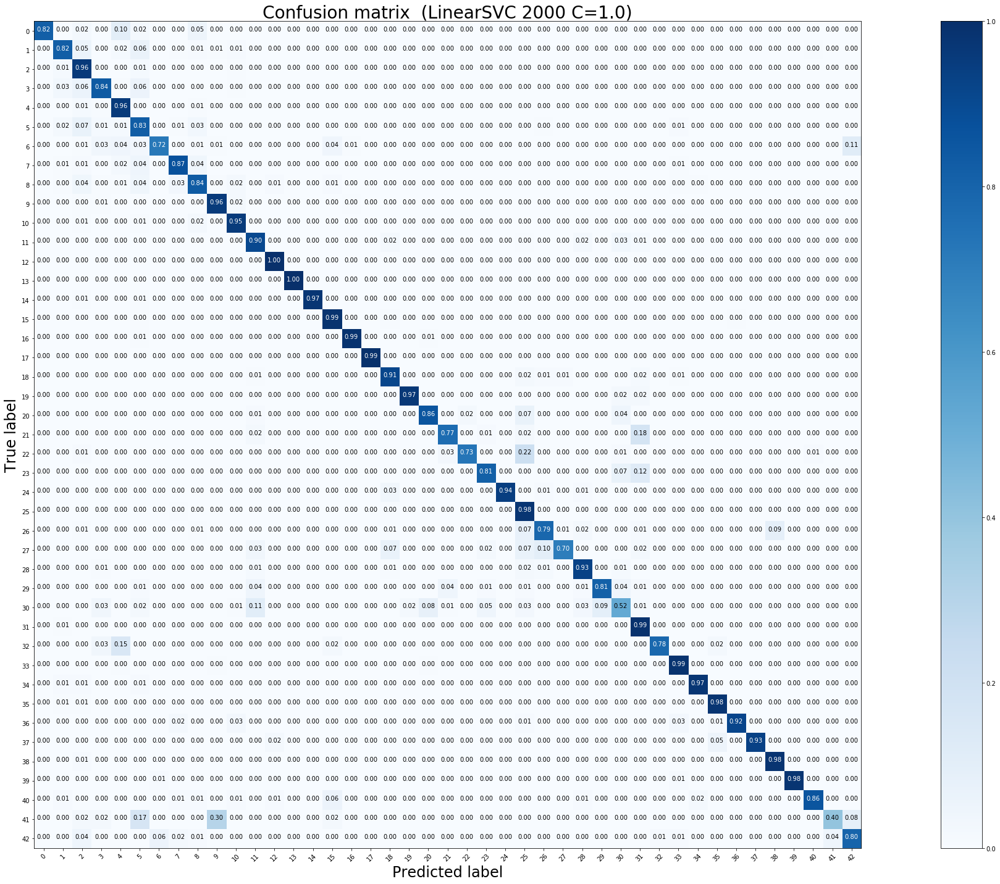

Test accuracy:  0.9136975455265242 

              precision    recall  f1-score   support

           0       0.96      0.82      0.88        60
           1       0.91      0.82      0.87       720
           2       0.81      0.96      0.88       750
           3       0.91      0.84      0.87       450
           4       0.92      0.96      0.94       660
           5       0.78      0.83      0.80       630
           6       0.95      0.72      0.82       150
           7       0.93      0.87      0.90       450
           8       0.84      0.84      0.84       450
           9       0.94      0.96      0.95       480
          10       0.94      0.95      0.95       660
          11       0.92      0.90      0.91       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.90      0.99      0.94       210
          16       0.97      0.99      0.98 

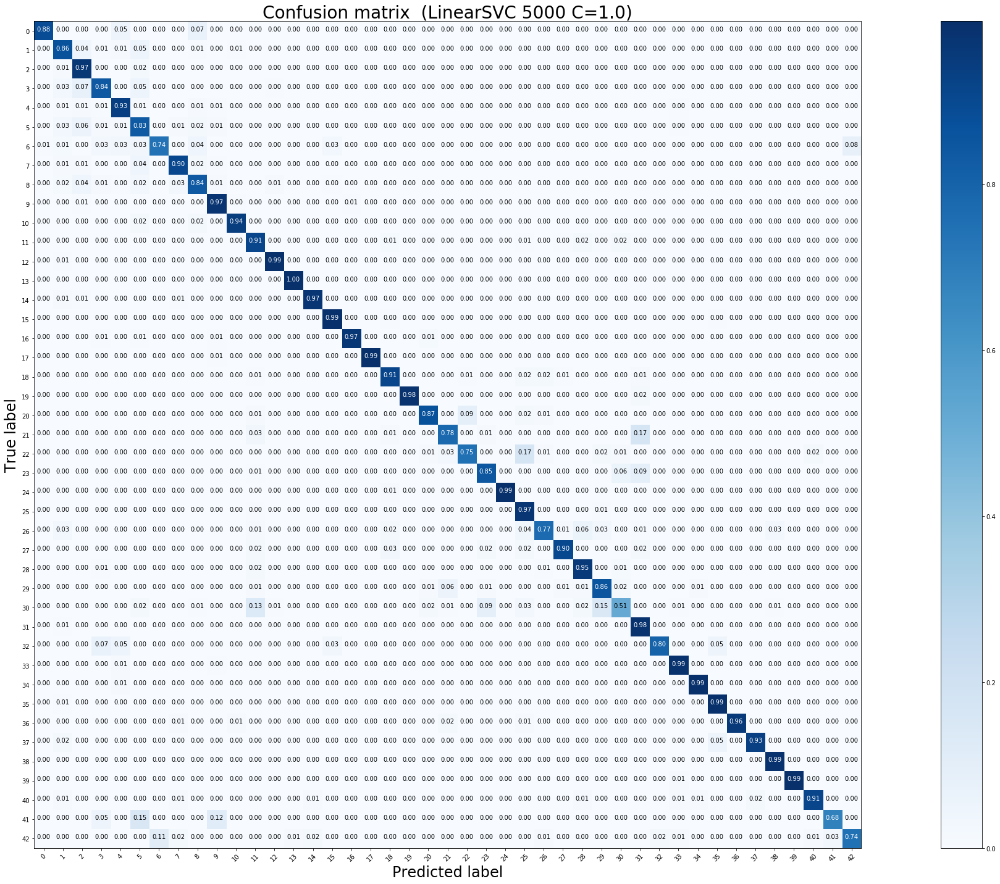

Test accuracy:  0.9216152019002375 

              precision    recall  f1-score   support

           0       0.93      0.88      0.91        60
           1       0.89      0.86      0.87       720
           2       0.84      0.97      0.90       750
           3       0.92      0.84      0.88       450
           4       0.95      0.93      0.94       660
           5       0.78      0.83      0.81       630
           6       0.92      0.74      0.82       150
           7       0.93      0.90      0.92       450
           8       0.86      0.84      0.85       450
           9       0.94      0.97      0.96       480
          10       0.98      0.94      0.96       660
          11       0.91      0.91      0.91       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.98      0.97      0.98       270
          15       0.95      0.99      0.97       210
          16       0.97      0.97      0.97 

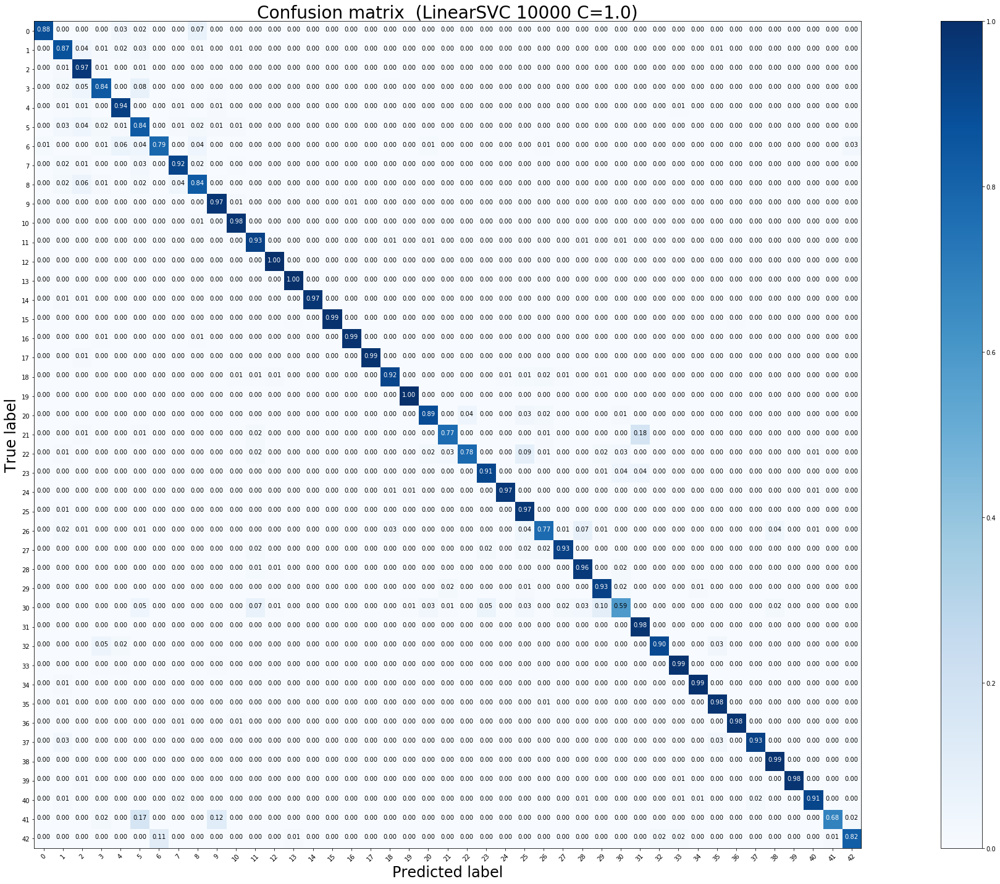

Test accuracy:  0.9304038004750593 

              precision    recall  f1-score   support

           0       0.96      0.88      0.92        60
           1       0.89      0.87      0.88       720
           2       0.84      0.97      0.90       750
           3       0.91      0.84      0.87       450
           4       0.95      0.94      0.94       660
           5       0.82      0.84      0.83       630
           6       0.91      0.79      0.85       150
           7       0.92      0.92      0.92       450
           8       0.90      0.84      0.86       450
           9       0.94      0.97      0.96       480
          10       0.97      0.98      0.97       660
          11       0.94      0.93      0.94       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.97      0.98       270
          15       0.97      0.99      0.98       210
          16       0.98      0.99      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


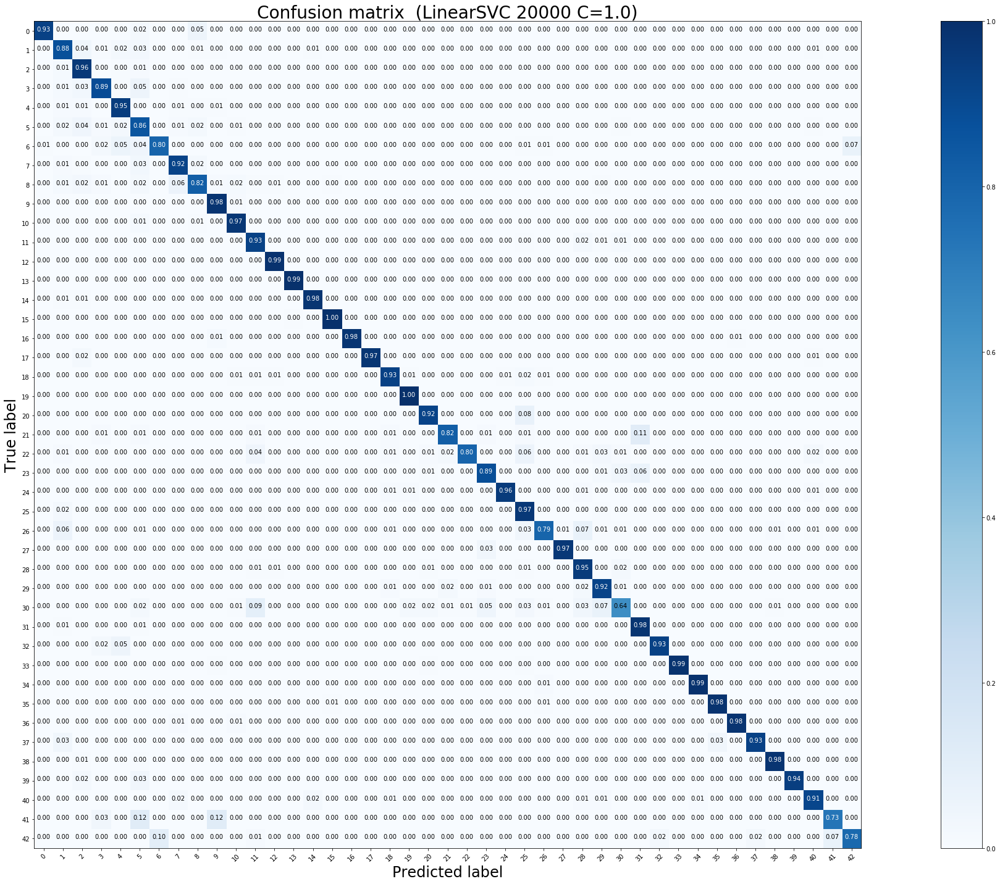

Test accuracy:  0.9341250989707047 

              precision    recall  f1-score   support

           0       0.95      0.93      0.94        60
           1       0.89      0.88      0.88       720
           2       0.87      0.96      0.91       750
           3       0.93      0.89      0.91       450
           4       0.94      0.95      0.94       660
           5       0.83      0.86      0.84       630
           6       0.93      0.80      0.86       150
           7       0.90      0.92      0.91       450
           8       0.91      0.82      0.86       450
           9       0.94      0.98      0.96       480
          10       0.96      0.97      0.97       660
          11       0.93      0.93      0.93       420
          12       0.99      0.99      0.99       690
          13       1.00      0.99      1.00       720
          14       0.97      0.98      0.97       270
          15       0.97      1.00      0.98       210
          16       0.99      0.98      0.99 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


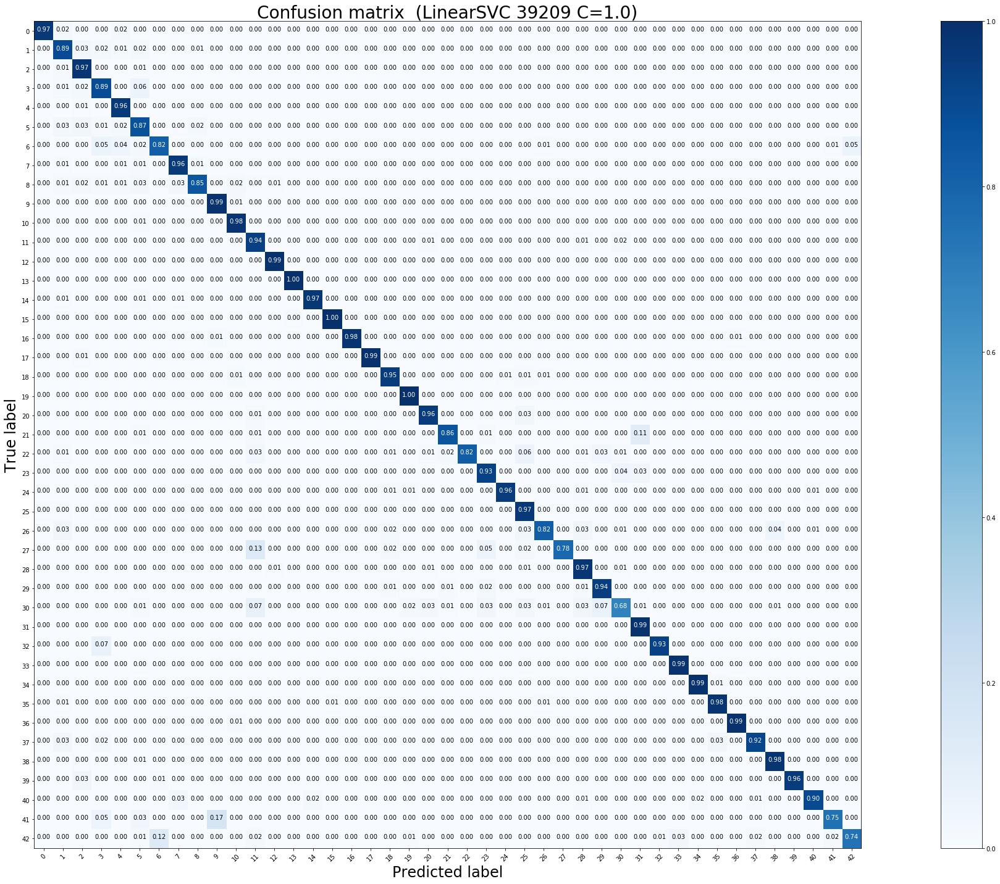

Test accuracy:  0.9426761678543151 

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        60
           1       0.91      0.89      0.90       720
           2       0.90      0.97      0.94       750
           3       0.90      0.89      0.89       450
           4       0.95      0.96      0.95       660
           5       0.86      0.87      0.86       630
           6       0.91      0.82      0.86       150
           7       0.93      0.96      0.95       450
           8       0.93      0.85      0.89       450
           9       0.95      0.99      0.97       480
          10       0.97      0.98      0.97       660
          11       0.93      0.94      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.96      0.97      0.97       270
          15       0.98      1.00      0.99       210
          16       0.99      0.98      0.98 

In [5]:
##############################################################################
##############################################################################
##############################################################################
###########   LinearSVC, HOG, squared_hinge, seed=1, random_B, without_scaler ########
###########   Defaultwerte   #################################################
##############################################################################

train_LinearSVC_sq(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen B/", "seed_1_random_B_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")

In [6]:
#########################################################################
##########   3. Aufteilung der Trainingsdaten 
##########   gemäss   make_training_subset_C
#########################################################################

X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200 = make_training_subsets_C(X_train_9_4_2_hue, y_train)


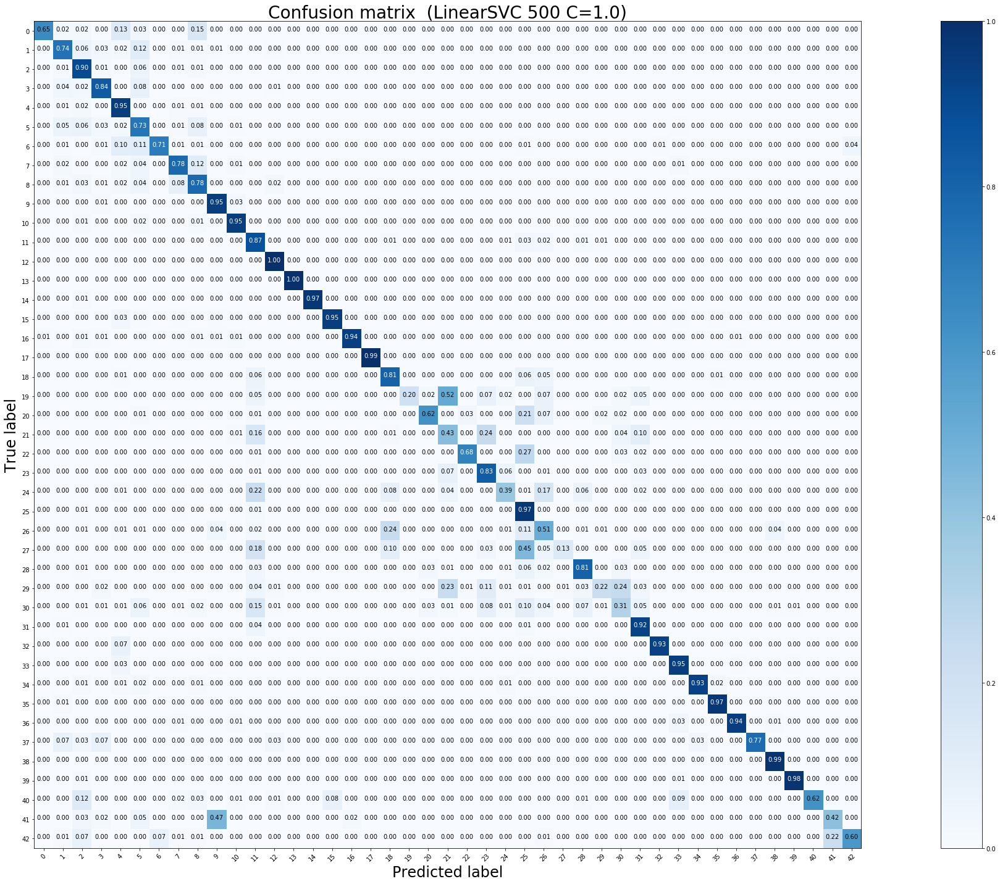

Test accuracy:  0.8553444180522566 

              precision    recall  f1-score   support

           0       0.95      0.65      0.77        60
           1       0.85      0.74      0.79       720
           2       0.80      0.90      0.85       750
           3       0.85      0.84      0.84       450
           4       0.86      0.95      0.90       660
           5       0.64      0.73      0.69       630
           6       0.95      0.71      0.81       150
           7       0.83      0.78      0.81       450
           8       0.70      0.78      0.73       450
           9       0.90      0.95      0.92       480
          10       0.94      0.95      0.95       660
          11       0.75      0.87      0.80       420
          12       0.97      1.00      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      0.97      0.98       270
          15       0.95      0.95      0.95       210
          16       0.97      0.94      0.96 

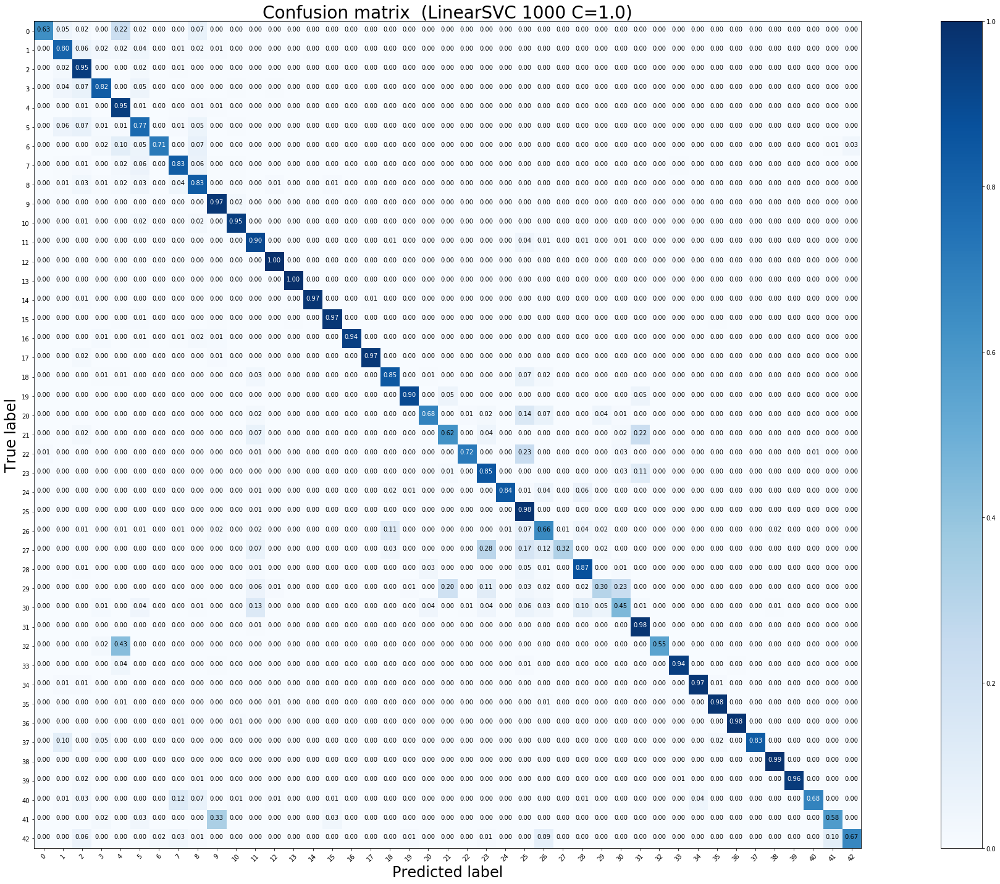

Test accuracy:  0.8878859857482185 

              precision    recall  f1-score   support

           0       0.90      0.63      0.75        60
           1       0.87      0.80      0.83       720
           2       0.80      0.95      0.87       750
           3       0.88      0.82      0.85       450
           4       0.85      0.95      0.90       660
           5       0.77      0.77      0.77       630
           6       0.96      0.71      0.82       150
           7       0.87      0.83      0.85       450
           8       0.76      0.83      0.79       450
           9       0.90      0.97      0.93       480
          10       0.96      0.95      0.96       660
          11       0.86      0.90      0.88       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.95      0.97      0.96       210
          16       0.99      0.94      0.96 

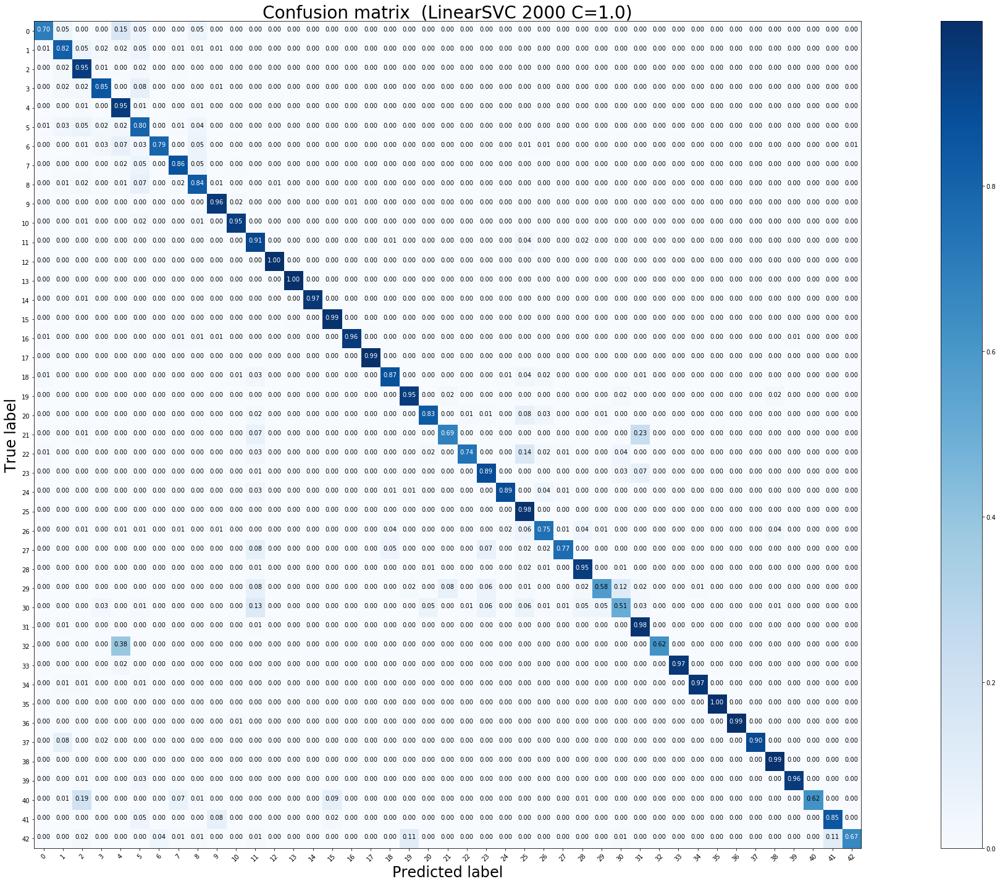

Test accuracy:  0.9078384798099762 

              precision    recall  f1-score   support

           0       0.70      0.70      0.70        60
           1       0.90      0.82      0.85       720
           2       0.84      0.95      0.89       750
           3       0.90      0.85      0.87       450
           4       0.86      0.95      0.91       660
           5       0.73      0.80      0.77       630
           6       0.94      0.79      0.86       150
           7       0.91      0.86      0.89       450
           8       0.81      0.84      0.82       450
           9       0.95      0.96      0.96       480
          10       0.97      0.95      0.96       660
          11       0.85      0.91      0.88       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.93      0.99      0.96       210
          16       0.98      0.96      0.97 

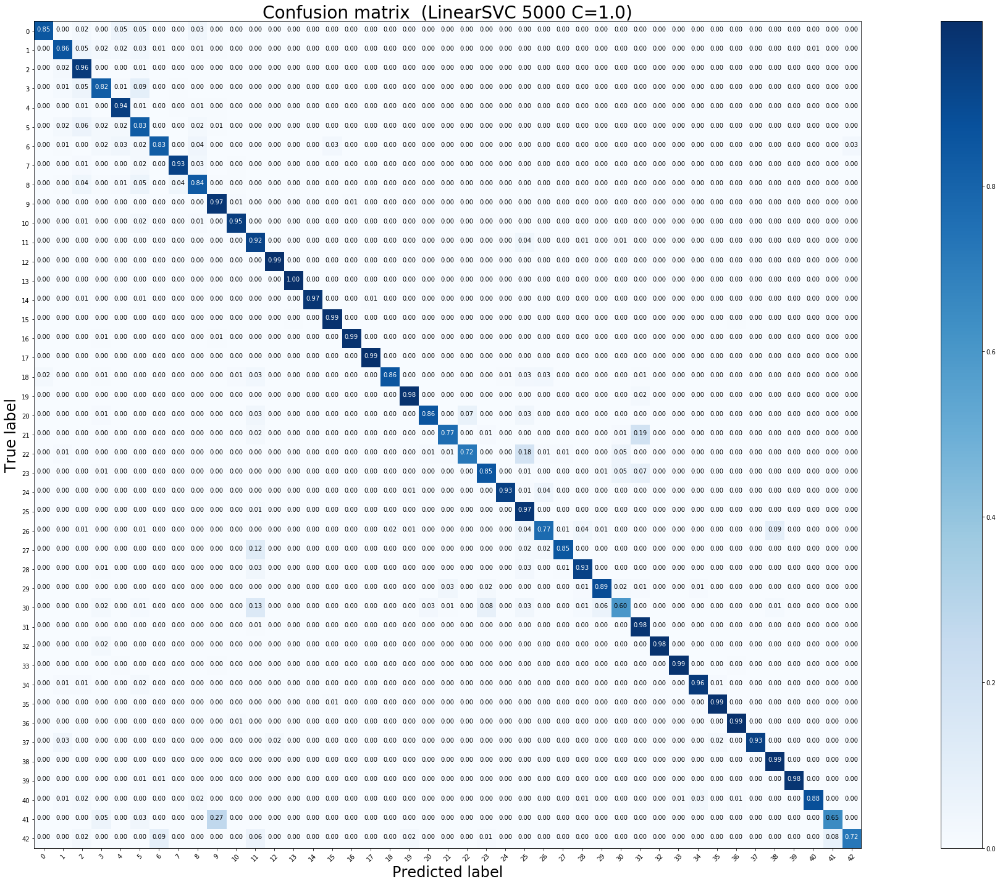

Test accuracy:  0.9224069675376089 

              precision    recall  f1-score   support

           0       0.84      0.85      0.84        60
           1       0.93      0.86      0.89       720
           2       0.84      0.96      0.89       750
           3       0.88      0.82      0.85       450
           4       0.93      0.94      0.94       660
           5       0.78      0.83      0.81       630
           6       0.90      0.83      0.86       150
           7       0.94      0.93      0.94       450
           8       0.88      0.84      0.86       450
           9       0.93      0.97      0.95       480
          10       0.97      0.95      0.96       660
          11       0.86      0.92      0.89       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.95      0.99      0.97       210
          16       0.97      0.99      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


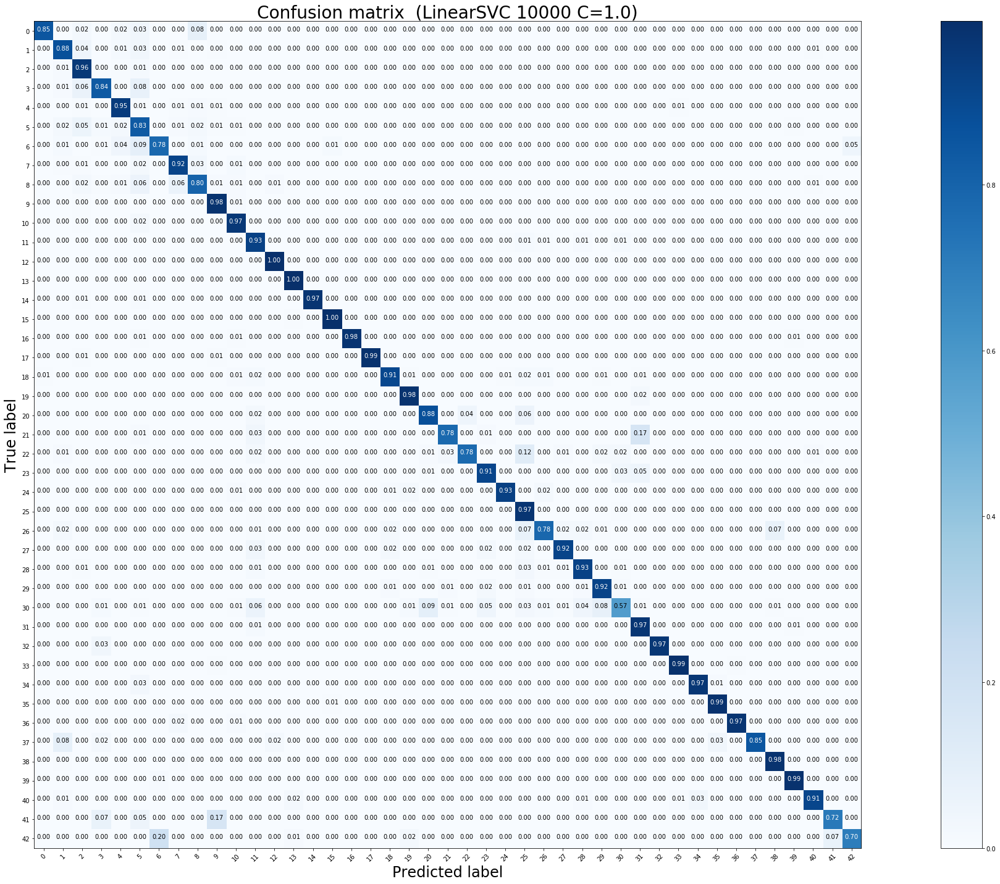

Test accuracy:  0.9262074425969913 

              precision    recall  f1-score   support

           0       0.88      0.85      0.86        60
           1       0.94      0.88      0.91       720
           2       0.85      0.96      0.90       750
           3       0.94      0.84      0.88       450
           4       0.94      0.95      0.95       660
           5       0.77      0.83      0.80       630
           6       0.85      0.78      0.81       150
           7       0.90      0.92      0.91       450
           8       0.89      0.80      0.84       450
           9       0.94      0.98      0.96       480
          10       0.95      0.97      0.96       660
          11       0.92      0.93      0.92       420
          12       0.99      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      0.97      0.99       270
          15       0.97      1.00      0.98       210
          16       0.99      0.98      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


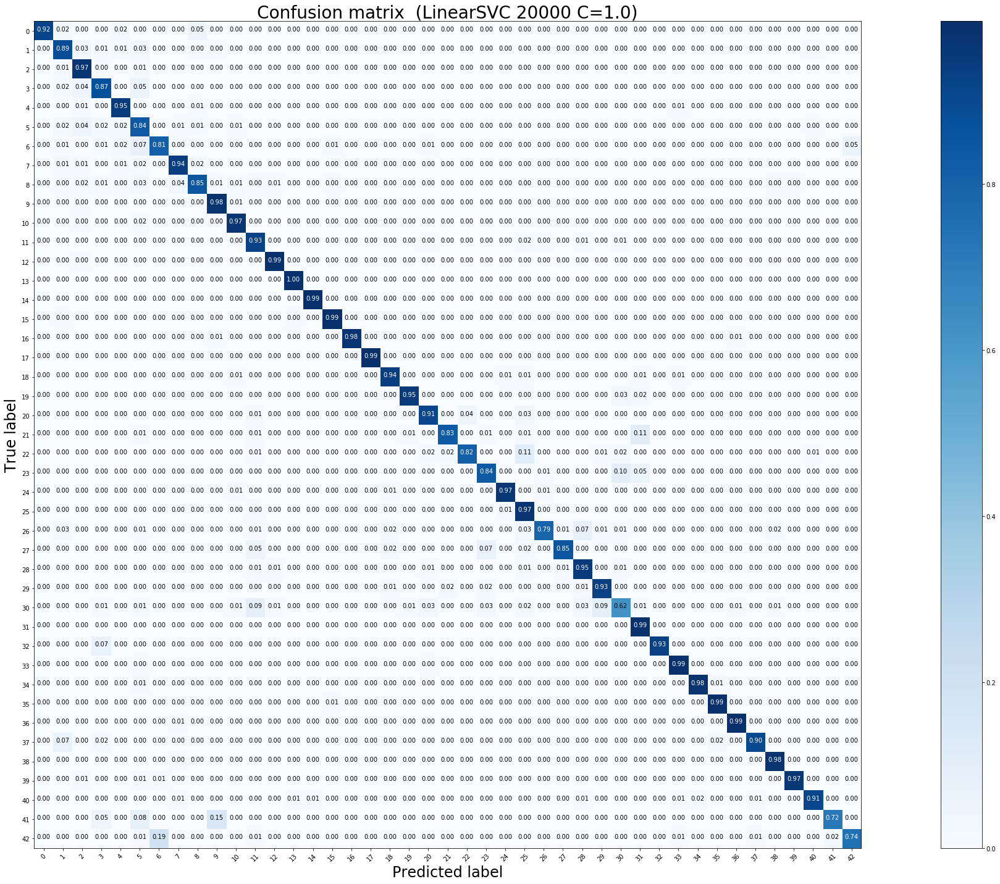

Test accuracy:  0.935471100554236 

              precision    recall  f1-score   support

           0       0.93      0.92      0.92        60
           1       0.92      0.89      0.90       720
           2       0.88      0.97      0.92       750
           3       0.91      0.87      0.89       450
           4       0.95      0.95      0.95       660
           5       0.82      0.84      0.83       630
           6       0.86      0.81      0.84       150
           7       0.93      0.94      0.93       450
           8       0.93      0.85      0.89       450
           9       0.95      0.98      0.97       480
          10       0.96      0.97      0.96       660
          11       0.93      0.93      0.93       420
          12       0.98      0.99      0.99       690
          13       0.99      1.00      0.99       720
          14       0.98      0.99      0.99       270
          15       0.96      0.99      0.97       210
          16       0.98      0.98      0.98  

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


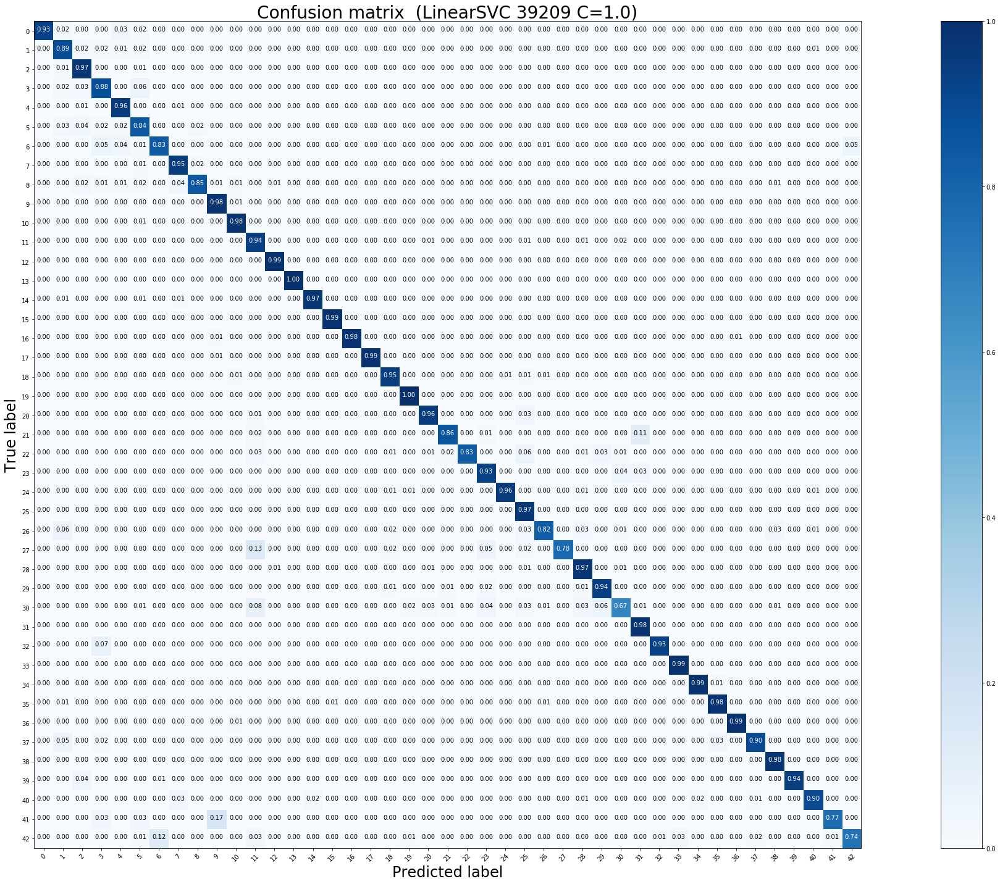

Test accuracy:  0.9400633412509897 

              precision    recall  f1-score   support

           0       0.97      0.93      0.95        60
           1       0.91      0.89      0.90       720
           2       0.90      0.97      0.93       750
           3       0.89      0.88      0.89       450
           4       0.94      0.96      0.95       660
           5       0.87      0.84      0.86       630
           6       0.91      0.83      0.87       150
           7       0.92      0.95      0.94       450
           8       0.93      0.85      0.89       450
           9       0.95      0.98      0.97       480
          10       0.97      0.98      0.97       660
          11       0.92      0.94      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.96      0.97      0.97       270
          15       0.97      0.99      0.98       210
          16       0.99      0.98      0.98 

In [7]:
##############################################################################
##############################################################################
##############################################################################
###########   LinearSVC, HOG, hinge, seed=1, random_C, without_scaler ########
###########   Defaultwerte   #################################################
##############################################################################

train_LinearSVC(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler", "HOG_942_balanced.pkl")

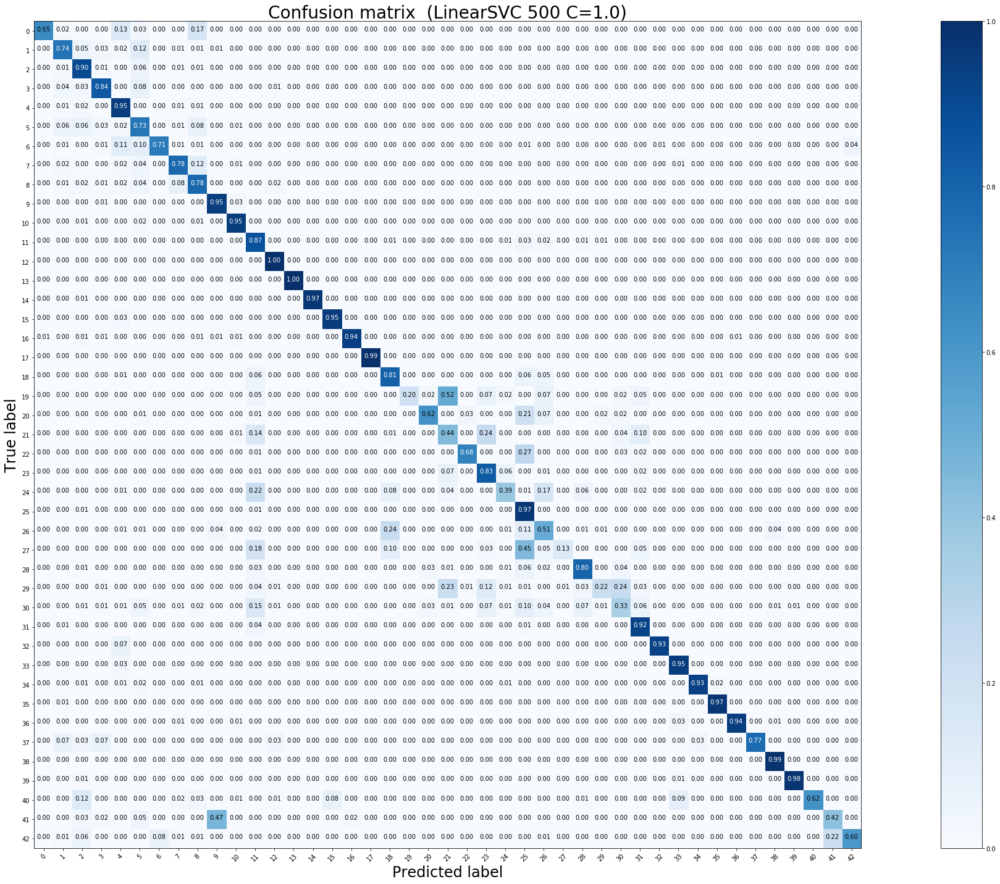

Test accuracy:  0.8561361836896278 

              precision    recall  f1-score   support

           0       0.95      0.65      0.77        60
           1       0.85      0.74      0.79       720
           2       0.81      0.90      0.85       750
           3       0.85      0.84      0.84       450
           4       0.86      0.95      0.90       660
           5       0.65      0.73      0.69       630
           6       0.94      0.71      0.81       150
           7       0.83      0.78      0.81       450
           8       0.70      0.78      0.74       450
           9       0.90      0.95      0.93       480
          10       0.95      0.95      0.95       660
          11       0.75      0.87      0.81       420
          12       0.97      1.00      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      0.97      0.98       270
          15       0.95      0.95      0.95       210
          16       0.97      0.94      0.96 

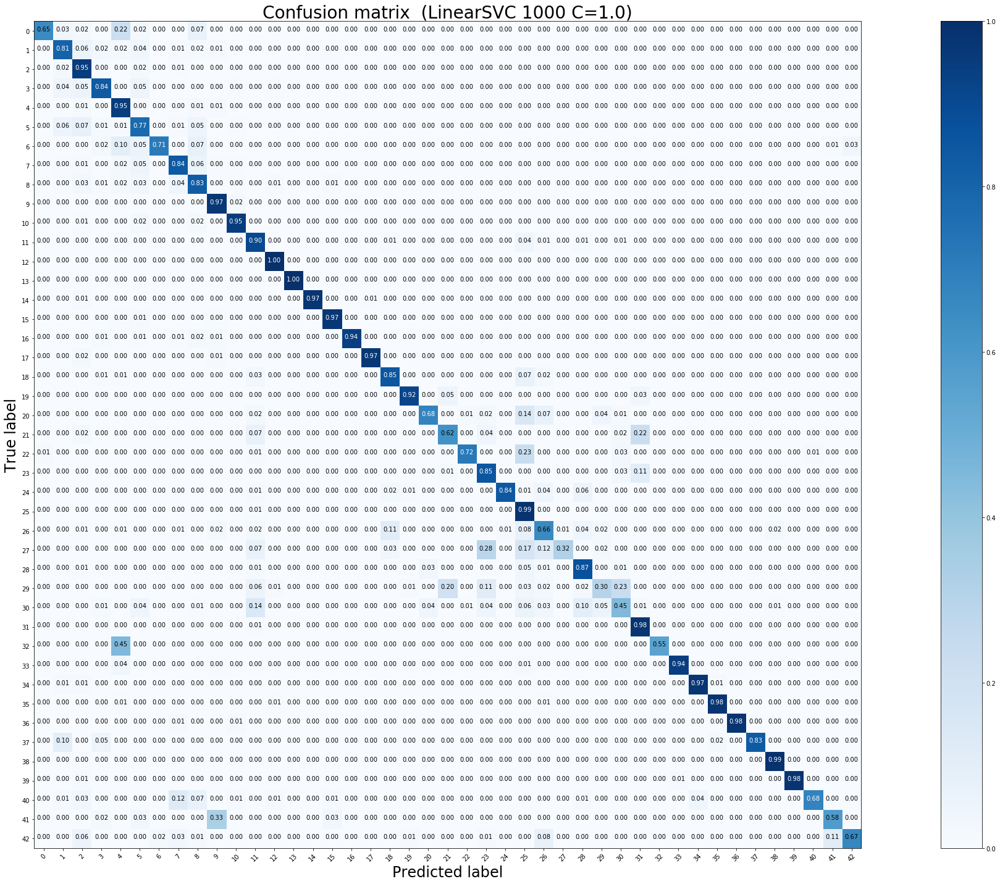

Test accuracy:  0.8895486935866983 

              precision    recall  f1-score   support

           0       0.93      0.65      0.76        60
           1       0.87      0.81      0.84       720
           2       0.81      0.95      0.87       750
           3       0.88      0.84      0.86       450
           4       0.85      0.95      0.90       660
           5       0.78      0.77      0.78       630
           6       0.96      0.71      0.82       150
           7       0.87      0.84      0.85       450
           8       0.76      0.83      0.79       450
           9       0.90      0.97      0.93       480
          10       0.96      0.95      0.96       660
          11       0.86      0.90      0.88       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.95      0.97      0.96       210
          16       0.99      0.94      0.96 

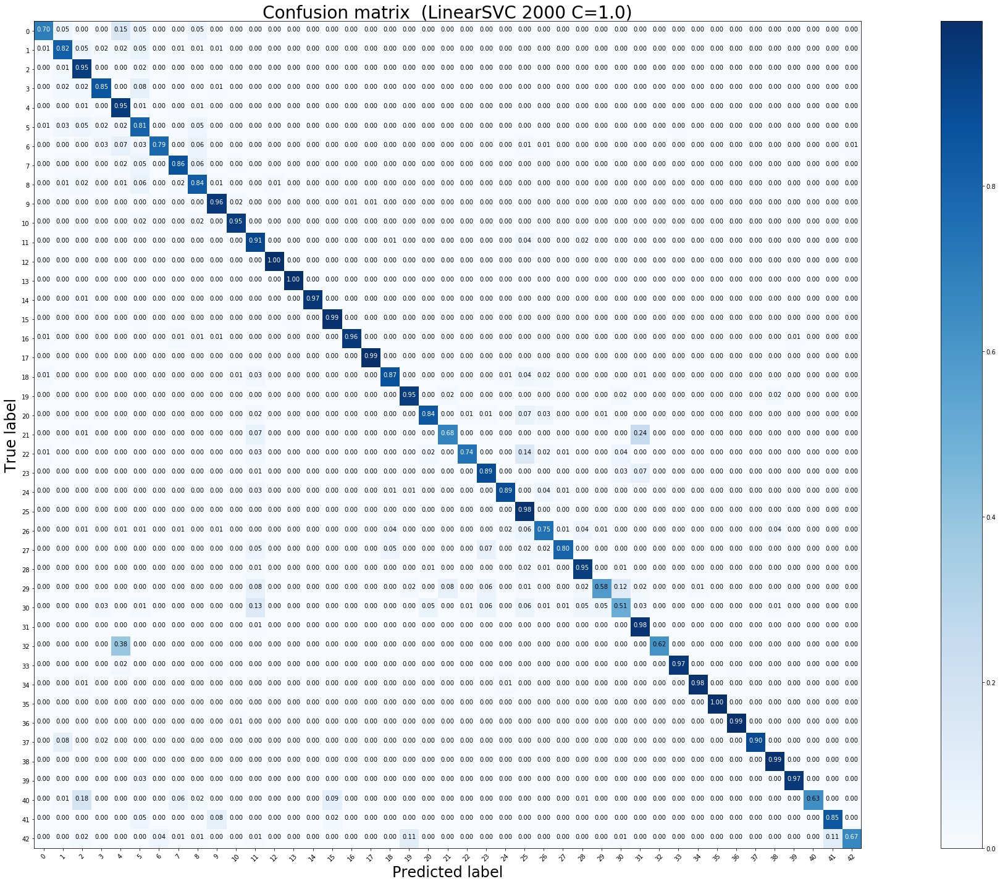

Test accuracy:  0.9089469517022961 

              precision    recall  f1-score   support

           0       0.70      0.70      0.70        60
           1       0.90      0.82      0.86       720
           2       0.85      0.95      0.90       750
           3       0.90      0.85      0.88       450
           4       0.86      0.95      0.91       660
           5       0.74      0.81      0.77       630
           6       0.95      0.79      0.86       150
           7       0.91      0.86      0.89       450
           8       0.80      0.84      0.82       450
           9       0.95      0.96      0.96       480
          10       0.97      0.95      0.96       660
          11       0.86      0.91      0.88       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.93      0.99      0.96       210
          16       0.98      0.96      0.97 

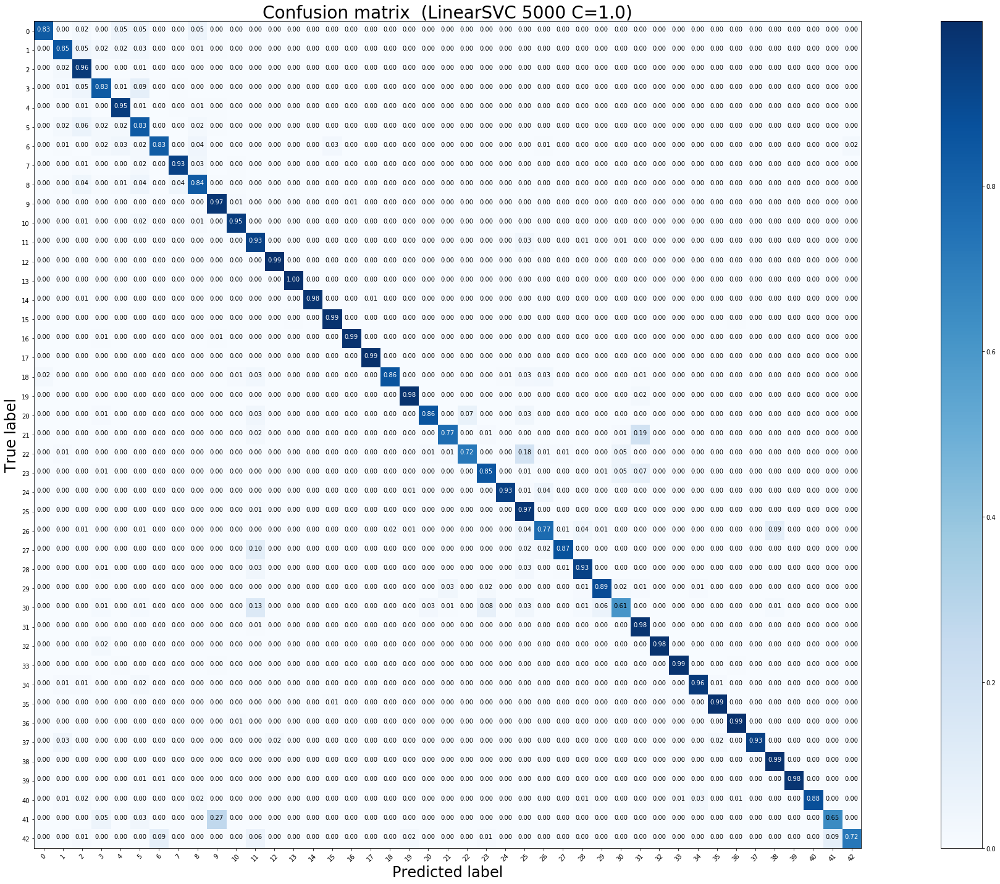

Test accuracy:  0.923673792557403 

              precision    recall  f1-score   support

           0       0.83      0.83      0.83        60
           1       0.93      0.85      0.89       720
           2       0.84      0.96      0.90       750
           3       0.89      0.83      0.86       450
           4       0.93      0.95      0.94       660
           5       0.80      0.83      0.82       630
           6       0.91      0.83      0.86       150
           7       0.94      0.93      0.93       450
           8       0.87      0.84      0.86       450
           9       0.93      0.97      0.95       480
          10       0.97      0.95      0.96       660
          11       0.87      0.93      0.90       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.99      0.98      0.99       270
          15       0.95      0.99      0.97       210
          16       0.97      0.99      0.98  

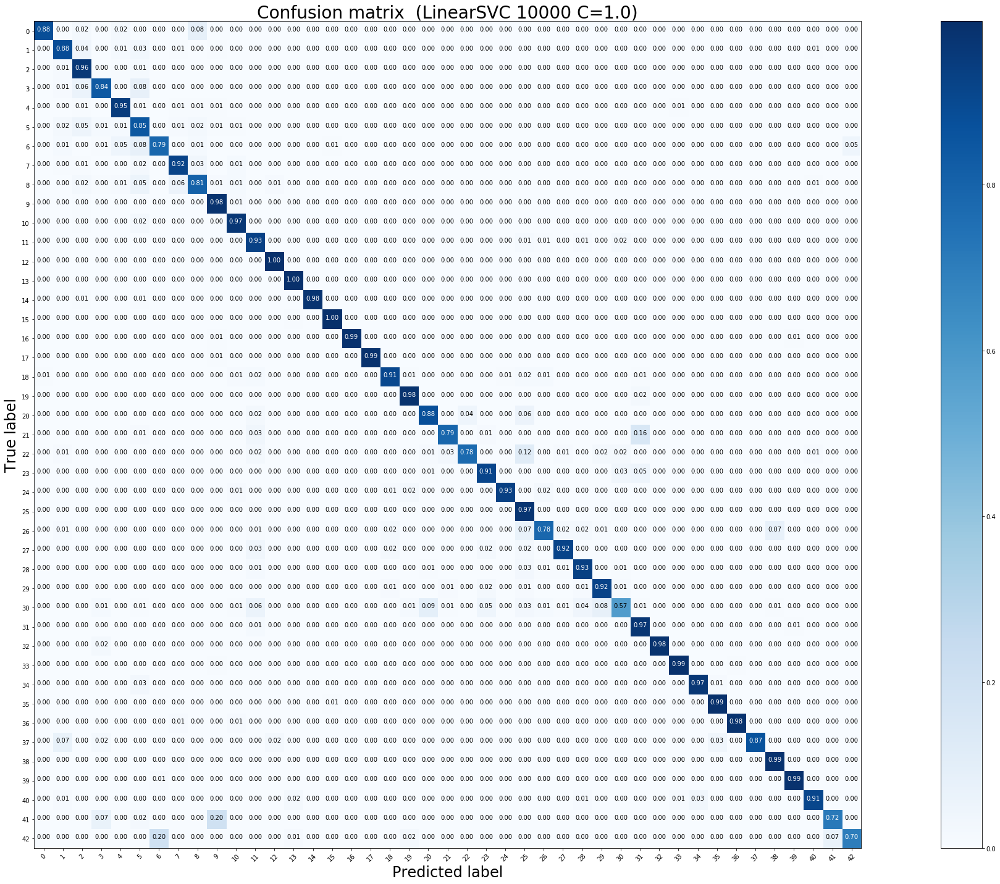

Test accuracy:  0.9293745051464767 

              precision    recall  f1-score   support

           0       0.88      0.88      0.88        60
           1       0.94      0.88      0.91       720
           2       0.86      0.96      0.91       750
           3       0.94      0.84      0.88       450
           4       0.95      0.95      0.95       660
           5       0.80      0.85      0.82       630
           6       0.85      0.79      0.82       150
           7       0.90      0.92      0.91       450
           8       0.89      0.81      0.85       450
           9       0.93      0.98      0.96       480
          10       0.95      0.97      0.96       660
          11       0.92      0.93      0.93       420
          12       0.99      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       1.00      0.98      0.99       270
          15       0.97      1.00      0.98       210
          16       0.99      0.99      0.99 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


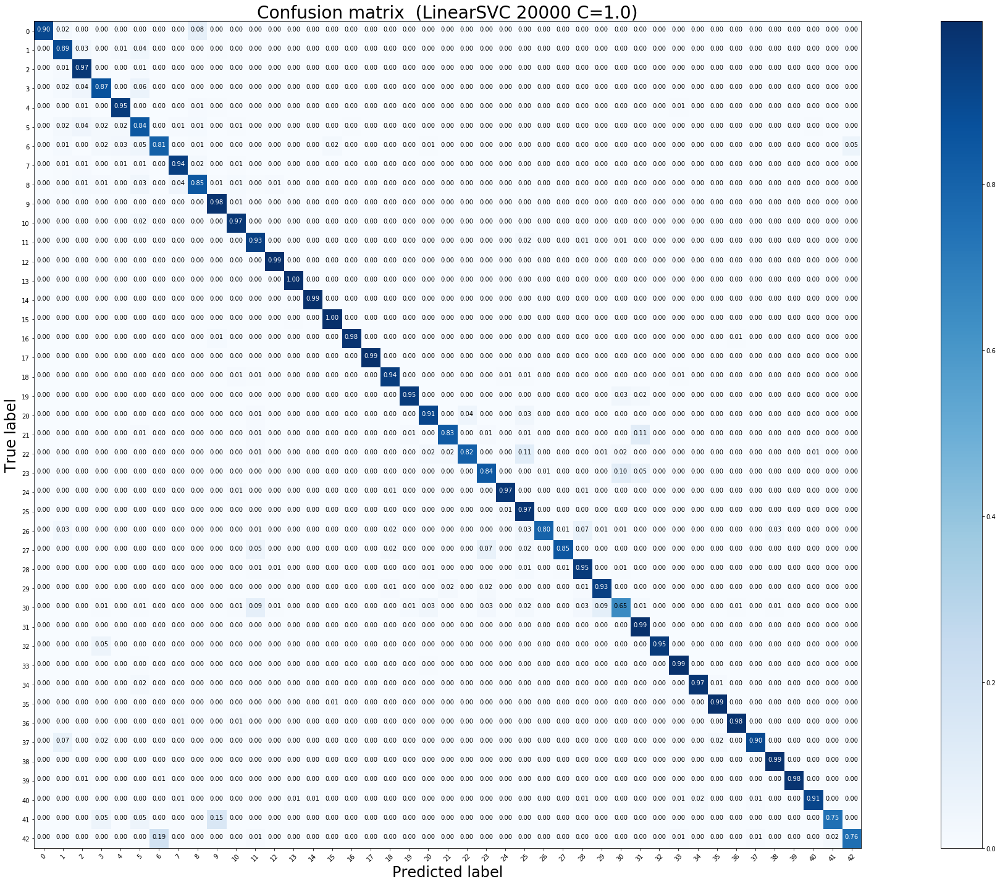

Test accuracy:  0.9365003958828186 

              precision    recall  f1-score   support

           0       0.93      0.90      0.92        60
           1       0.93      0.89      0.91       720
           2       0.88      0.97      0.92       750
           3       0.91      0.87      0.89       450
           4       0.95      0.95      0.95       660
           5       0.82      0.84      0.83       630
           6       0.86      0.81      0.83       150
           7       0.93      0.94      0.93       450
           8       0.92      0.85      0.88       450
           9       0.95      0.98      0.97       480
          10       0.95      0.97      0.96       660
          11       0.93      0.93      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      0.99       720
          14       0.99      0.99      0.99       270
          15       0.96      1.00      0.98       210
          16       0.97      0.98      0.98 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


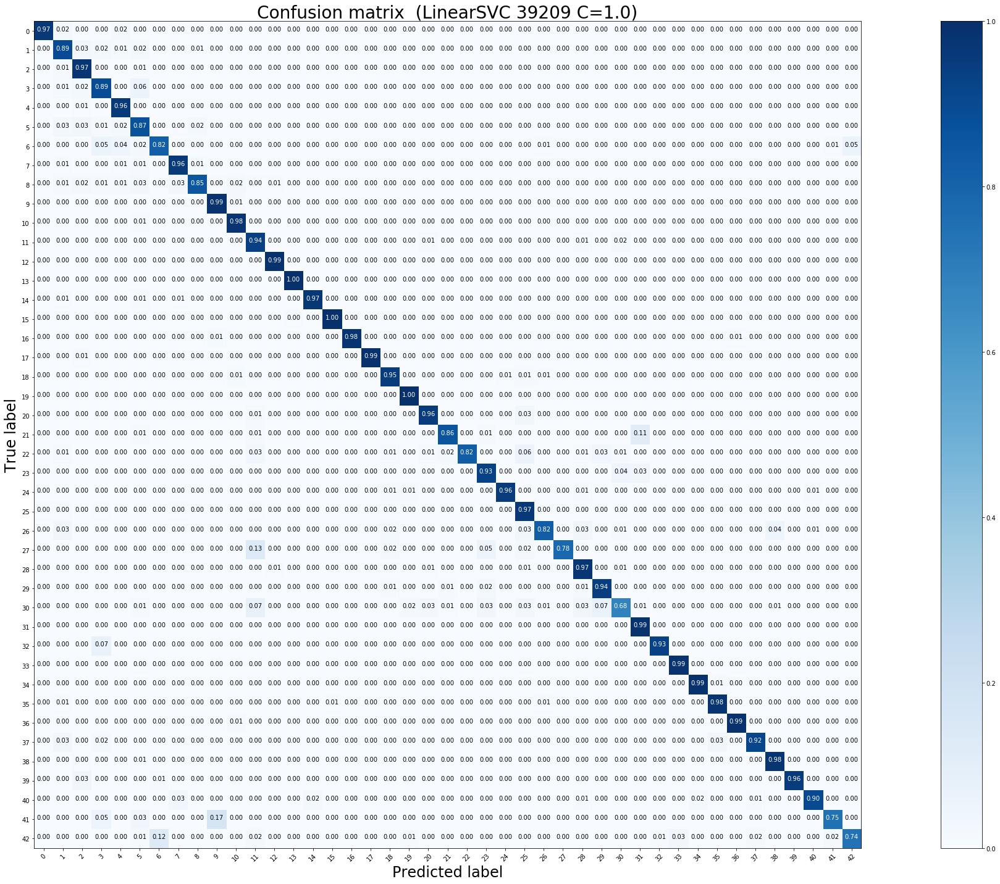

Test accuracy:  0.9426761678543151 

              precision    recall  f1-score   support

           0       0.95      0.97      0.96        60
           1       0.91      0.89      0.90       720
           2       0.90      0.97      0.94       750
           3       0.90      0.89      0.89       450
           4       0.95      0.96      0.95       660
           5       0.86      0.87      0.86       630
           6       0.90      0.82      0.86       150
           7       0.93      0.96      0.95       450
           8       0.93      0.85      0.89       450
           9       0.95      0.99      0.97       480
          10       0.97      0.98      0.97       660
          11       0.93      0.94      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      1.00      1.00       720
          14       0.96      0.97      0.97       270
          15       0.98      1.00      0.99       210
          16       0.99      0.98      0.98 

In [8]:
###########################################################################
##############################################################################
##############################################################################
###########   LinearSVC, HOG, squared_hinge, seed=1, random_C, without_scaler ########
###########   Defaultwerte   #################################################
##############################################################################

train_LinearSVC_sq(X_tr_500, X_test_9_4_2_hue, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_1000, X_test_9_4_2_hue, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_2000, X_test_9_4_2_hue, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_5000, X_test_9_4_2_hue, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_10000, X_test_9_4_2_hue, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr_20000, X_test_9_4_2_hue, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")
train_LinearSVC_sq(X_tr, X_test_9_4_2_hue, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default_ski_l2_hys_hue_256/LinearSVC/Neue Mengen C/", "seed_1_random_C_without_scaler_l2_sq_hinge", "HOG_942_balanced.pkl")